<a href="https://colab.research.google.com/github/bangaru01/C_programing/blob/main/NatSyn_Visulization_Descriptors_maps_V1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## STEP 1 — Setup, read structures, and identify NN/NO/NS

In [ ]:
# ============================================================
# STEP 1
# NN / NO / NS STRUCTURAL-VISUALIZATION WORKFLOW
# Setup + read XYZ structures
# ============================================================

!pip -q install morfeus-ml numpy pandas scipy matplotlib

from google.colab import drive
drive.mount("/content/drive")

import os
import re
import glob
import math

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.spatial.transform import Rotation

from morfeus import (
    BuriedVolume,
    Sterimol,
    SolidAngle,
    Pyramidalization,
    read_xyz,
)


# ============================================================
# USER PATHS
# ============================================================

XYZ_FOLDER = "/content/drive/MyDrive/Nat_Syn-DM"

OUTPUT_FOLDER = (
    "/content/drive/MyDrive/"
    "Nat_Syn_DM_NN_NO_NS_Visualizations"
)

os.makedirs(OUTPUT_FOLDER, exist_ok=True)


# Individual output folders
GEOMETRY_FOLDER = os.path.join(
    OUTPUT_FOLDER,
    "01_Coordination_Geometry"
)

VBUR_FOLDER = os.path.join(
    OUTPUT_FOLDER,
    "02_Buried_Volume"
)

QUADRANT_FOLDER = os.path.join(
    OUTPUT_FOLDER,
    "03_Quadrant_Maps"
)

DONOR_PATH_FOLDER = os.path.join(
    OUTPUT_FOLDER,
    "04_Donor_Framework"
)

DISTAL_FOLDER = os.path.join(
    OUTPUT_FOLDER,
    "05_Distal_Sterics"
)

STERIMOL_FOLDER = os.path.join(
    OUTPUT_FOLDER,
    "06_Sterimol"
)

SOLID_ANGLE_FOLDER = os.path.join(
    OUTPUT_FOLDER,
    "07_Solid_Angle"
)

for folder in [
    GEOMETRY_FOLDER,
    VBUR_FOLDER,
    QUADRANT_FOLDER,
    DONOR_PATH_FOLDER,
    DISTAL_FOLDER,
    STERIMOL_FOLDER,
    SOLID_ANGLE_FOLDER,
]:
    os.makedirs(folder, exist_ok=True)


# ============================================================
# ATOM NUMBERING
# ============================================================

PD_ATOM = 1

SUBSTRATE_START = 2
SUBSTRATE_END = 19

LIGAND_START = 20


# ============================================================
# LIGAND CLASSES
# ============================================================

LIGAND_CLASSES = {

    # NN
    "L10": "NN",
    "L12": "NN",
    "L13": "NN",
    "L14": "NN",
    "L18": "NN",
    "L19": "NN",

    # NO
    "L11": "NO",
    "L15": "NO",
    "L16": "NO",
    "L17": "NO",

    # NS
    "L20": "NS",
    "L21": "NS",
    "L22": "NS",
    "L23": "NS",
    "L24": "NS",
    "L25": "NS",
}

# L26 intentionally excluded from this NN/NO/NS comparison
# because it is N/pi coordinated.


# ============================================================
# YIELD DATA
# ============================================================

YIELD_DATA = {
    "L10": 0,
    "L11": 1,
    "L12": 7,
    "L13": 0,
    "L14": 0,
    "L15": 0,
    "L16": 0,
    "L17": 0,
    "L18": 0,
    "L19": 25,
    "L20": 70,
    "L21": 64,
    "L22": 57,
    "L23": 55,
    "L24": 50,
    "L25": 9,
}


# ============================================================
# ELEMENT NORMALIZATION
# ============================================================

def normalize_element(element):
    element = str(element).strip()

    if len(element) == 1:
        return element.upper()

    return (
        element[0].upper()
        + element[1:].lower()
    )


# ============================================================
# CLEAN LIGAND NAME
# ============================================================

def clean_ligand_name(filepath):

    filename = os.path.basename(filepath)

    match = re.search(
        r"(L\d+)",
        filename,
        flags=re.IGNORECASE,
    )

    if match:
        return match.group(1).upper()

    return os.path.splitext(filename)[0]


# ============================================================
# SIMPLE XYZ READER
# ============================================================

def read_xyz_file(filepath):

    with open(filepath, "r") as file:
        lines = file.readlines()

    number_atoms = int(
        lines[0].strip()
    )

    elements = []
    coordinates = []

    for line in lines[2:2 + number_atoms]:

        parts = line.split()

        if len(parts) < 4:
            continue

        elements.append(
            normalize_element(parts[0])
        )

        coordinates.append([
            float(parts[1]),
            float(parts[2]),
            float(parts[3]),
        ])

    return (
        np.array(elements),
        np.array(
            coordinates,
            dtype=float,
        ),
    )


# ============================================================
# DISTANCE
# ============================================================

def distance(coord1, coord2):

    return float(
        np.linalg.norm(
            np.asarray(coord1)
            - np.asarray(coord2)
        )
    )


# ============================================================
# FIND XYZ FILES
# ============================================================

xyz_files = sorted(
    glob.glob(
        os.path.join(
            XYZ_FOLDER,
            "*.xyz",
        )
    )
)


print("=" * 80)
print("XYZ FILES FOUND")
print("=" * 80)

for filepath in xyz_files:

    ligand = clean_ligand_name(filepath)

    if ligand not in LIGAND_CLASSES:
        continue

    print(
        ligand,
        LIGAND_CLASSES[ligand],
        os.path.basename(filepath),
    )

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.0/101.0 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 4.9 MB/s eta 0:00:00
Mounted at /content/drive
XYZ FILES FOUND
L10 NN L10.xyz
L11 NO L11.xyz
L12 NN L12.xyz
L13 NN L13.xyz
L14 NN L14.xyz
L15 NO L15.xyz
L16 NO L16.xyz
L17 NO L17.xyz
L18 NN L18.xyz
L19 NN L19.xyz
L20 NS L20.xyz
L21 NS L21.xyz
L22 NS L22.xyz
L23 NS L23.xyz
L24 NS L24.xyz
L25 NS L25.xyz


## STEP 2 — Automatically identify Pd donor atoms

In [ ]:
# ============================================================
# STEP 2
# IDENTIFY Pd DONORS
# ============================================================

DONOR_DISTANCE_WINDOWS = {

    "N": (1.90, 2.40),

    "O": (1.90, 2.40),

    "S": (2.25, 2.75),
}


def find_pd_donors(
    elements,
    coordinates,
):

    pd_index = PD_ATOM - 1

    pd_coord = coordinates[pd_index]

    candidates = []

    # Search ligand atoms only
    for atom_number in range(
        LIGAND_START,
        len(elements) + 1,
    ):

        element = elements[
            atom_number - 1
        ]

        if element not in [
            "N",
            "O",
            "S",
        ]:
            continue

        current_distance = distance(
            pd_coord,
            coordinates[
                atom_number - 1
            ],
        )

        lower, upper = (
            DONOR_DISTANCE_WINDOWS[element]
        )

        if lower <= current_distance <= upper:

            candidates.append({
                "Atom": atom_number,
                "Element": element,
                "Distance": current_distance,
            })

    candidates = sorted(
        candidates,
        key=lambda x: x["Distance"],
    )

    return candidates

In [ ]:
# ============================================================
# EXPECTED DONOR PAIRS
# ============================================================

EXPECTED_DONORS = {
    "NN": ["N", "N"],
    "NO": ["N", "O"],
    "NS": ["N", "S"],
}


def select_donor_pair(
    ligand_class,
    candidates,
):

    expected = sorted(
        EXPECTED_DONORS[
            ligand_class
        ]
    )

    # Try every pair
    for i in range(
        len(candidates)
    ):

        for j in range(
            i + 1,
            len(candidates)
        ):

            pair = [
                candidates[i],
                candidates[j],
            ]

            elements_pair = sorted([
                pair[0]["Element"],
                pair[1]["Element"],
            ])

            if elements_pair == expected:

                return pair

    return None

In [ ]:
donor_records = []


for filepath in xyz_files:

    ligand = clean_ligand_name(
        filepath
    )

    if ligand not in LIGAND_CLASSES:
        continue

    ligand_class = (
        LIGAND_CLASSES[ligand]
    )

    elements, coordinates = (
        read_xyz_file(filepath)
    )

    candidates = find_pd_donors(
        elements,
        coordinates,
    )

    pair = select_donor_pair(
        ligand_class,
        candidates,
    )

    if pair is None:

        print(
            "WARNING:",
            ligand,
            "donor pair not found",
        )

        continue

    donor_records.append({

        "Ligand": ligand,

        "Class": ligand_class,

        "Donor1Atom":
            pair[0]["Atom"],

        "Donor1Element":
            pair[0]["Element"],

        "Pd_Donor1":
            pair[0]["Distance"],

        "Donor2Atom":
            pair[1]["Atom"],

        "Donor2Element":
            pair[1]["Element"],

        "Pd_Donor2":
            pair[1]["Distance"],
    })


donor_df = pd.DataFrame(
    donor_records
)


display(donor_df)

,Ligand,Class,Donor1Atom,Donor1Element,Pd_Donor1,Donor2Atom,Donor2Element,Pd_Donor2
0,L10,NN,20,N,2.106736,23,N,2.218469
1,L11,NO,20,N,2.114977,24,O,2.311206
2,L12,NN,20,N,2.100926,24,N,2.168497
3,L13,NN,20,N,2.112562,23,N,2.126745
4,L14,NN,20,N,2.120567,23,N,2.286403
5,L15,NO,20,N,2.093161,24,O,2.377335
6,L16,NO,20,N,2.089185,24,O,2.384998
7,L18,NN,20,N,2.104112,24,N,2.274664
8,L20,NS,20,N,2.096311,24,S,2.540380
9,L21,NS,20,N,2.098302,24,S,2.525913


## STEP 3 — Calculate the coordination geometry used in the pictures

In [ ]:
# ============================================================
# STEP 3
# COORDINATION GEOMETRY
# ============================================================

def angle_three_atoms(
    coord1,
    vertex,
    coord2,
):

    vector1 = (
        np.asarray(coord1)
        - np.asarray(vertex)
    )

    vector2 = (
        np.asarray(coord2)
        - np.asarray(vertex)
    )

    vector1 /= np.linalg.norm(
        vector1
    )

    vector2 /= np.linalg.norm(
        vector2
    )

    cosine = np.clip(
        np.dot(
            vector1,
            vector2,
        ),
        -1.0,
        1.0,
    )

    return float(
        np.degrees(
            np.arccos(cosine)
        )
    )

In [ ]:
geometry_records = []


for filepath in xyz_files:

    ligand = clean_ligand_name(
        filepath
    )

    if ligand not in LIGAND_CLASSES:
        continue

    ligand_class = (
        LIGAND_CLASSES[ligand]
    )

    elements, coordinates = (
        read_xyz_file(filepath)
    )

    candidates = find_pd_donors(
        elements,
        coordinates,
    )

    pair = select_donor_pair(
        ligand_class,
        candidates,
    )

    if pair is None:
        continue

    donor1 = pair[0]["Atom"]
    donor2 = pair[1]["Atom"]

    pd_coord = coordinates[
        PD_ATOM - 1
    ]

    d1_coord = coordinates[
        donor1 - 1
    ]

    d2_coord = coordinates[
        donor2 - 1
    ]

    pd_d1 = distance(
        pd_coord,
        d1_coord,
    )

    pd_d2 = distance(
        pd_coord,
        d2_coord,
    )

    donor_distance = distance(
        d1_coord,
        d2_coord,
    )

    bite_angle = angle_three_atoms(
        d1_coord,
        pd_coord,
        d2_coord,
    )

    delta_pd = abs(
        pd_d1 - pd_d2
    )

    geometry_records.append({

        "Ligand": ligand,
        "Class": ligand_class,
        "Yield": YIELD_DATA[ligand],

        "Donor1":
            f"{pair[0]['Element']}{donor1}",

        "Donor2":
            f"{pair[1]['Element']}{donor2}",

        "Pd_D1_A":
            pd_d1,

        "Pd_D2_A":
            pd_d2,

        "Delta_Pd_Donor_A":
            delta_pd,

        "D1_D2_A":
            donor_distance,

        "BiteAngle_deg":
            bite_angle,
    })


geometry_df = pd.DataFrame(
    geometry_records
)


display(
    geometry_df.round(3)
)

,Ligand,Class,Yield,Donor1,Donor2,Pd_D1_A,Pd_D2_A,Delta_Pd_Donor_A,D1_D2_A,BiteAngle_deg
0,L10,NN,0,N20,N23,2.107,2.218,0.112,2.643,75.300
1,L11,NO,1,N20,O24,2.115,2.311,0.196,2.857,80.278
2,L12,NN,7,N20,N24,2.101,2.168,0.068,2.876,84.688
3,L13,NN,0,N20,N23,2.113,2.127,0.014,2.649,77.331
4,L14,NN,0,N20,N23,2.121,2.286,0.166,2.697,75.362
5,L15,NO,0,N20,O24,2.093,2.377,0.284,2.828,78.203
6,L16,NO,0,N20,O24,2.089,2.385,0.296,2.803,77.266
7,L18,NN,0,N20,N24,2.104,2.275,0.171,2.810,79.735
8,L20,NS,70,N20,S24,2.096,2.540,0.444,3.010,80.340
9,L21,NS,64,N20,S24,2.098,2.526,0.428,3.020,80.981


## STEP 4 — Put every complex into the SAME coordinate system

In [ ]:
# ============================================================
# STEP 4
# COMMON Pd-CENTERED COORDINATE SYSTEM
# ============================================================

def normalize_vector(vector):

    vector = np.asarray(
        vector,
        dtype=float,
    )

    norm = np.linalg.norm(
        vector
    )

    if norm < 1e-12:
        raise ValueError(
            "Zero-length vector"
        )

    return vector / norm


def orient_pd_complex(
    coordinates,
    donor1,
    donor2,
):

    coords = np.array(
        coordinates,
        dtype=float,
    )

    # --------------------------------------------------------
    # 1. Translate Pd to origin
    # --------------------------------------------------------

    pd_coord = coords[
        PD_ATOM - 1
    ].copy()

    translated = (
        coords - pd_coord
    )

    d1 = translated[
        donor1 - 1
    ]

    d2 = translated[
        donor2 - 1
    ]

    # --------------------------------------------------------
    # 2. Y axis:
    # direction from Pd toward midpoint of donors
    # --------------------------------------------------------

    midpoint = (
        d1 + d2
    ) / 2.0

    y_axis = normalize_vector(
        midpoint
    )

    # --------------------------------------------------------
    # 3. X axis:
    # D1 -> D2 component perpendicular to Y
    # --------------------------------------------------------

    donor_vector = (
        d2 - d1
    )

    donor_vector_perpendicular = (
        donor_vector
        - np.dot(
            donor_vector,
            y_axis,
        ) * y_axis
    )

    x_axis = normalize_vector(
        donor_vector_perpendicular
    )

    # --------------------------------------------------------
    # 4. Z axis
    # --------------------------------------------------------

    z_axis = normalize_vector(
        np.cross(
            x_axis,
            y_axis,
        )
    )

    # Recalculate X for perfect orthogonality
    x_axis = normalize_vector(
        np.cross(
            y_axis,
            z_axis,
        )
    )

    rotation_matrix = np.vstack([
        x_axis,
        y_axis,
        z_axis,
    ])

    oriented = (
        rotation_matrix
        @ translated.T
    ).T

    return oriented

In [ ]:
ORIENTED_FOLDER = os.path.join(
    OUTPUT_FOLDER,
    "00_Oriented_XYZ"
)

os.makedirs(
    ORIENTED_FOLDER,
    exist_ok=True,
)


def write_xyz(
    filepath,
    elements,
    coordinates,
    comment="",
):

    with open(
        filepath,
        "w",
    ) as file:

        file.write(
            f"{len(elements)}\n"
        )

        file.write(
            f"{comment}\n"
        )

        for element, xyz in zip(
            elements,
            coordinates,
        ):

            file.write(
                f"{element:<2s} "
                f"{xyz[0]:14.8f} "
                f"{xyz[1]:14.8f} "
                f"{xyz[2]:14.8f}\n"
            )

In [ ]:
oriented_records = []


for filepath in xyz_files:

    ligand = clean_ligand_name(
        filepath
    )

    if ligand not in LIGAND_CLASSES:
        continue

    ligand_class = (
        LIGAND_CLASSES[ligand]
    )

    elements, coordinates = (
        read_xyz_file(filepath)
    )

    candidates = find_pd_donors(
        elements,
        coordinates,
    )

    pair = select_donor_pair(
        ligand_class,
        candidates,
    )

    if pair is None:
        continue

    donor1 = pair[0]["Atom"]
    donor2 = pair[1]["Atom"]

    oriented_coordinates = (
        orient_pd_complex(
            coordinates,
            donor1,
            donor2,
        )
    )

    output_xyz = os.path.join(
        ORIENTED_FOLDER,
        f"{ligand}_{ligand_class}_oriented.xyz",
    )

    write_xyz(
        output_xyz,
        elements,
        oriented_coordinates,
        comment=(
            f"{ligand} {ligand_class} "
            "Pd-centered common orientation"
        ),
    )

    oriented_records.append({
        "Ligand": ligand,
        "Class": ligand_class,
        "File": output_xyz,
        "Donor1": donor1,
        "Donor2": donor2,
    })


oriented_df = pd.DataFrame(
    oriented_records
)

display(oriented_df)

,Ligand,Class,File,Donor1,Donor2
0,L10,NN,/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Vis...,20,23
1,L11,NO,/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Vis...,20,24
2,L12,NN,/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Vis...,20,24
3,L13,NN,/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Vis...,20,23
4,L14,NN,/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Vis...,20,23
5,L15,NO,/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Vis...,20,24
6,L16,NO,/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Vis...,20,24
7,L18,NN,/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Vis...,20,24
8,L20,NS,/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Vis...,20,24
9,L21,NS,/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Vis...,20,24


## STEP 5 — Buried-volume maps

In [ ]:
# ============================================================
# STEP 5 — CORRECTED
# MORFEUS BURIED VOLUME WITH DEFINED ORIENTATION
# ============================================================

from morfeus import BuriedVolume

VBUR_RADIUS = 5.5


def calculate_buried_volume(
    elements,
    coordinates,
    donor1,
    donor2,
):
    """
    Buried-volume calculation using the FULL Pd complex,
    but only ligand atoms contribute to buried volume.

    Orientation:
        metal_index   = Pd
        z_axis_atoms  = donor1 + donor2
        xz_plane_atoms = donor1

    This gives a reproducible donor-defined orientation
    for NN, NO and NS complexes.
    """

    # --------------------------------------------------------
    # Ligand atoms only are included in the steric calculation
    # --------------------------------------------------------

    ligand_atoms = list(
        range(
            LIGAND_START,
            len(elements) + 1
        )
    )

    # Everything except ligand atoms and Pd is excluded.
    excluded_atoms = [
        atom_number
        for atom_number in range(
            1,
            len(elements) + 1
        )
        if (
            atom_number != PD_ATOM
            and atom_number not in ligand_atoms
        )
    ]

    # --------------------------------------------------------
    # BuriedVolume
    # --------------------------------------------------------

    bv = BuriedVolume(
        elements,
        coordinates,

        metal_index=PD_ATOM,

        excluded_atoms=excluded_atoms,

        radius=VBUR_RADIUS,

        # Critical for steric-map orientation
        z_axis_atoms=[
            int(donor1),
            int(donor2),
        ],

        # fixes rotation around z
        xz_plane_atoms=[
            int(donor1)
        ],
    )

    return bv

In [ ]:
# ============================================================
# CALCULATE %VBUR
# ============================================================

vbur_records = []


for _, row in oriented_df.iterrows():

    ligand = row["Ligand"]
    ligand_class = row["Class"]

    elements, coordinates = read_xyz_file(
        row["File"]
    )

    try:

        bv = calculate_buried_volume(
            elements=elements,
            coordinates=coordinates,
            donor1=int(row["Donor1"]),
            donor2=int(row["Donor2"]),
        )

        percent_vbur = (
            bv.fraction_buried_volume
            * 100.0
        )

        vbur_records.append({
            "Ligand": ligand,
            "Class": ligand_class,
            "%Vbur_5.5A": percent_vbur,
        })

        print(
            f"{ligand:4s} "
            f"{ligand_class:2s}   "
            f"%Vbur = {percent_vbur:7.2f}"
        )

    except Exception as error:

        print(
            f"VBUR ERROR: {ligand}: {error}"
        )


vbur_df = pd.DataFrame(
    vbur_records
)

display(
    vbur_df.round(3)
)

L10  NN   %Vbur =   23.26
L11  NO   %Vbur =   23.82
L12  NN   %Vbur =   28.48
L13  NN   %Vbur =   22.59
L14  NN   %Vbur =   25.29
L15  NO   %Vbur =   23.70
L16  NO   %Vbur =   26.51
L18  NN   %Vbur =   23.93
L20  NS   %Vbur =   28.36
L21  NS   %Vbur =   29.39
L22  NS   %Vbur =   31.56
L23  NS   %Vbur =   32.44
L24  NS   %Vbur =   29.32
L25  NS   %Vbur =   29.51


,Ligand,Class,%Vbur_5.5A
0,L10,NN,23.263
1,L11,NO,23.817
2,L12,NN,28.484
3,L13,NN,22.590
4,L14,NN,25.291
5,L15,NO,23.702
6,L16,NO,26.508
7,L18,NN,23.933
8,L20,NS,28.363
9,L21,NS,29.394


## STEP 6 — Generate the 2D steric maps


GENERATING CLEAN %VBUR MAPS


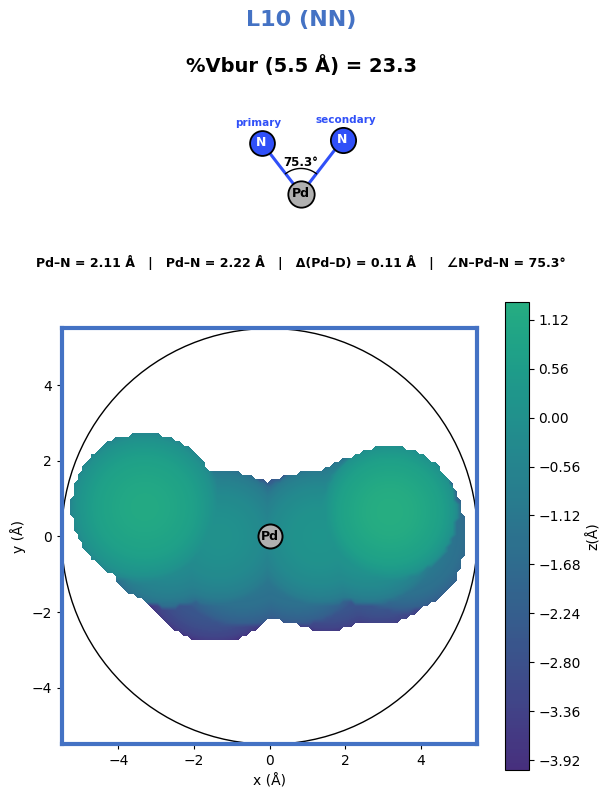

✓ L10  | NN | Pd–N = 2.107 Å | Pd–N = 2.218 Å | ΔPd-D = 0.112 Å | Bite = 75.30° | %Vbur = 23.26


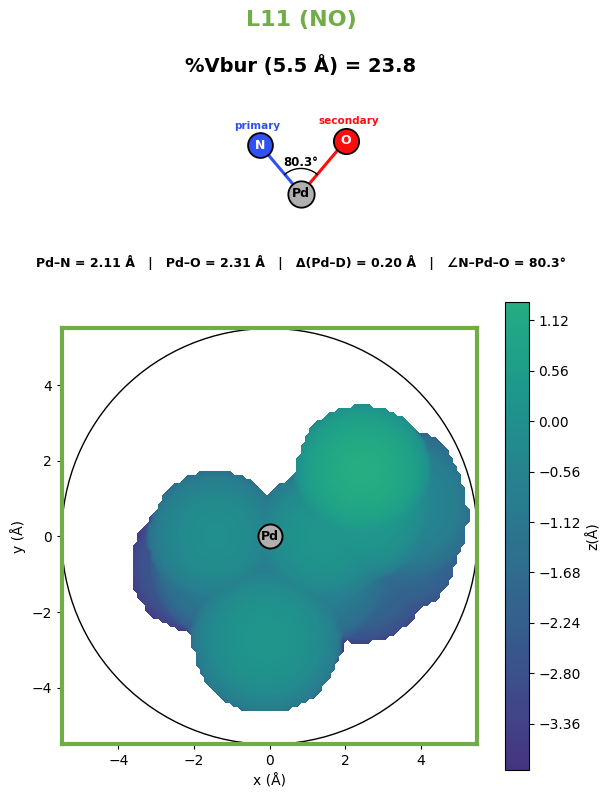

✓ L11  | NO | Pd–N = 2.115 Å | Pd–O = 2.311 Å | ΔPd-D = 0.196 Å | Bite = 80.28° | %Vbur = 23.82


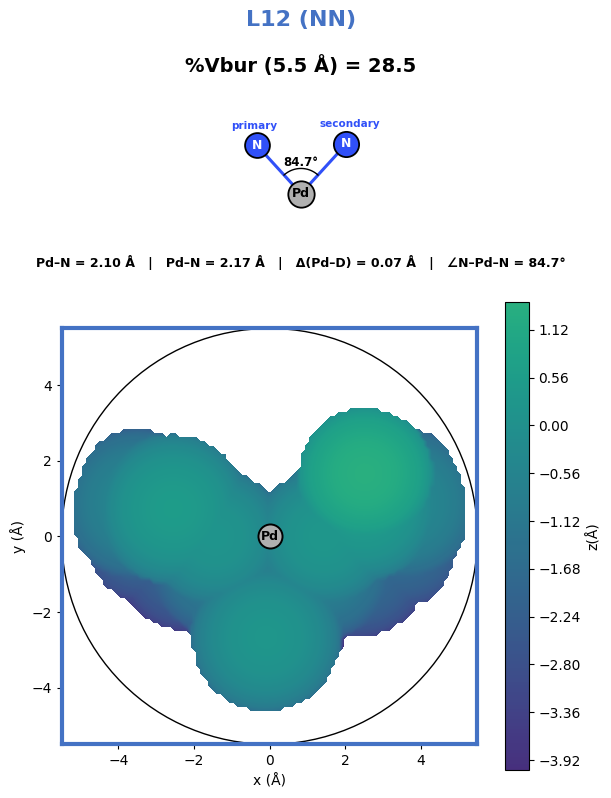

✓ L12  | NN | Pd–N = 2.101 Å | Pd–N = 2.168 Å | ΔPd-D = 0.068 Å | Bite = 84.69° | %Vbur = 28.48


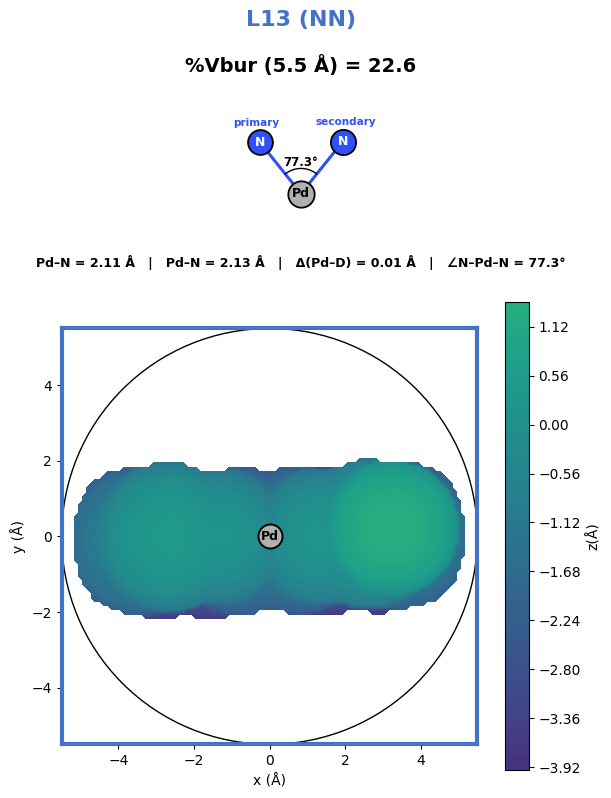

✓ L13  | NN | Pd–N = 2.113 Å | Pd–N = 2.127 Å | ΔPd-D = 0.014 Å | Bite = 77.33° | %Vbur = 22.59


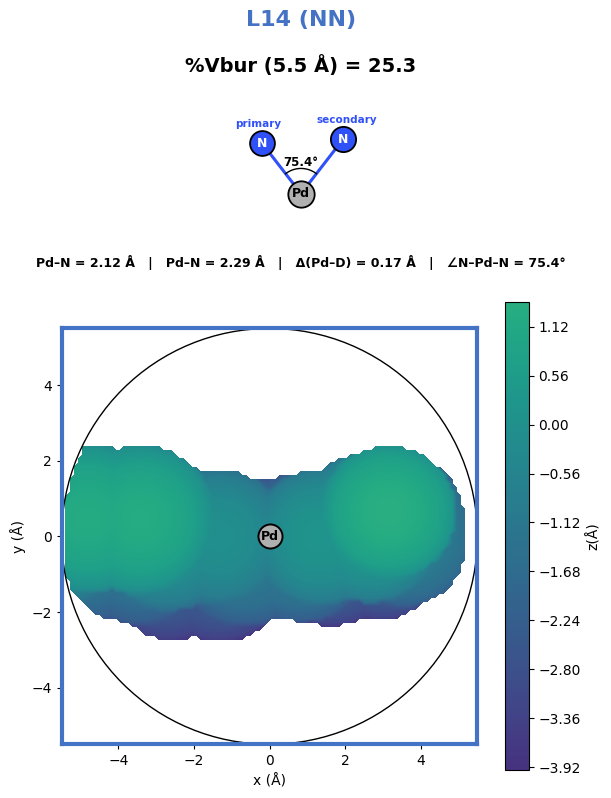

✓ L14  | NN | Pd–N = 2.121 Å | Pd–N = 2.286 Å | ΔPd-D = 0.166 Å | Bite = 75.36° | %Vbur = 25.29


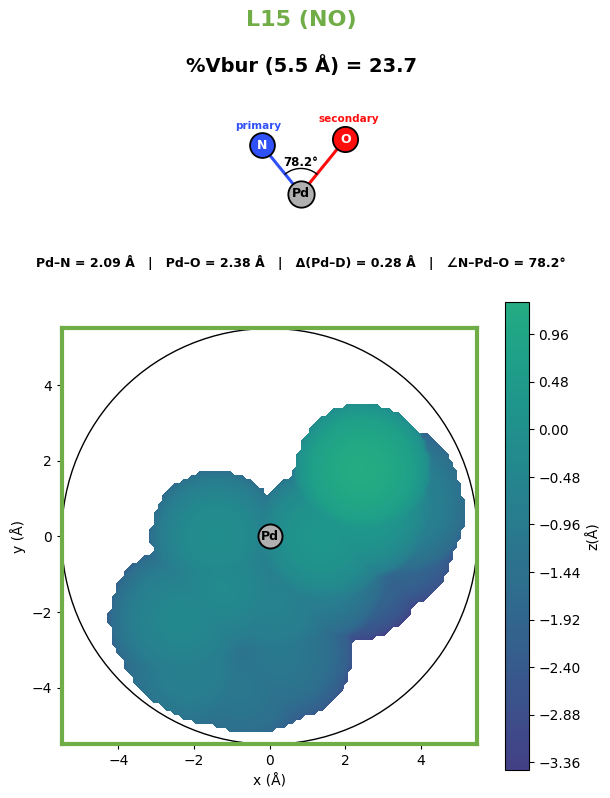

✓ L15  | NO | Pd–N = 2.093 Å | Pd–O = 2.377 Å | ΔPd-D = 0.284 Å | Bite = 78.20° | %Vbur = 23.70


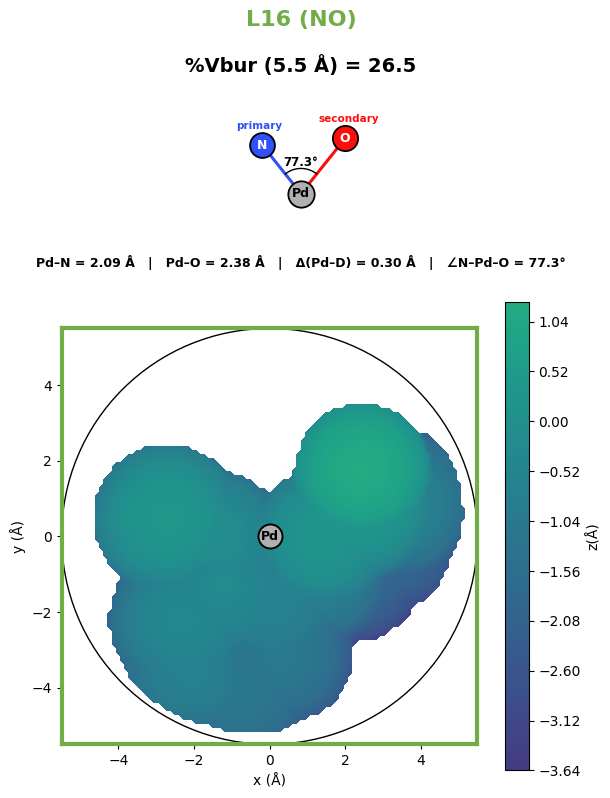

✓ L16  | NO | Pd–N = 2.089 Å | Pd–O = 2.385 Å | ΔPd-D = 0.296 Å | Bite = 77.27° | %Vbur = 26.51


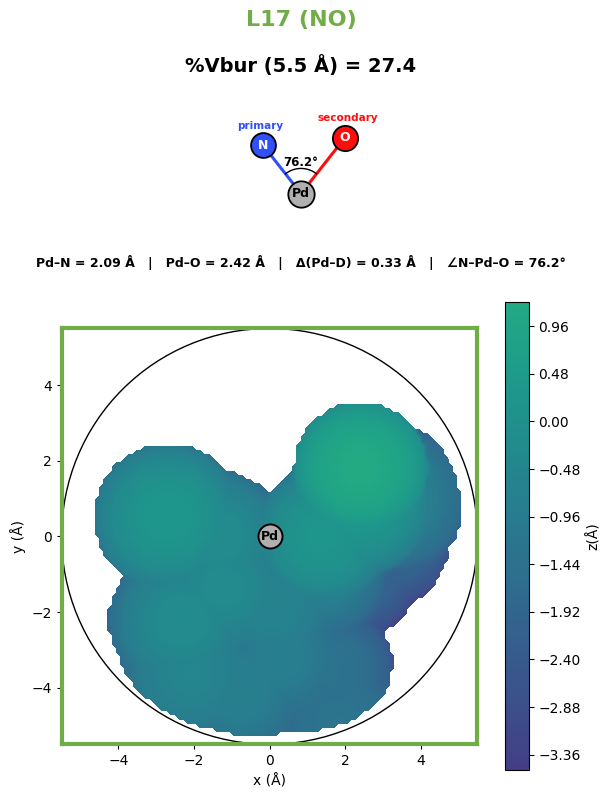

✓ L17  | NO | Pd–N = 2.086 Å | Pd–O = 2.416 Å | ΔPd-D = 0.331 Å | Bite = 76.20° | %Vbur = 27.43


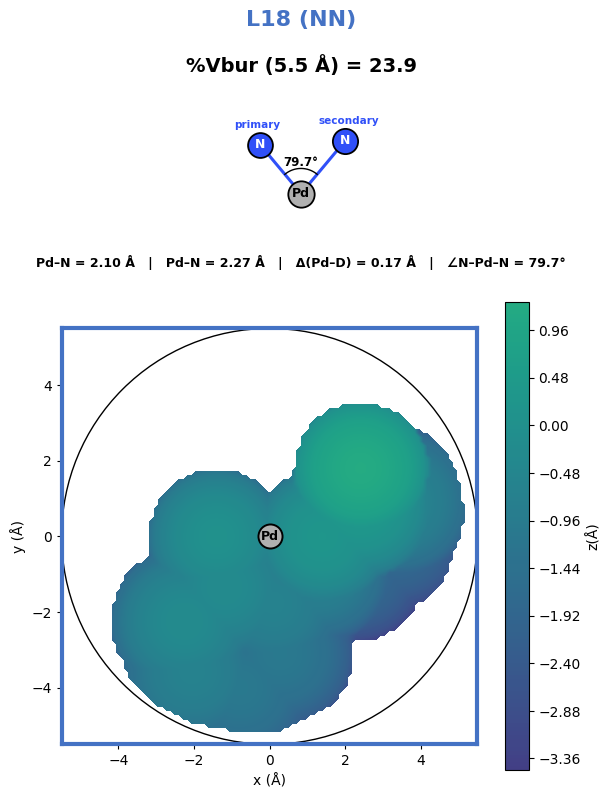

✓ L18  | NN | Pd–N = 2.104 Å | Pd–N = 2.275 Å | ΔPd-D = 0.171 Å | Bite = 79.73° | %Vbur = 23.93


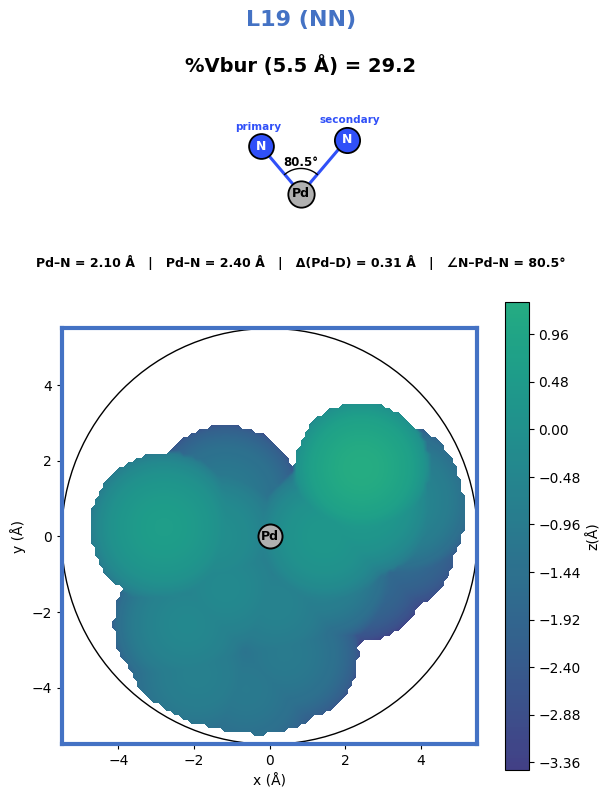

✓ L19  | NN | Pd–N = 2.096 Å | Pd–N = 2.401 Å | ΔPd-D = 0.305 Å | Bite = 80.52° | %Vbur = 29.17


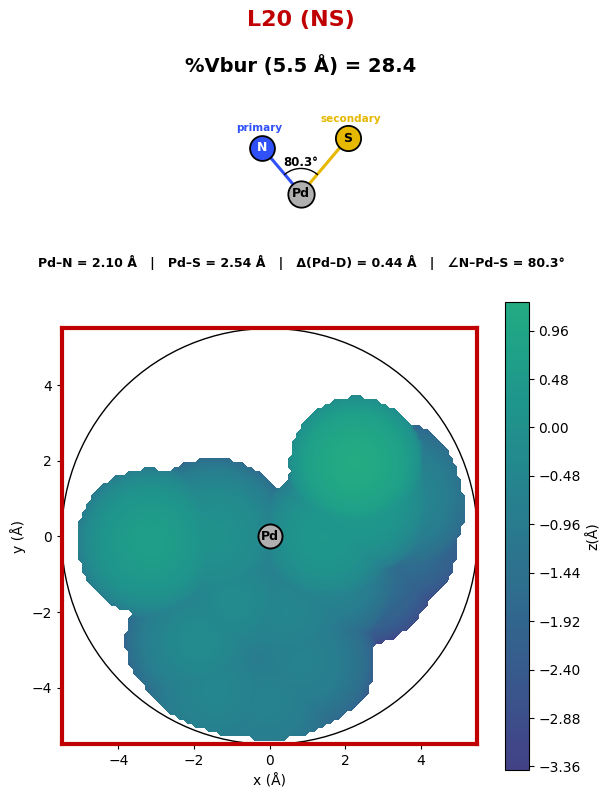

✓ L20  | NS | Pd–N = 2.096 Å | Pd–S = 2.540 Å | ΔPd-D = 0.444 Å | Bite = 80.34° | %Vbur = 28.36


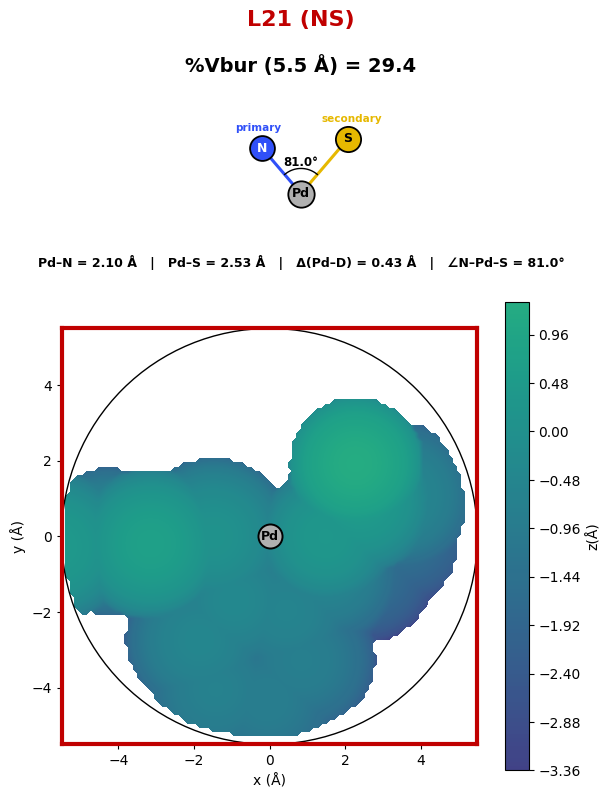

✓ L21  | NS | Pd–N = 2.098 Å | Pd–S = 2.526 Å | ΔPd-D = 0.428 Å | Bite = 80.98° | %Vbur = 29.39


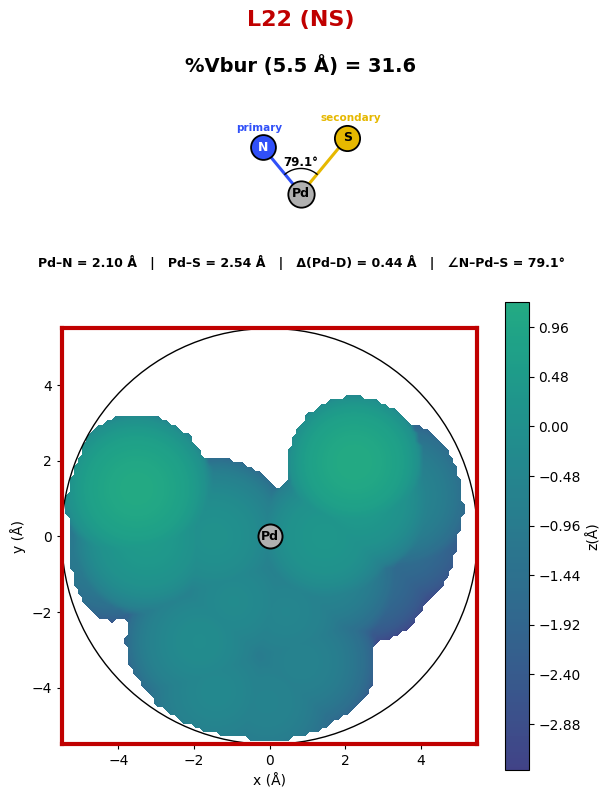

✓ L22  | NS | Pd–N = 2.102 Å | Pd–S = 2.539 Å | ΔPd-D = 0.437 Å | Bite = 79.10° | %Vbur = 31.56


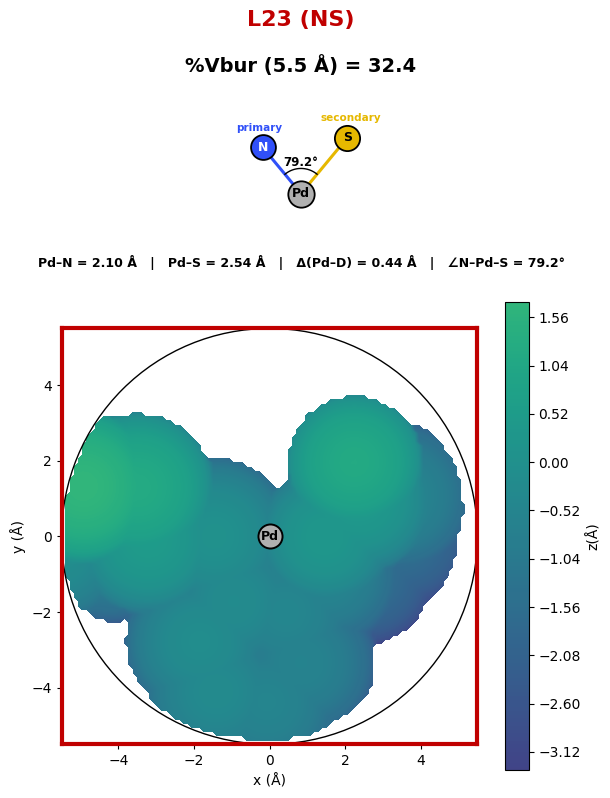

✓ L23  | NS | Pd–N = 2.100 Å | Pd–S = 2.544 Å | ΔPd-D = 0.444 Å | Bite = 79.20° | %Vbur = 32.44


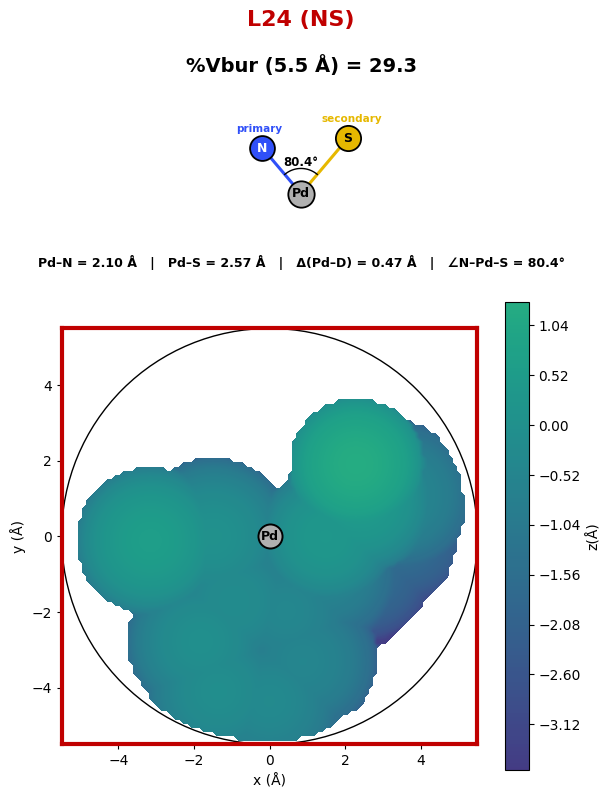

✓ L24  | NS | Pd–N = 2.103 Å | Pd–S = 2.569 Å | ΔPd-D = 0.466 Å | Bite = 80.41° | %Vbur = 29.32


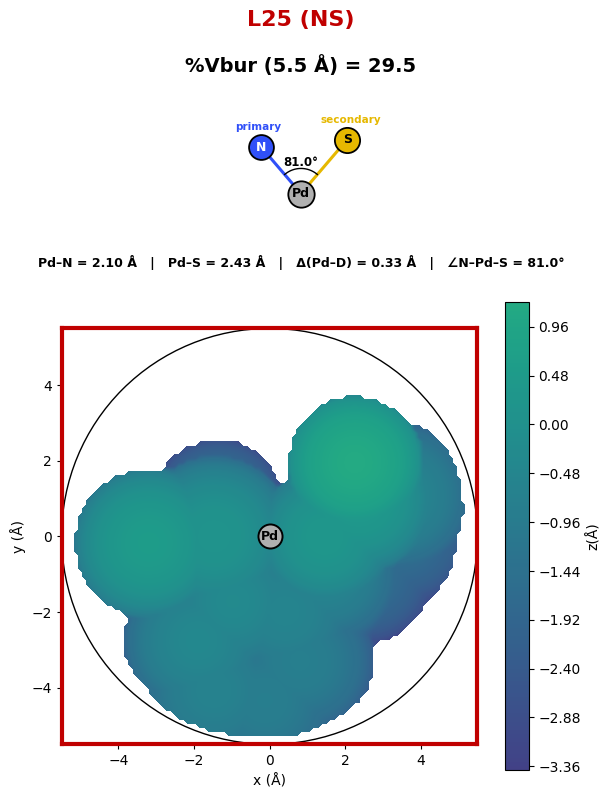

✓ L25  | NS | Pd–N = 2.100 Å | Pd–S = 2.432 Å | ΔPd-D = 0.332 Å | Bite = 80.97° | %Vbur = 29.51

MAP GENERATION COMPLETE


In [ ]:
# ============================================================
# COMPLETE CLEAN %VBUR MAP GENERATOR
# NN / NO / NS
#
# IMPORTANT:
#   - This block ACTUALLY generates the Morfeus map.
#   - Coordination schematic is ABOVE the map.
#   - Nothing covers the buried-volume surface.
#   - Only Pd is marked inside the steric map.
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# COLORS
# ============================================================

CLASS_COLORS = {
    "NN": "#4472C4",
    "NO": "#70AD47",
    "NS": "#C00000",
}

ATOM_COLORS = {
    "Pd": "#B0B0B0",
    "N":  "#3050F8",
    "O":  "#FF0D0D",
    "S":  "#E6B800",
}


# ============================================================
# ANGLE FUNCTION
# ============================================================

def calculate_angle_deg(a, b, c):

    v1 = np.asarray(a, dtype=float) - np.asarray(b, dtype=float)
    v2 = np.asarray(c, dtype=float) - np.asarray(b, dtype=float)

    n1 = np.linalg.norm(v1)
    n2 = np.linalg.norm(v2)

    if n1 < 1e-12 or n2 < 1e-12:
        return np.nan

    cosang = np.dot(v1, v2) / (n1 * n2)

    cosang = np.clip(
        cosang,
        -1.0,
        1.0
    )

    return float(
        np.degrees(
            np.arccos(cosang)
        )
    )


# ============================================================
# SECONDARY DONOR IDENTIFICATION
# ============================================================

def identify_secondary_donor(
    elements,
    donor1,
    donor2,
    ligand_class
):

    donor1 = int(donor1)
    donor2 = int(donor2)

    e1 = str(elements[donor1 - 1])
    e2 = str(elements[donor2 - 1])


    # NO -> O is secondary
    if ligand_class == "NO":

        if e1 == "O":
            return donor1, "O"

        if e2 == "O":
            return donor2, "O"


    # NS -> S is secondary
    elif ligand_class == "NS":

        if e1 == "S":
            return donor1, "S"

        if e2 == "S":
            return donor2, "S"


    # NN -> donor2 used as secondary N
    elif ligand_class == "NN":

        if e1 == "N" and e2 == "N":
            return donor2, "N"


    raise ValueError(
        f"Cannot identify secondary donor for {ligand_class}"
    )


# ============================================================
# DRAW COORDINATION SCHEMATIC
#
# Separate figure axis ABOVE the steric map.
# ============================================================

def add_coordination_schematic(
    fig,
    secondary_element,
    pd_primary_distance,
    pd_secondary_distance,
    bite_angle
):

    # --------------------------------------------------------
    # Separate axis near top of figure
    # --------------------------------------------------------

    ax = fig.add_axes([
        0.32,    # left
        0.735,   # bottom
        0.36,    # width
        0.14     # height
    ])


    # --------------------------------------------------------
    # Normalize bond lengths while retaining their ratio
    # --------------------------------------------------------

    mean_distance = (
        pd_primary_distance
        +
        pd_secondary_distance
    ) / 2.0


    rN = (
        pd_primary_distance
        /
        mean_distance
    )


    rD = (
        pd_secondary_distance
        /
        mean_distance
    )


    half = np.radians(
        bite_angle / 2.0
    )


    # --------------------------------------------------------
    # Pd at origin
    # --------------------------------------------------------

    pd_x = 0.0
    pd_y = 0.0


    # --------------------------------------------------------
    # V-shaped donor positions
    # --------------------------------------------------------

    n_x = (
        -rN * np.sin(half)
    )

    n_y = (
        rN * np.cos(half)
    )


    d_x = (
        rD * np.sin(half)
    )

    d_y = (
        rD * np.cos(half)
    )


    # --------------------------------------------------------
    # Bonds
    # --------------------------------------------------------

    ax.plot(
        [pd_x, n_x],
        [pd_y, n_y],
        color=ATOM_COLORS["N"],
        linewidth=2.2,
        zorder=2
    )


    ax.plot(
        [pd_x, d_x],
        [pd_y, d_y],
        color=ATOM_COLORS[secondary_element],
        linewidth=2.2,
        zorder=2
    )


    # --------------------------------------------------------
    # Atom drawing helper
    # --------------------------------------------------------

    def draw_atom(
        x,
        y,
        element,
        size
    ):

        ax.scatter(
            x,
            y,
            s=size,
            facecolor=ATOM_COLORS[element],
            edgecolor="black",
            linewidth=1.3,
            zorder=5
        )


        if element in ["Pd", "S"]:
            txt_color = "black"
        else:
            txt_color = "white"


        ax.text(
            x,
            y,
            element,
            ha="center",
            va="center",
            fontsize=9,
            fontweight="bold",
            color=txt_color,
            zorder=6
        )


    # --------------------------------------------------------
    # Draw atoms
    # --------------------------------------------------------

    draw_atom(
        pd_x,
        pd_y,
        "Pd",
        360
    )


    draw_atom(
        n_x,
        n_y,
        "N",
        320
    )


    draw_atom(
        d_x,
        d_y,
        secondary_element,
        330
    )


    # --------------------------------------------------------
    # Primary / secondary labels
    # --------------------------------------------------------

    ax.text(
        n_x - 0.05,
        n_y + 0.25,
        "primary",
        ha="center",
        fontsize=7.5,
        fontweight="bold",
        color=ATOM_COLORS["N"]
    )


    ax.text(
        d_x + 0.05,
        d_y + 0.25,
        "secondary",
        ha="center",
        fontsize=7.5,
        fontweight="bold",
        color=ATOM_COLORS[secondary_element]
    )


    # --------------------------------------------------------
    # Bite-angle arc
    # --------------------------------------------------------

    theta1 = (
        np.pi / 2.0
        -
        half
    )

    theta2 = (
        np.pi / 2.0
        +
        half
    )


    theta = np.linspace(
        theta1,
        theta2,
        100
    )


    arc_r = 0.38


    ax.plot(
        arc_r * np.cos(theta),
        arc_r * np.sin(theta),
        color="black",
        linewidth=1.0,
        zorder=3
    )


    # --------------------------------------------------------
    # Bite-angle label
    # --------------------------------------------------------

    ax.text(
        0.0,
        0.47,
        f"{bite_angle:.1f}°",
        ha="center",
        va="center",
        fontsize=8.5,
        fontweight="bold",
        color="black"
    )


    # --------------------------------------------------------
    # Clean schematic
    # --------------------------------------------------------

    ax.set_xlim(
        -1.5,
        1.5
    )

    ax.set_ylim(
        -0.35,
        1.55
    )

    ax.set_aspect(
        "equal"
    )

    ax.axis(
        "off"
    )


# ============================================================
# GENERATE MAPS
# ============================================================

print("\n" + "=" * 75)
print("GENERATING CLEAN %VBUR MAPS")
print("=" * 75)


for _, row in oriented_df.iterrows():

    ligand = str(
        row["Ligand"]
    )

    ligand_class = str(
        row["Class"]
    )

    donor1 = int(
        row["Donor1"]
    )

    donor2 = int(
        row["Donor2"]
    )


    try:

        # ====================================================
        # READ XYZ
        # ====================================================

        elements, coordinates = read_xyz_file(
            row["File"]
        )


        coordinates = np.asarray(
            coordinates,
            dtype=float
        )


        # ====================================================
        # SECONDARY DONOR
        # ====================================================

        (
            secondary_atom,
            secondary_element

        ) = identify_secondary_donor(
            elements,
            donor1,
            donor2,
            ligand_class
        )


        # ====================================================
        # PRIMARY DONOR
        # ====================================================

        if secondary_atom == donor1:
            primary_atom = donor2
        else:
            primary_atom = donor1


        # ====================================================
        # ORIGINAL 3D COORDINATES
        # ====================================================

        pd_xyz = coordinates[
            PD_ATOM - 1
        ]

        primary_xyz = coordinates[
            primary_atom - 1
        ]

        secondary_xyz = coordinates[
            secondary_atom - 1
        ]


        # ====================================================
        # DISTANCES
        # ====================================================

        pd_primary_distance = float(
            np.linalg.norm(
                primary_xyz - pd_xyz
            )
        )


        pd_secondary_distance = float(
            np.linalg.norm(
                secondary_xyz - pd_xyz
            )
        )


        delta_pd_donor = abs(
            pd_secondary_distance
            -
            pd_primary_distance
        )


        # ====================================================
        # TRUE 3D BITE ANGLE
        # ====================================================

        bite_angle = calculate_angle_deg(
            primary_xyz,
            pd_xyz,
            secondary_xyz
        )


        # ====================================================
        # CALCULATE BURIED VOLUME
        # ====================================================

        bv = calculate_buried_volume(
            elements=elements,
            coordinates=coordinates,
            donor1=donor1,
            donor2=donor2
        )


        percent_vbur = (
            bv.fraction_buried_volume
            * 100.0
        )


        # ====================================================
        # IMPORTANT:
        # CLOSE OLD FIGURES BEFORE MORFEUS CREATES NEW MAP
        # ====================================================

        plt.close("all")


        # ====================================================
        # GENERATE MORFEUS STERIC MAP
        # ====================================================

        original_show = plt.show


        # Prevent immediate notebook display
        plt.show = (
            lambda *args, **kwargs: None
        )


        try:

            bv.plot_steric_map(
                cmap="viridis"
            )

        finally:

            plt.show = original_show


        # ====================================================
        # GET THE FIGURE CREATED BY MORFEUS
        # ====================================================

        figure_numbers = plt.get_fignums()


        if len(figure_numbers) == 0:

            raise RuntimeError(
                "Morfeus did not create a figure."
            )


        fig = plt.figure(
            figure_numbers[-1]
        )


        axes = fig.get_axes()


        if len(axes) == 0:

            raise RuntimeError(
                "Morfeus created no plotting axes."
            )


        # ====================================================
        # IDENTIFY MAIN STERIC-MAP AXIS
        #
        # Colorbar is narrow.
        # Main map has largest area.
        # ====================================================

        main_ax = max(
            axes,
            key=lambda ax:
                ax.get_position().width
                *
                ax.get_position().height
        )


        # ====================================================
        # IMPORTANT:
        # SHRINK + LOWER THE EXISTING MORFEUS MAP
        #
        # This creates genuine empty space ABOVE it.
        # ====================================================

        map_pos = main_ax.get_position()


        main_ax.set_position([
            map_pos.x0,
            0.12,
            map_pos.width,
            0.52
        ])


        # ====================================================
        # MOVE COLORBAR DOWN WITH MAP
        # ====================================================

        for ax in axes:

            if ax is main_ax:
                continue

            pos = ax.get_position()

            # likely colorbar
            if pos.width < main_ax.get_position().width * 0.35:

                ax.set_position([
                    pos.x0,
                    0.12,
                    pos.width,
                    0.52
                ])


        # ====================================================
        # FIGURE SIZE
        # ====================================================

        fig.set_size_inches(
            7.2,
            9.0
        )


        # ====================================================
        # CLASS FRAME
        # ====================================================

        class_color = CLASS_COLORS[
            ligand_class
        ]


        for spine in main_ax.spines.values():

            spine.set_visible(True)

            spine.set_color(
                class_color
            )

            spine.set_linewidth(
                3.0
            )


        # ====================================================
        # Pd ONLY ON STERIC MAP
        # ====================================================

        main_ax.scatter(
            0.0,
            0.0,
            s=300,
            facecolor=ATOM_COLORS["Pd"],
            edgecolor="black",
            linewidth=1.4,
            zorder=60
        )


        main_ax.text(
            0.0,
            0.0,
            "Pd",
            ha="center",
            va="center",
            fontsize=9,
            fontweight="bold",
            color="black",
            zorder=61
        )


        # ====================================================
        # REMOVE OLD AXIS TITLE
        # ====================================================

        main_ax.set_title("")


        # ====================================================
        # MAIN TITLE
        # ====================================================

        fig.text(
            0.50,
            0.965,

            f"{ligand} ({ligand_class})",

            ha="center",
            va="top",

            fontsize=16,
            fontweight="bold",

            color=class_color
        )


        # ====================================================
        # %VBUR TITLE
        # ====================================================

        fig.text(
            0.50,
            0.915,

            f"%Vbur (5.5 Å) = "
            f"{percent_vbur:.1f}",

            ha="center",
            va="top",

            fontsize=14,
            fontweight="bold",

            color="black"
        )


        # ====================================================
        # COORDINATION SCHEMATIC ABOVE MAP
        # ====================================================

        add_coordination_schematic(
            fig=fig,

            secondary_element=
                secondary_element,

            pd_primary_distance=
                pd_primary_distance,

            pd_secondary_distance=
                pd_secondary_distance,

            bite_angle=
                bite_angle
        )


        # ====================================================
        # NUMERICAL COORDINATION LINE
        # ====================================================

        fig.text(
            0.50,
            0.685,

            (
                f"Pd–N = "
                f"{pd_primary_distance:.2f} Å"
                f"   |   "

                f"Pd–{secondary_element} = "
                f"{pd_secondary_distance:.2f} Å"
                f"   |   "

                f"Δ(Pd–D) = "
                f"{delta_pd_donor:.2f} Å"
                f"   |   "

                f"∠N–Pd–{secondary_element} = "
                f"{bite_angle:.1f}°"
            ),

            ha="center",
            va="center",

            fontsize=9,
            fontweight="bold",

            color="black"
        )


        # ====================================================
        # SAVE
        # ====================================================

        output_png = os.path.join(
            VBUR_FOLDER,

            f"{ligand}_"
            f"{ligand_class}_"
            f"Vbur_5.5A_Clean.png"
        )


        fig.savefig(
            output_png,
            dpi=600,
            bbox_inches="tight",
            facecolor="white"
        )


        # ====================================================
        # DISPLAY EXACTLY ONCE
        # ====================================================

        plt.show()


        # ====================================================
        # PRINT CHECK
        # ====================================================

        print(
            f"✓ {ligand:4s} | "
            f"{ligand_class:2s} | "
            f"Pd–N = {pd_primary_distance:.3f} Å | "
            f"Pd–{secondary_element} = "
            f"{pd_secondary_distance:.3f} Å | "
            f"ΔPd-D = {delta_pd_donor:.3f} Å | "
            f"Bite = {bite_angle:.2f}° | "
            f"%Vbur = {percent_vbur:.2f}"
        )


        # ====================================================
        # CLOSE AFTER DISPLAY
        # ====================================================

        plt.close(fig)


    except Exception as error:

        # Restore normal plotting
        if "original_show" in locals():
            plt.show = original_show

        plt.close("all")

        print(
            f"MAP ERROR: "
            f"{ligand}: "
            f"{error}"
        )


print("\n" + "=" * 75)
print("MAP GENERATION COMPLETE")
print("=" * 75)

## STEP 7 — Quadrant buried-volume analysis

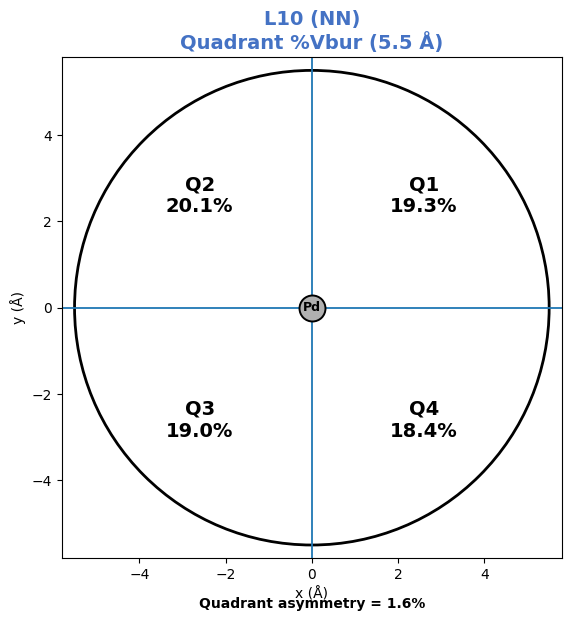

✓ L10 | Q1=19.32 | Q2=20.06 | Q3=19.00 | Q4=18.44


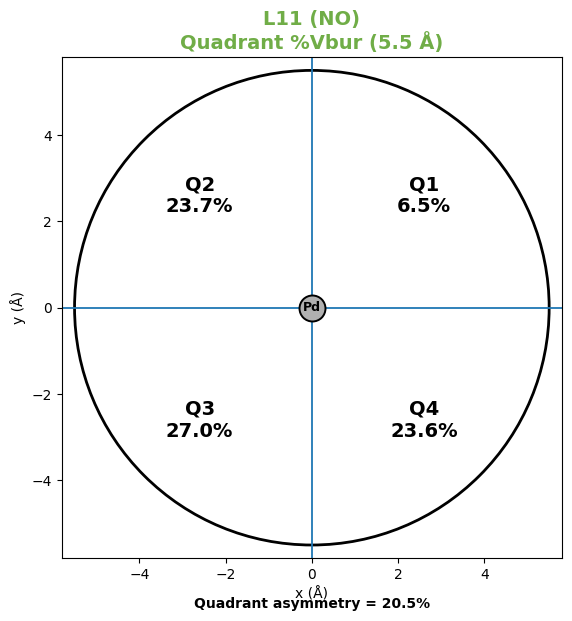

✓ L11 | Q1=6.54 | Q2=23.71 | Q3=27.02 | Q4=23.57


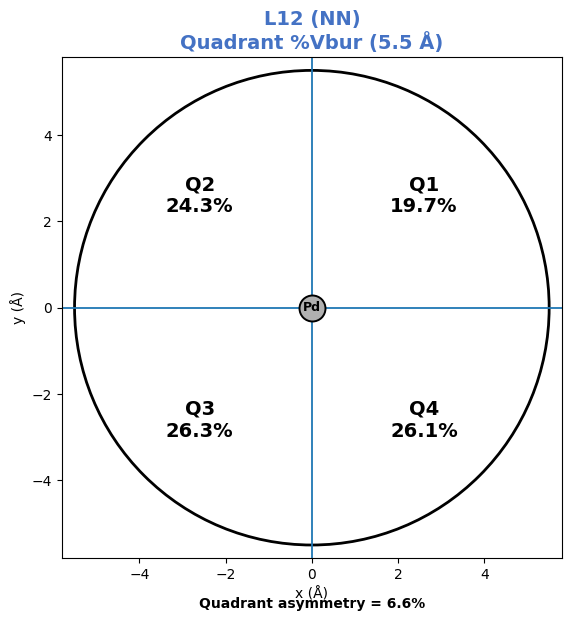

✓ L12 | Q1=19.74 | Q2=24.33 | Q3=26.30 | Q4=26.12


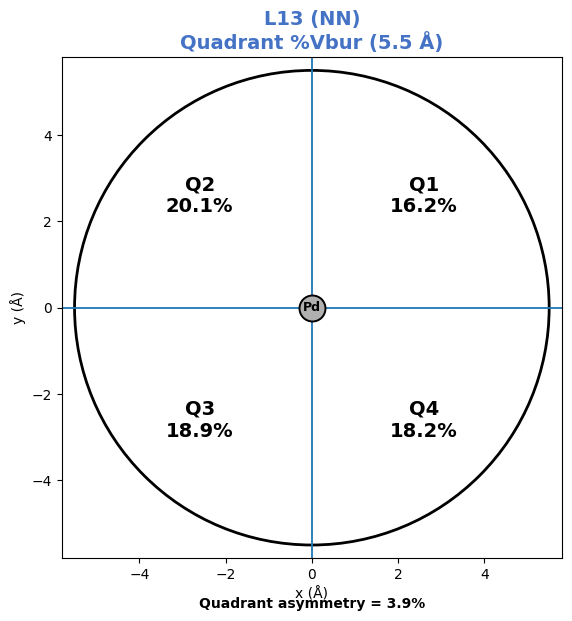

✓ L13 | Q1=16.18 | Q2=20.08 | Q3=18.86 | Q4=18.18


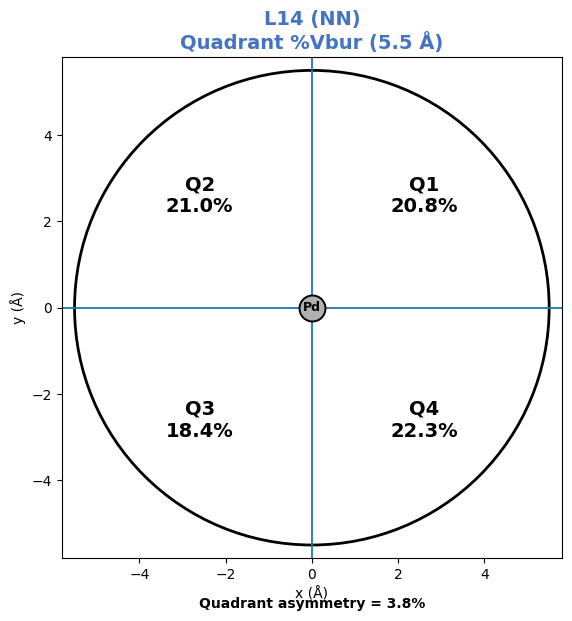

✓ L14 | Q1=20.78 | Q2=21.01 | Q3=18.45 | Q4=22.29


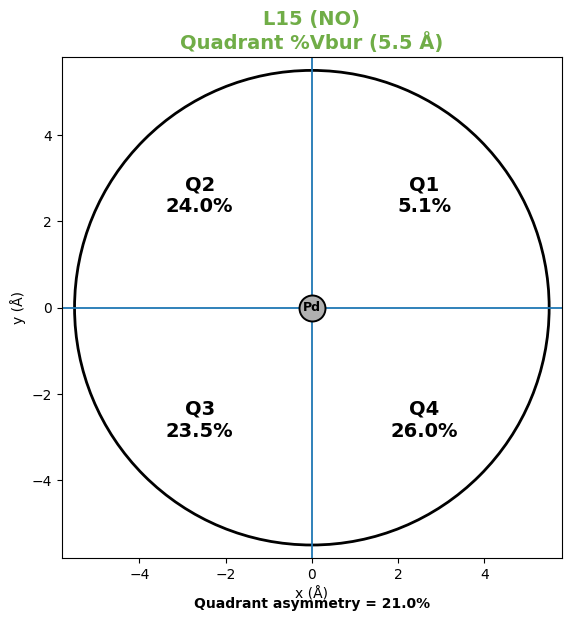

✓ L15 | Q1=5.07 | Q2=23.99 | Q3=23.52 | Q4=26.04


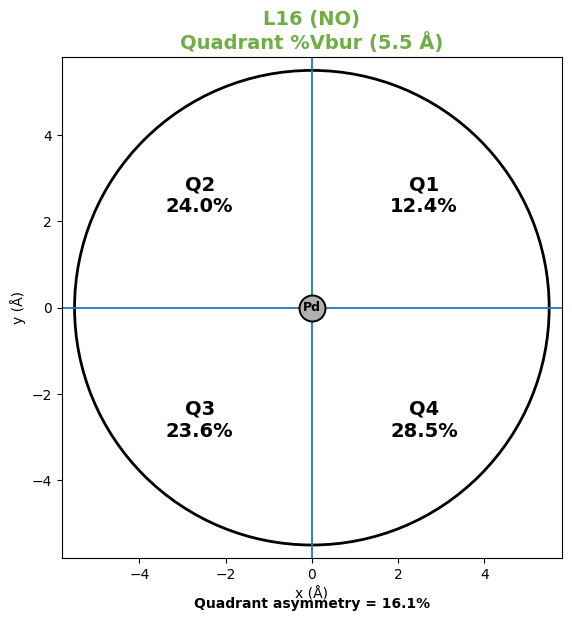

✓ L16 | Q1=12.38 | Q2=23.96 | Q3=23.65 | Q4=28.50


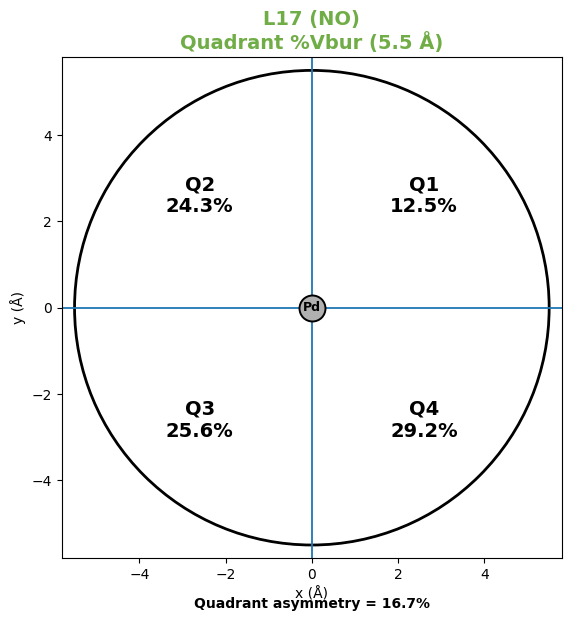

✓ L17 | Q1=12.52 | Q2=24.34 | Q3=25.56 | Q4=29.22


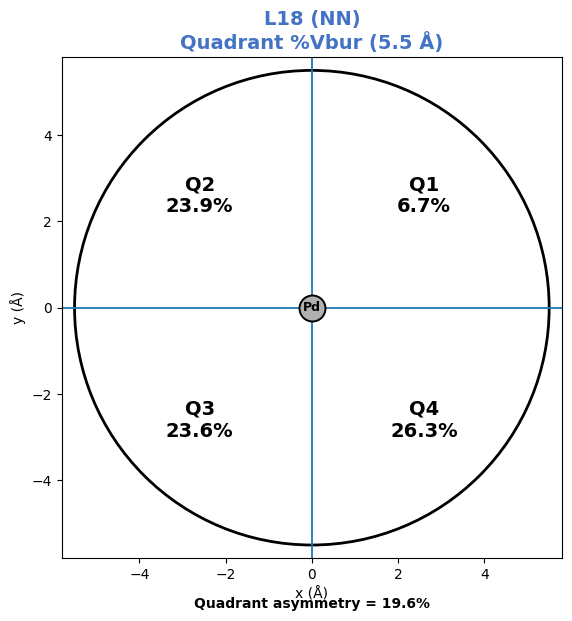

✓ L18 | Q1=6.74 | Q2=23.91 | Q3=23.57 | Q4=26.33


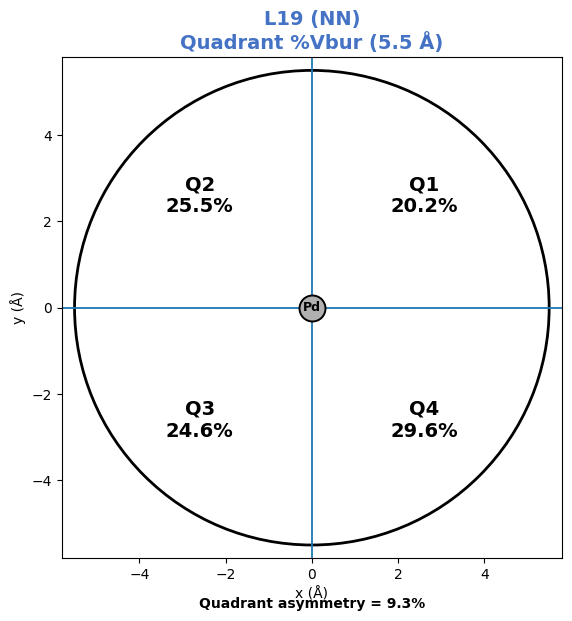

✓ L19 | Q1=20.22 | Q2=25.50 | Q3=24.56 | Q4=29.57


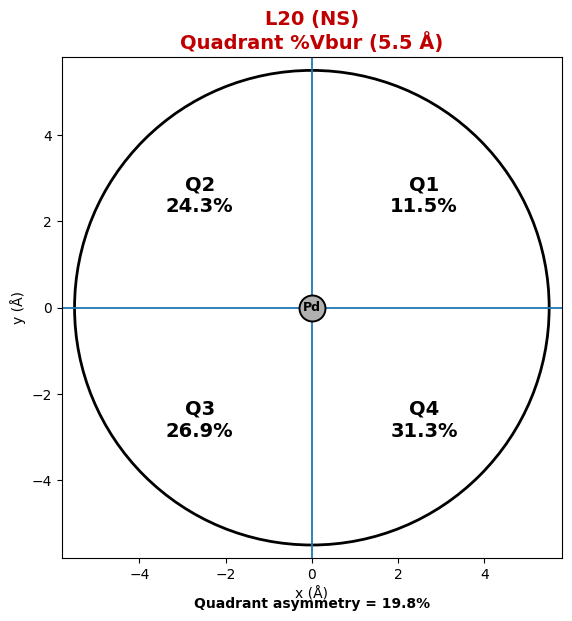

✓ L20 | Q1=11.51 | Q2=24.28 | Q3=26.95 | Q4=31.28


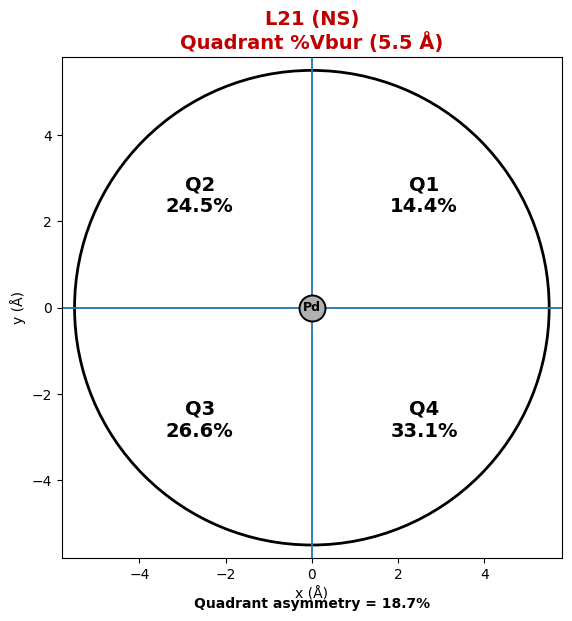

✓ L21 | Q1=14.40 | Q2=24.47 | Q3=26.56 | Q4=33.09


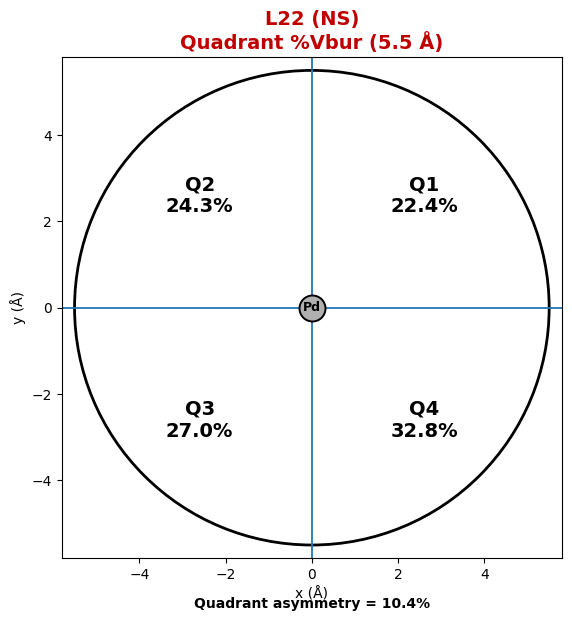

✓ L22 | Q1=22.42 | Q2=24.31 | Q3=26.98 | Q4=32.84


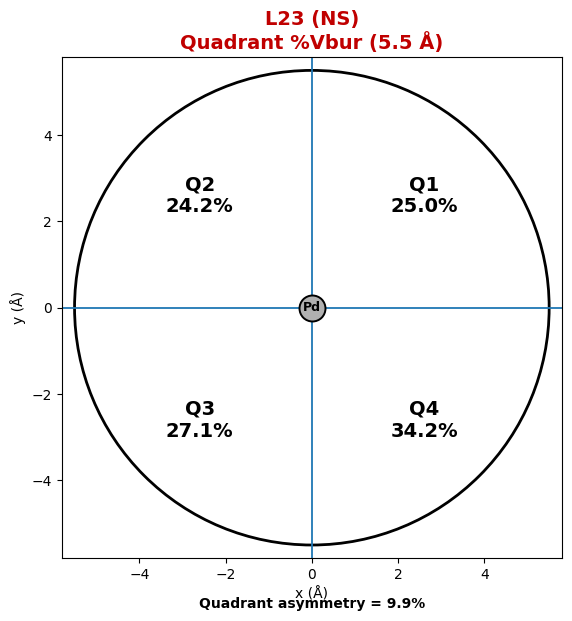

✓ L23 | Q1=25.01 | Q2=24.24 | Q3=27.14 | Q4=34.18


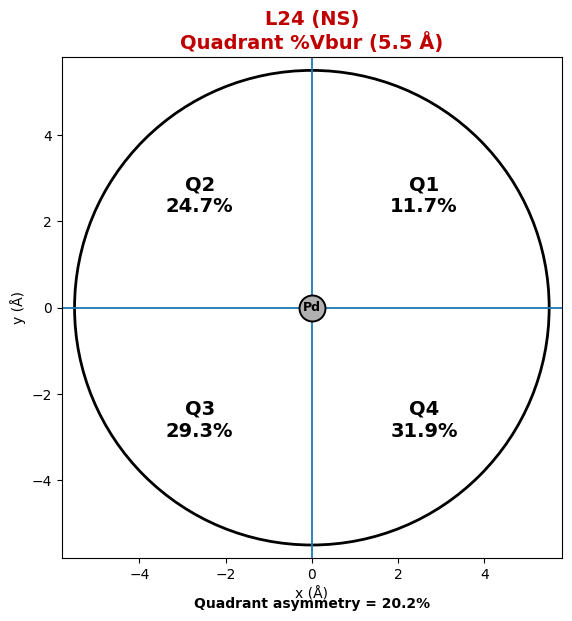

✓ L24 | Q1=11.70 | Q2=24.65 | Q3=29.27 | Q4=31.94


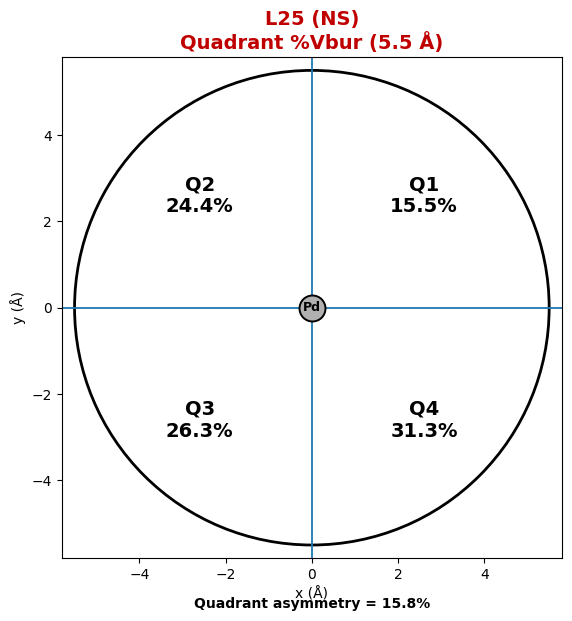

✓ L25 | Q1=15.51 | Q2=24.37 | Q3=26.30 | Q4=31.34


,Ligand,Class,Q1_%Vbur,Q2_%Vbur,Q3_%Vbur,Q4_%Vbur,Max_Quadrant_%Vbur,Min_Quadrant_%Vbur,Quadrant_Asymmetry
0,L10,NN,19.321,20.064,19.003,18.439,20.064,18.439,1.625
1,L11,NO,6.544,23.715,27.024,23.571,27.024,6.544,20.480
2,L12,NN,19.741,24.331,26.296,26.116,26.296,19.741,6.555
3,L13,NN,16.178,20.077,18.861,18.178,20.077,16.178,3.899
4,L14,NN,20.780,21.008,18.447,22.294,22.294,18.447,3.847
5,L15,NO,5.065,23.993,23.524,26.039,26.039,5.065,20.974
6,L16,NO,12.378,23.956,23.648,28.498,28.498,12.378,16.120
7,L17,NO,12.521,24.344,25.558,29.221,29.221,12.521,16.700
8,L18,NN,6.743,23.906,23.571,26.334,26.334,6.743,19.590
9,L19,NN,20.220,25.503,24.561,29.566,29.566,20.220,9.346


In [ ]:
# ============================================================
# STEP 7 — QUADRANT BURIED-VOLUME ANALYSIS
# ============================================================
#
# Purpose:
#   STEP 6 = HOW MUCH steric occupancy?
#   STEP 7 = WHERE is that steric occupancy?
#
# Output:
#   1. Q1/Q2/Q3/Q4 %Vbur values
#   2. quadrant map for each ligand
#   3. Excel/CSV summary
#
# Orientation:
#
#                  +Y
#             Q2   |   Q1
#                  |
#            ------Pd------ +X
#                  |
#             Q3   |   Q4
#
# IMPORTANT:
# Same orientation convention is used for every ligand.
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


QUADRANT_FOLDER = os.path.join(
    VBUR_FOLDER,
    "Quadrant_Analysis"
)

os.makedirs(
    QUADRANT_FOLDER,
    exist_ok=True
)


# ============================================================
# COMMON COORDINATE TRANSFORMATION
# ============================================================

def normalize_vector(v):

    v = np.asarray(v, dtype=float)

    norm = np.linalg.norm(v)

    if norm < 1.0e-12:
        raise ValueError("Zero-length vector.")

    return v / norm


def transform_to_donor_coordinates(
    coordinates,
    pd_atom,
    donor1,
    donor2
):

    xyz = np.asarray(
        coordinates,
        dtype=float
    ).copy()

    # Pd -> origin
    pd_xyz = xyz[
        pd_atom - 1
    ]

    xyz -= pd_xyz

    d1 = xyz[
        donor1 - 1
    ]

    d2 = xyz[
        donor2 - 1
    ]

    # Pd -> donor midpoint
    z_axis = normalize_vector(
        (d1 + d2) / 2.0
    )

    # donor1 -> donor2 projected perpendicular to z
    donor_difference = d2 - d1

    x_temp = (
        donor_difference
        -
        np.dot(
            donor_difference,
            z_axis
        )
        * z_axis
    )

    x_axis = normalize_vector(
        x_temp
    )

    y_axis = normalize_vector(
        np.cross(
            z_axis,
            x_axis
        )
    )

    x_axis = normalize_vector(
        np.cross(
            y_axis,
            z_axis
        )
    )

    rotation = np.vstack([
        x_axis,
        y_axis,
        z_axis
    ])

    transformed = (
        rotation @ xyz.T
    ).T

    return transformed


# ============================================================
# APPROXIMATE QUADRANT OCCUPANCY
#
# Uses atom-centered vdW sphere sampling inside the
# Pd-centered 5.5 Å sphere.
#
# The purpose is a spatial decomposition of the same
# ligand steric environment.
# ============================================================

BONDI_RADII = {
    "H": 1.20,
    "C": 1.70,
    "N": 1.55,
    "O": 1.52,
    "F": 1.47,
    "P": 1.80,
    "S": 1.80,
    "Cl": 1.75,
    "Br": 1.85,
    "I": 1.98,
}


def calculate_quadrant_vbur(
    elements,
    transformed_coordinates,
    ligand_start,
    sphere_radius=5.5,
    spacing=0.18
):

    # --------------------------------------------------------
    # Grid inside Pd-centered sphere
    # --------------------------------------------------------

    values = np.arange(
        -sphere_radius,
        sphere_radius + spacing,
        spacing
    )

    X, Y, Z = np.meshgrid(
        values,
        values,
        values,
        indexing="ij"
    )

    points = np.column_stack([
        X.ravel(),
        Y.ravel(),
        Z.ravel()
    ])

    inside = (
        np.sum(points**2, axis=1)
        <= sphere_radius**2
    )

    points = points[inside]


    # --------------------------------------------------------
    # Occupied / free
    # --------------------------------------------------------

    occupied = np.zeros(
        len(points),
        dtype=bool
    )


    # Ligand atoms only
    for atom_number in range(
        ligand_start,
        len(elements) + 1
    ):

        element = str(
            elements[
                atom_number - 1
            ]
        )

        radius = BONDI_RADII.get(
            element
        )

        if radius is None:
            continue

        atom_xyz = (
            transformed_coordinates[
                atom_number - 1
            ]
        )

        d2 = np.sum(
            (
                points
                -
                atom_xyz
            )**2,
            axis=1
        )

        occupied |= (
            d2 <= radius**2
        )


    # --------------------------------------------------------
    # Quadrants based on XY plane
    # --------------------------------------------------------

    x = points[:, 0]
    y = points[:, 1]

    masks = {

        "Q1": (
            (x >= 0)
            &
            (y >= 0)
        ),

        "Q2": (
            (x < 0)
            &
            (y >= 0)
        ),

        "Q3": (
            (x < 0)
            &
            (y < 0)
        ),

        "Q4": (
            (x >= 0)
            &
            (y < 0)
        ),
    }


    results = {}

    for name, mask in masks.items():

        n_total = np.sum(mask)

        n_occ = np.sum(
            occupied & mask
        )

        results[name] = (
            100.0
            * n_occ
            / n_total
        )

    return results


# ============================================================
# RUN ALL LIGANDS
# ============================================================

quadrant_results = []


for _, row in oriented_df.iterrows():

    ligand = str(
        row["Ligand"]
    )

    ligand_class = str(
        row["Class"]
    )

    donor1 = int(
        row["Donor1"]
    )

    donor2 = int(
        row["Donor2"]
    )

    elements, coordinates = read_xyz_file(
        row["File"]
    )

    coordinates = np.asarray(
        coordinates,
        dtype=float
    )


    try:

        transformed = (
            transform_to_donor_coordinates(
                coordinates,
                PD_ATOM,
                donor1,
                donor2
            )
        )


        q = calculate_quadrant_vbur(
            elements=elements,
            transformed_coordinates=
                transformed,
            ligand_start=LIGAND_START,
            sphere_radius=5.5,
            spacing=0.18
        )


        quadrant_results.append({

            "Ligand":
                ligand,

            "Class":
                ligand_class,

            "Q1_%Vbur":
                q["Q1"],

            "Q2_%Vbur":
                q["Q2"],

            "Q3_%Vbur":
                q["Q3"],

            "Q4_%Vbur":
                q["Q4"],

            "Max_Quadrant_%Vbur":
                max(q.values()),

            "Min_Quadrant_%Vbur":
                min(q.values()),

            "Quadrant_Asymmetry":
                max(q.values())
                -
                min(q.values()),
        })


        # ====================================================
        # FIGURE
        # ====================================================

        fig, ax = plt.subplots(
            figsize=(6.5, 6.5)
        )


        # Four quadrant labels
        ax.text(
            2.6, 2.6,
            f"Q1\n{q['Q1']:.1f}%",
            ha="center",
            va="center",
            fontsize=14,
            fontweight="bold"
        )

        ax.text(
            -2.6, 2.6,
            f"Q2\n{q['Q2']:.1f}%",
            ha="center",
            va="center",
            fontsize=14,
            fontweight="bold"
        )

        ax.text(
            -2.6, -2.6,
            f"Q3\n{q['Q3']:.1f}%",
            ha="center",
            va="center",
            fontsize=14,
            fontweight="bold"
        )

        ax.text(
            2.6, -2.6,
            f"Q4\n{q['Q4']:.1f}%",
            ha="center",
            va="center",
            fontsize=14,
            fontweight="bold"
        )


        # Pd-centered sphere
        circle = plt.Circle(
            (0, 0),
            5.5,
            fill=False,
            linewidth=2.0
        )

        ax.add_patch(
            circle
        )


        # Quadrant boundaries
        ax.axhline(
            0,
            linewidth=1.3
        )

        ax.axvline(
            0,
            linewidth=1.3
        )


        # Pd
        ax.scatter(
            0,
            0,
            s=350,
            facecolor=ATOM_COLORS["Pd"],
            edgecolor="black",
            linewidth=1.4,
            zorder=10
        )

        ax.text(
            0,
            0,
            "Pd",
            ha="center",
            va="center",
            fontweight="bold",
            fontsize=9,
            zorder=11
        )


        # Title
        ax.set_title(
            f"{ligand} ({ligand_class})\n"
            f"Quadrant %Vbur (5.5 Å)",
            fontsize=14,
            fontweight="bold",
            color=CLASS_COLORS[
                ligand_class
            ]
        )


        ax.text(
            0.5,
            -0.10,
            (
                "Quadrant asymmetry = "
                f"{max(q.values()) - min(q.values()):.1f}%"
            ),
            transform=ax.transAxes,
            ha="center",
            fontsize=10,
            fontweight="bold"
        )


        ax.set_xlim(
            -5.8,
            5.8
        )

        ax.set_ylim(
            -5.8,
            5.8
        )

        ax.set_aspect(
            "equal"
        )

        ax.set_xlabel(
            "x (Å)"
        )

        ax.set_ylabel(
            "y (Å)"
        )


        output = os.path.join(
            QUADRANT_FOLDER,
            f"{ligand}_{ligand_class}_"
            f"Quadrant_Vbur.png"
        )

        fig.savefig(
            output,
            dpi=600,
            bbox_inches="tight",
            facecolor="white"
        )

        plt.show()
        plt.close(fig)


        print(
            f"✓ {ligand} | "
            f"Q1={q['Q1']:.2f} | "
            f"Q2={q['Q2']:.2f} | "
            f"Q3={q['Q3']:.2f} | "
            f"Q4={q['Q4']:.2f}"
        )


    except Exception as error:

        print(
            f"QUADRANT ERROR: "
            f"{ligand}: {error}"
        )


# ============================================================
# EXPORT
# ============================================================

quadrant_df = pd.DataFrame(
    quadrant_results
)


quadrant_df.to_excel(
    os.path.join(
        QUADRANT_FOLDER,
        "Quadrant_Vbur_Results.xlsx"
    ),
    index=False
)


display(
    quadrant_df.round(3)
)



CHEMICALLY ORIENTED LIGAND–SUBSTRATE STERIC ANALYSIS

L10 (NN)
Ligand centroid y    = +2.309 Å
Substrate centroid y = -2.116 Å
Orientation           = PASS (ligand top / substrate bottom)

QUADRANTS
Q1: Total=35.69% | NN ligand=35.68% | Substrate=0.01% | Overlap=0.00% | PASS
Q2: Total=37.94% | NN ligand=35.85% | Substrate=2.09% | Overlap=0.00% | PASS
Q3: Total=42.73% | NN ligand=1.69% | Substrate=40.31% | Overlap=0.73% | PASS
Q4: Total=22.46% | NN ligand=2.33% | Substrate=19.61% | Overlap=0.51% | PASS

CHEMICAL HEMISPHERES
Ligand-facing (+y): Total=36.81% | NN ligand=35.77% | Substrate=1.05% | Overlap=0.00%
Substrate-facing (-y): Total=32.57% | NN ligand=2.01% | Substrate=29.93% | Overlap=0.62%

L11 (NO)
Ligand centroid y    = +2.515 Å
Substrate centroid y = -1.985 Å
Orientation           = PASS (ligand top / substrate bottom)

QUADRANTS
Q1: Total=32.15% | NO ligand=32.15% | Substrate=0.00% | Overlap=0.00% | PASS
Q2: Total=49.96% | NO ligand=45.69% | Substrate=4.24% | Overlap=0.02% |

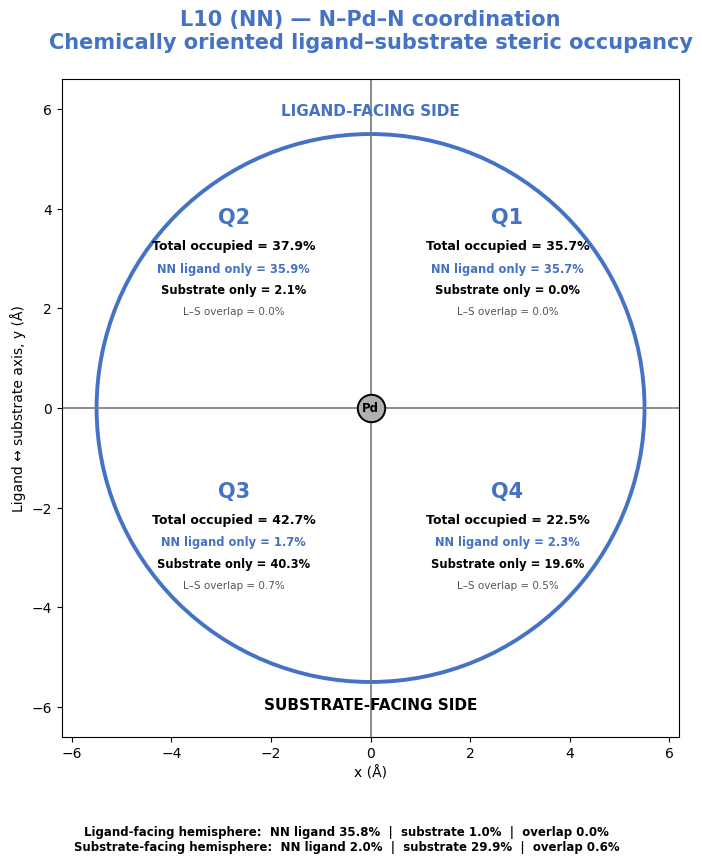

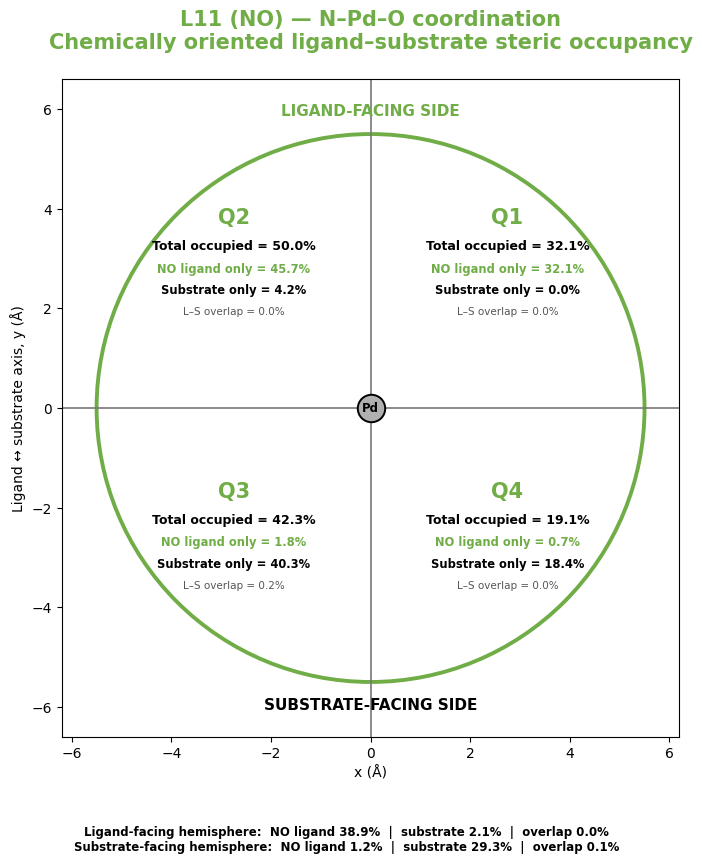

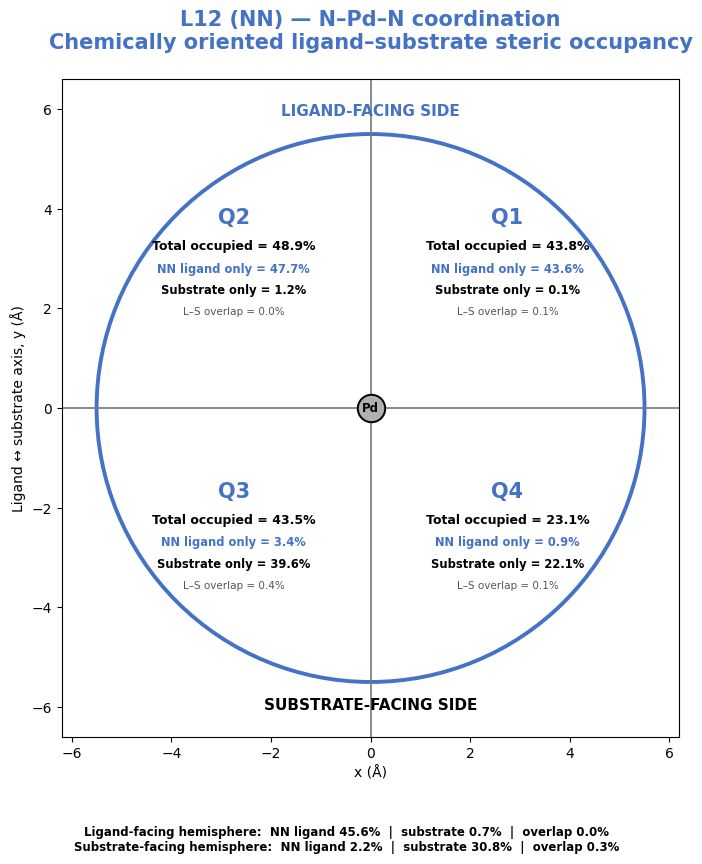

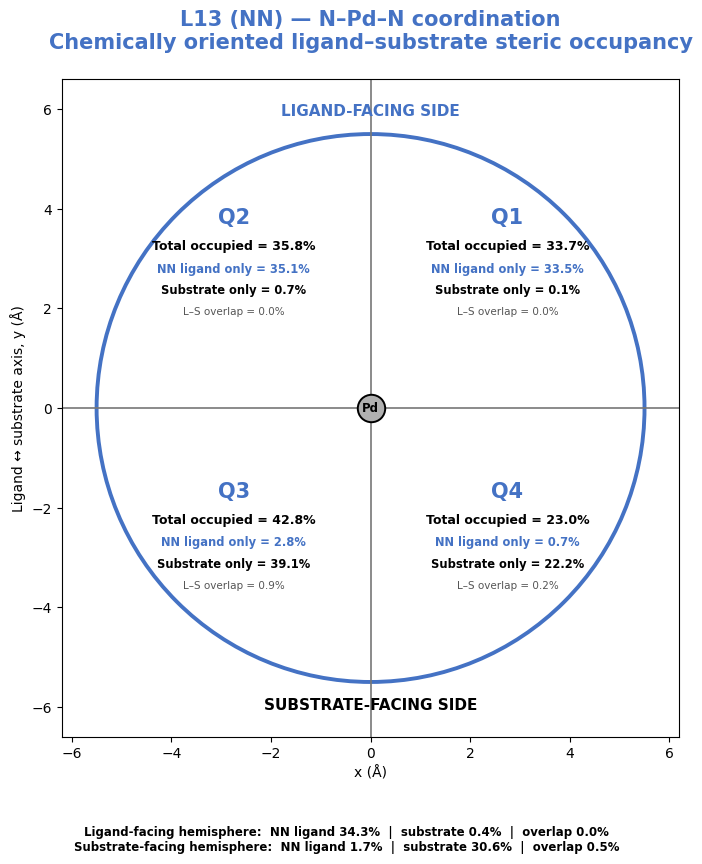

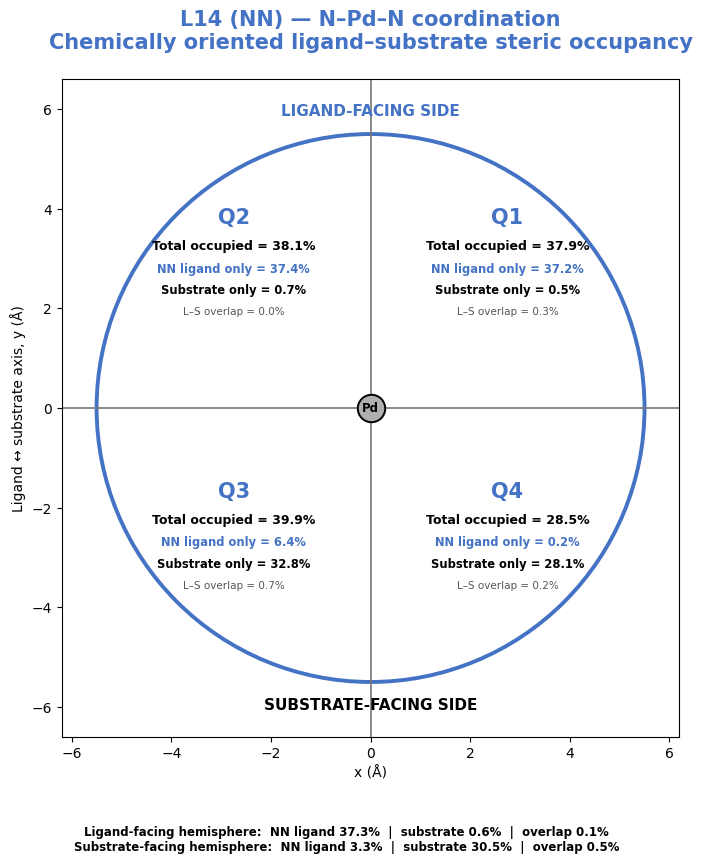

...

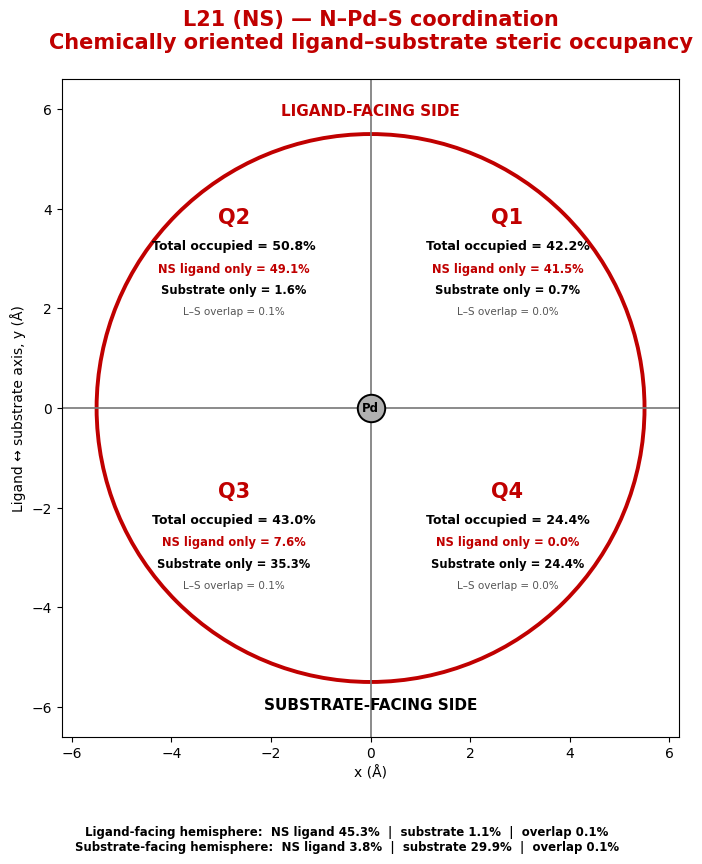

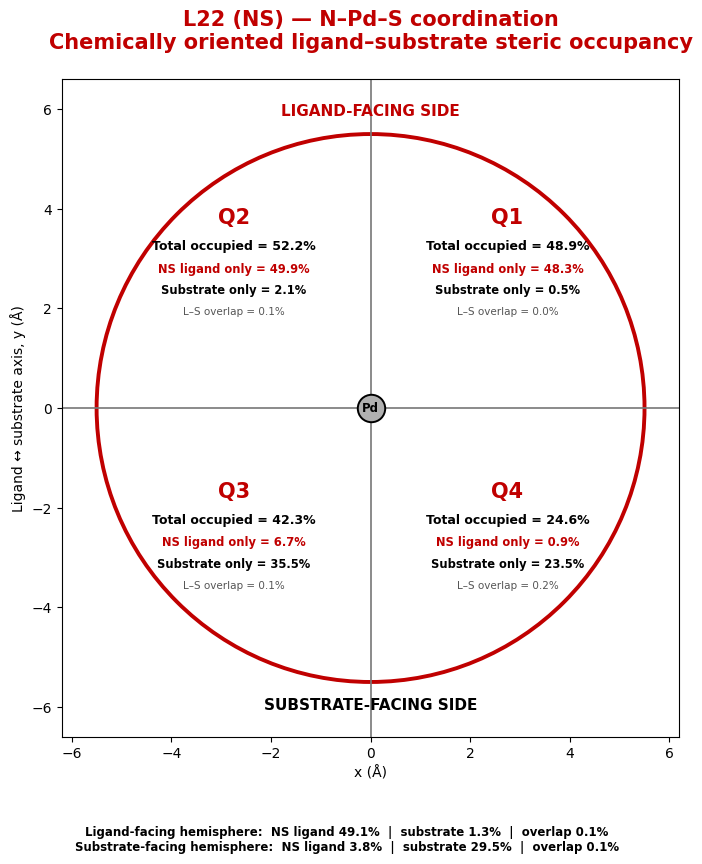

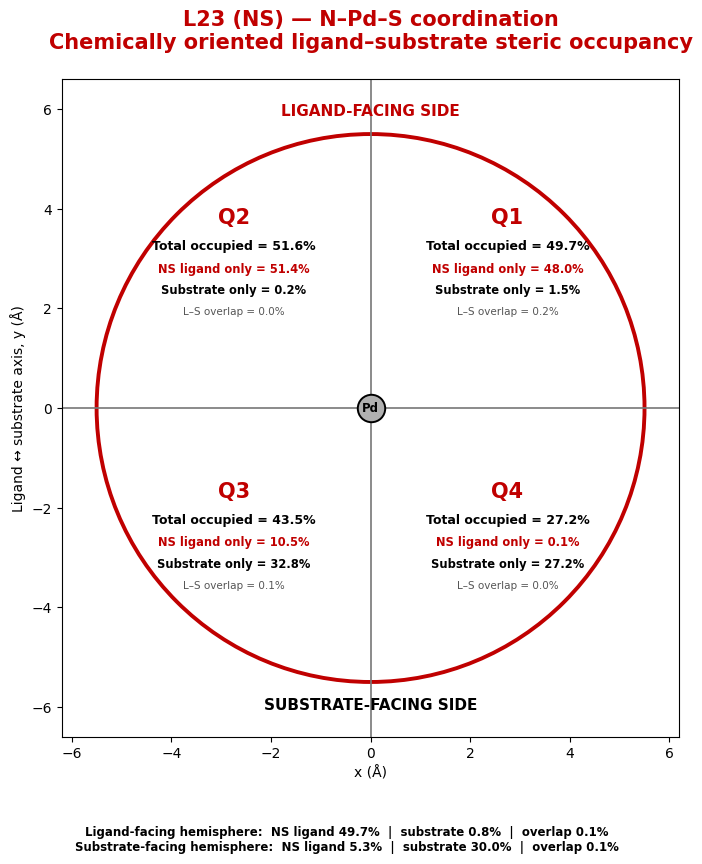

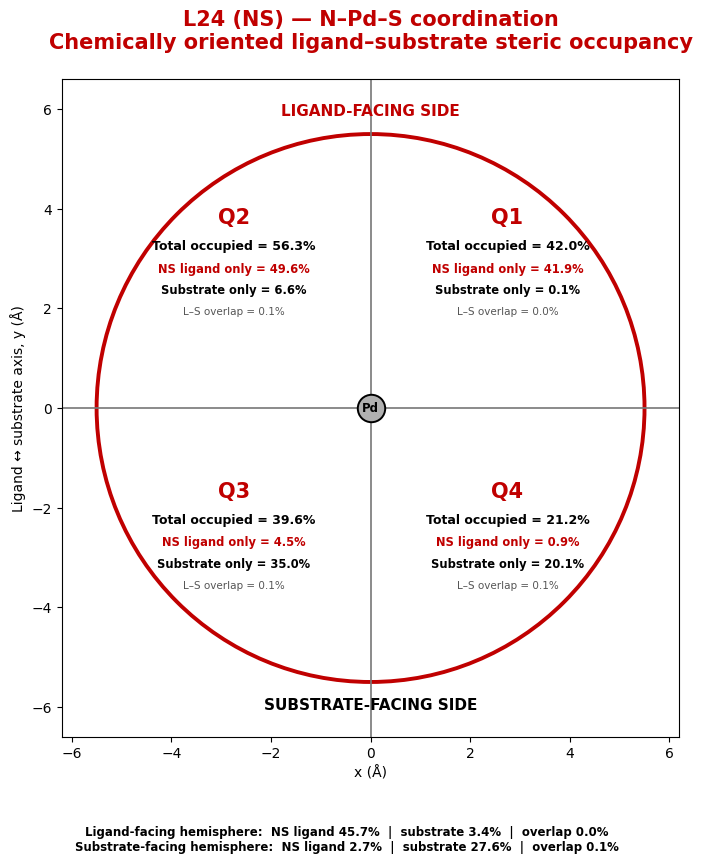

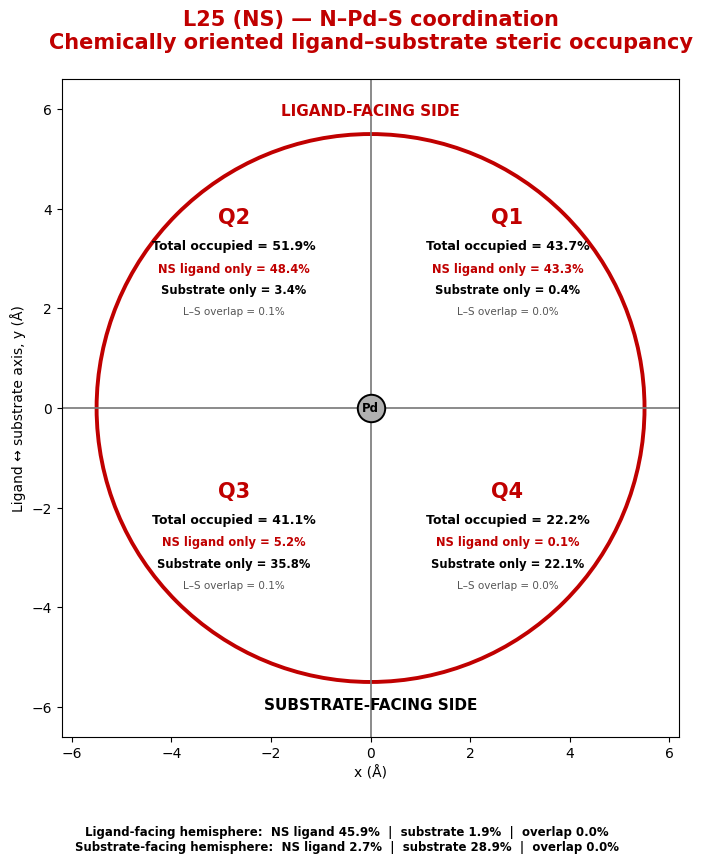



CHEMICALLY ORIENTED ANALYSIS COMPLETE

Figures:
/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Chemically_Oriented_Quadrant_Analysis/Figures

Excel:
/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Chemically_Oriented_Quadrant_Analysis/Chemically_Oriented_Steric_Occupancy.xlsx


In [ ]:
# ======================================================================
# CORRECTED CHEMICALLY ORIENTED STEP 7
#
# PURPOSE
# -------
# Define the Pd-centered coordinate system so that:
#
#                     LIGAND SIDE
#                         +y
#
#                  Q2      |      Q1
#                          |
#                ----------Pd---------- +x
#                          |
#                  Q3      |      Q4
#
#                         -y
#                    SUBSTRATE SIDE
#
#
# CHEMICAL ORIENTATION
# --------------------
# 1. Pd is the origin.
#
# 2. +y is defined from the SUBSTRATE heavy-atom centroid
#    toward the LIGAND heavy-atom centroid.
#
#    Therefore:
#
#        ligand centroid    -> +y
#        substrate centroid -> -y
#
# 3. The donor pair defines left/right (+x/-x).
#
# 4. z is perpendicular to the chemically defined x-y plane.
#
#
# OUTPUTS
# -------
# A. Q1-Q4 ligand/substrate occupancy
#
# B. Ligand-facing hemisphere (+y):
#       ligand only
#       substrate only
#       overlap
#       total
#
# C. Substrate-facing hemisphere (-y):
#       ligand only
#       substrate only
#       overlap
#       total
#
# D. Mathematical validation
#
# IMPORTANT
# ---------
# The quadrant values are NOT Morfeus %Vbur.
# They are a complementary custom spatial occupancy analysis.
#
# ======================================================================


import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ======================================================================
# 1. SETTINGS
# ======================================================================

SPHERE_RADIUS = 5.5
GRID_SPACING = 0.18

VALIDATION_TOLERANCE = 1.0e-8


# ======================================================================
# 2. OUTPUT
# ======================================================================

CHEM_ORIENT_FOLDER = os.path.join(
    VBUR_FOLDER,
    "Chemically_Oriented_Quadrant_Analysis"
)

FIGURE_FOLDER = os.path.join(
    CHEM_ORIENT_FOLDER,
    "Figures"
)

os.makedirs(
    FIGURE_FOLDER,
    exist_ok=True
)


# ======================================================================
# 3. COLORS
# ======================================================================

CLASS_COLORS = {
    "NN": "#4472C4",
    "NO": "#70AD47",
    "NS": "#C00000",
}

COORDINATION_LABELS = {
    "NN": "N–Pd–N coordination",
    "NO": "N–Pd–O coordination",
    "NS": "N–Pd–S coordination",
}


# ======================================================================
# 4. VDW RADII
# ======================================================================

VDW_RADII = {
    "H":  1.20,
    "C":  1.70,
    "N":  1.55,
    "O":  1.52,
    "F":  1.47,
    "P":  1.80,
    "S":  1.80,
    "Cl": 1.75,
    "Br": 1.85,
    "I":  1.98,
}


# ======================================================================
# 5. BASIC HELPERS
# ======================================================================

def normalize(v):

    v = np.asarray(v, dtype=float)

    n = np.linalg.norm(v)

    if n < 1.0e-12:
        raise ValueError("Zero-length vector.")

    return v / n


def angle_deg(a, b, c):

    v1 = np.asarray(a) - np.asarray(b)
    v2 = np.asarray(c) - np.asarray(b)

    v1 /= np.linalg.norm(v1)
    v2 /= np.linalg.norm(v2)

    cosang = np.clip(
        np.dot(v1, v2),
        -1.0,
        1.0
    )

    return np.degrees(
        np.arccos(cosang)
    )


# ======================================================================
# 6. HEAVY-ATOM CENTROID
#
# H atoms are excluded so that long C-H vectors do not influence
# the chemical orientation.
# ======================================================================

def heavy_atom_centroid(
    elements,
    coordinates,
    atom_numbers
):

    heavy_xyz = []

    for atom_number in atom_numbers:

        element = str(
            elements[atom_number - 1]
        )

        if element == "H":
            continue

        if atom_number == PD_ATOM:
            continue

        heavy_xyz.append(
            coordinates[atom_number - 1]
        )


    if len(heavy_xyz) == 0:

        raise ValueError(
            "No heavy atoms available for centroid."
        )


    return np.mean(
        np.asarray(heavy_xyz),
        axis=0
    )


# ======================================================================
# 7. IDENTIFY SECONDARY DONOR
# ======================================================================

def identify_secondary_donor_chemical(
    elements,
    donor1,
    donor2,
    ligand_class
):

    donor1 = int(donor1)
    donor2 = int(donor2)

    e1 = str(elements[donor1 - 1])
    e2 = str(elements[donor2 - 1])


    if ligand_class == "NO":

        if e1 == "O":
            return donor1, "O"

        if e2 == "O":
            return donor2, "O"


    elif ligand_class == "NS":

        if e1 == "S":
            return donor1, "S"

        if e2 == "S":
            return donor2, "S"


    elif ligand_class == "NN":

        if e1 == "N" and e2 == "N":
            return donor2, "N"


    raise ValueError(
        f"Cannot identify secondary donor: "
        f"{ligand_class}, {e1}/{e2}"
    )


# ======================================================================
# 8. CHEMICALLY DEFINED COORDINATE SYSTEM
#
# KEY CORRECTION
#
# +y = substrate centroid -> ligand centroid
#
# This makes:
#
#       TOP    = ligand-facing side
#       BOTTOM = substrate-facing side
#
# Donor geometry determines x-axis.
# ======================================================================

def chemical_coordinate_transform(
    elements,
    coordinates,
    ligand_atoms,
    substrate_atoms,
    donor_primary,
    donor_secondary
):

    xyz = np.asarray(
        coordinates,
        dtype=float
    ).copy()


    # ------------------------------------------------------------------
    # Pd-centered coordinates
    # ------------------------------------------------------------------

    pd_xyz = xyz[
        PD_ATOM - 1
    ].copy()


    xyz_centered = (
        xyz
        -
        pd_xyz
    )


    # ------------------------------------------------------------------
    # Heavy-atom centroids in ORIGINAL coordinates
    # ------------------------------------------------------------------

    ligand_centroid = heavy_atom_centroid(
        elements,
        xyz,
        ligand_atoms
    )


    substrate_centroid = heavy_atom_centroid(
        elements,
        xyz,
        substrate_atoms
    )


    # ------------------------------------------------------------------
    # y-axis:
    #
    # substrate -> ligand
    #
    # This is the chemically important axis.
    # ------------------------------------------------------------------

    y_axis = normalize(
        ligand_centroid
        -
        substrate_centroid
    )


    # ------------------------------------------------------------------
    # Donor vectors from Pd
    # ------------------------------------------------------------------

    d_primary = xyz_centered[
        donor_primary - 1
    ]


    d_secondary = xyz_centered[
        donor_secondary - 1
    ]


    # ------------------------------------------------------------------
    # Candidate x-axis from donor-primary -> donor-secondary
    #
    # Remove component parallel to y.
    # ------------------------------------------------------------------

    donor_difference = (
        d_secondary
        -
        d_primary
    )


    x_temp = (
        donor_difference
        -
        np.dot(
            donor_difference,
            y_axis
        ) * y_axis
    )


    # ------------------------------------------------------------------
    # Fallback if donor vector nearly parallel to y
    # ------------------------------------------------------------------

    if np.linalg.norm(x_temp) < 1.0e-8:

        donor_midpoint = (
            d_primary
            +
            d_secondary
        ) / 2.0


        x_temp = (
            donor_midpoint
            -
            np.dot(
                donor_midpoint,
                y_axis
            ) * y_axis
        )


    x_axis = normalize(
        x_temp
    )


    # ------------------------------------------------------------------
    # z-axis
    # ------------------------------------------------------------------

    z_axis = normalize(
        np.cross(
            x_axis,
            y_axis
        )
    )


    # ------------------------------------------------------------------
    # Reorthogonalize x
    # ------------------------------------------------------------------

    x_axis = normalize(
        np.cross(
            y_axis,
            z_axis
        )
    )


    # ------------------------------------------------------------------
    # Rotation
    # ------------------------------------------------------------------

    rotation = np.vstack([
        x_axis,
        y_axis,
        z_axis
    ])


    transformed = (
        rotation
        @
        xyz_centered.T
    ).T


    # ------------------------------------------------------------------
    # Transform centroids for validation
    # ------------------------------------------------------------------

    ligand_centroid_centered = (
        ligand_centroid
        -
        pd_xyz
    )


    substrate_centroid_centered = (
        substrate_centroid
        -
        pd_xyz
    )


    ligand_centroid_transformed = (
        rotation
        @
        ligand_centroid_centered
    )


    substrate_centroid_transformed = (
        rotation
        @
        substrate_centroid_centered
    )


    # ------------------------------------------------------------------
    # FINAL SIGN CHECK
    #
    # Ligand MUST be above substrate.
    # ------------------------------------------------------------------

    if (
        ligand_centroid_transformed[1]
        <
        substrate_centroid_transformed[1]
    ):

        # Flip y and z together.
        # Keeps a right-handed coordinate system.

        y_axis *= -1.0
        z_axis *= -1.0


        rotation = np.vstack([
            x_axis,
            y_axis,
            z_axis
        ])


        transformed = (
            rotation
            @
            xyz_centered.T
        ).T


        ligand_centroid_transformed = (
            rotation
            @
            ligand_centroid_centered
        )


        substrate_centroid_transformed = (
            rotation
            @
            substrate_centroid_centered
        )


    return {
        "coordinates":
            transformed,

        "rotation":
            rotation,

        "ligand_centroid":
            ligand_centroid_transformed,

        "substrate_centroid":
            substrate_centroid_transformed,

        "x_axis":
            x_axis,

        "y_axis":
            y_axis,

        "z_axis":
            z_axis,
    }


# ======================================================================
# 9. SPHERICAL GRID
# ======================================================================

def build_grid(
    radius=5.5,
    spacing=0.18
):

    values = np.arange(
        -radius,
        radius + spacing,
        spacing
    )


    X, Y, Z = np.meshgrid(
        values,
        values,
        values,
        indexing="ij"
    )


    points = np.column_stack([
        X.ravel(),
        Y.ravel(),
        Z.ravel()
    ])


    inside = (
        np.sum(
            points**2,
            axis=1
        )
        <=
        radius**2
    )


    return points[inside]


# ======================================================================
# 10. COMPONENT MASK
# ======================================================================

def component_mask(
    points,
    elements,
    coordinates,
    atom_numbers
):

    mask = np.zeros(
        len(points),
        dtype=bool
    )


    for atom_number in atom_numbers:

        if atom_number == PD_ATOM:
            continue


        element = str(
            elements[atom_number - 1]
        )


        radius = VDW_RADII.get(
            element
        )


        if radius is None:

            print(
                f"WARNING: missing vdW radius: "
                f"{element}"
            )

            continue


        atom_xyz = coordinates[
            atom_number - 1
        ]


        d2 = np.sum(
            (
                points
                -
                atom_xyz
            )**2,
            axis=1
        )


        mask |= (
            d2
            <=
            radius**2
        )


    return mask


# ======================================================================
# 11. REGION ANALYSIS
# ======================================================================

def analyze_region(
    region_mask,
    ligand_mask,
    substrate_mask
):

    n_region = int(
        np.sum(region_mask)
    )


    if n_region == 0:
        raise ValueError(
            "Spatial region contains zero grid points."
        )


    ligand_only_mask = (
        ligand_mask
        &
        ~substrate_mask
    )


    substrate_only_mask = (
        substrate_mask
        &
        ~ligand_mask
    )


    overlap_mask = (
        ligand_mask
        &
        substrate_mask
    )


    total_mask = (
        ligand_mask
        |
        substrate_mask
    )


    n_total = int(
        np.sum(
            total_mask
            &
            region_mask
        )
    )


    n_ligand_only = int(
        np.sum(
            ligand_only_mask
            &
            region_mask
        )
    )


    n_substrate_only = int(
        np.sum(
            substrate_only_mask
            &
            region_mask
        )
    )


    n_overlap = int(
        np.sum(
            overlap_mask
            &
            region_mask
        )
    )


    def pct(n):

        return (
            100.0
            *
            n
            /
            n_region
        )


    total = pct(
        n_total
    )


    ligand_only = pct(
        n_ligand_only
    )


    substrate_only = pct(
        n_substrate_only
    )


    overlap = pct(
        n_overlap
    )


    component_sum = (
        ligand_only
        +
        substrate_only
        +
        overlap
    )


    integer_pass = (
        n_total
        ==
        (
            n_ligand_only
            +
            n_substrate_only
            +
            n_overlap
        )
    )


    numerical_pass = np.isclose(
        total,
        component_sum,
        atol=VALIDATION_TOLERANCE,
        rtol=0.0
    )


    return {

        "Total":
            total,

        "LigandOnly":
            ligand_only,

        "SubstrateOnly":
            substrate_only,

        "Overlap":
            overlap,

        "ComponentSum":
            component_sum,

        "NRegion":
            n_region,

        "NTotal":
            n_total,

        "IntegerPass":
            integer_pass,

        "NumericalPass":
            numerical_pass,

        "PASS":
            (
                integer_pass
                and
                numerical_pass
            ),
    }


# ======================================================================
# 12. STORAGE
# ======================================================================

quadrant_rows = []
hemisphere_rows = []

plot_data = {}


# ======================================================================
# 13. MAIN ANALYSIS
# ======================================================================

print("\n")
print("=" * 105)
print("CHEMICALLY ORIENTED LIGAND–SUBSTRATE STERIC ANALYSIS")
print("=" * 105)


for _, row in oriented_df.iterrows():


    ligand = str(
        row["Ligand"]
    )


    ligand_class = str(
        row["Class"]
    )


    donor1 = int(
        row["Donor1"]
    )


    donor2 = int(
        row["Donor2"]
    )


    print("\n" + "=" * 105)
    print(
        f"{ligand} ({ligand_class})"
    )
    print("=" * 105)


    try:

        # ==============================================================
        # READ STRUCTURE
        # ==============================================================

        elements, coordinates = read_xyz_file(
            row["File"]
        )


        coordinates = np.asarray(
            coordinates,
            dtype=float
        )


        # ==============================================================
        # COMPONENTS
        # ==============================================================

        ligand_atoms = list(
            range(
                LIGAND_START,
                len(elements) + 1
            )
        )


        substrate_atoms = [

            i

            for i in range(
                1,
                LIGAND_START
            )

            if i != PD_ATOM
        ]


        # ==============================================================
        # DONOR
        # ==============================================================

        (
            secondary_atom,
            secondary_element

        ) = identify_secondary_donor_chemical(

            elements,
            donor1,
            donor2,
            ligand_class
        )


        if secondary_atom == donor1:

            primary_atom = donor2

        else:

            primary_atom = donor1


        # ==============================================================
        # CHEMICAL ORIENTATION
        # ==============================================================

        orient = chemical_coordinate_transform(

            elements=
                elements,

            coordinates=
                coordinates,

            ligand_atoms=
                ligand_atoms,

            substrate_atoms=
                substrate_atoms,

            donor_primary=
                primary_atom,

            donor_secondary=
                secondary_atom
        )


        transformed = orient[
            "coordinates"
        ]


        ligand_centroid = orient[
            "ligand_centroid"
        ]


        substrate_centroid = orient[
            "substrate_centroid"
        ]


        # ==============================================================
        # ORIENTATION VALIDATION
        # ==============================================================

        ligand_y = float(
            ligand_centroid[1]
        )


        substrate_y = float(
            substrate_centroid[1]
        )


        orientation_pass = (
            ligand_y
            >
            substrate_y
        )


        if not orientation_pass:

            raise RuntimeError(
                "Chemical orientation validation failed."
            )


        print(
            f"Ligand centroid y    = "
            f"{ligand_y:+.3f} Å"
        )


        print(
            f"Substrate centroid y = "
            f"{substrate_y:+.3f} Å"
        )


        print(
            "Orientation           = PASS "
            "(ligand top / substrate bottom)"
        )


        # ==============================================================
        # GRID
        # ==============================================================

        points = build_grid(
            SPHERE_RADIUS,
            GRID_SPACING
        )


        ligand_mask = component_mask(
            points,
            elements,
            transformed,
            ligand_atoms
        )


        substrate_mask = component_mask(
            points,
            elements,
            transformed,
            substrate_atoms
        )


        x = points[:, 0]
        y = points[:, 1]


        # ==============================================================
        # QUADRANTS
        # ==============================================================

        region_masks = {

            "Q1":
                (
                    (x >= 0)
                    &
                    (y >= 0)
                ),

            "Q2":
                (
                    (x < 0)
                    &
                    (y >= 0)
                ),

            "Q3":
                (
                    (x < 0)
                    &
                    (y < 0)
                ),

            "Q4":
                (
                    (x >= 0)
                    &
                    (y < 0)
                ),
        }


        quadrant_results = {}


        for q, mask in region_masks.items():

            result = analyze_region(
                mask,
                ligand_mask,
                substrate_mask
            )


            quadrant_results[q] = result


            quadrant_rows.append({

                "Ligand":
                    ligand,

                "Class":
                    ligand_class,

                "Region":
                    q,

                "Side":
                    (
                        "Ligand-facing"
                        if q in ["Q1", "Q2"]
                        else
                        "Substrate-facing"
                    ),

                "TotalOccupied_%":
                    result["Total"],

                f"{ligand_class}_LigandOnly_%":
                    result["LigandOnly"],

                "SubstrateOnly_%":
                    result["SubstrateOnly"],

                "LigandSubstrateOverlap_%":
                    result["Overlap"],

                "ComponentSum_%":
                    result["ComponentSum"],

                "Validation":
                    (
                        "PASS"
                        if result["PASS"]
                        else "FAIL"
                    ),
            })


        # ==============================================================
        # HEMISPHERES
        #
        # THIS IS THE MOST CHEMICALLY INTERPRETABLE PART.
        # ==============================================================

        ligand_facing_mask = (
            y >= 0
        )


        substrate_facing_mask = (
            y < 0
        )


        ligand_facing = analyze_region(
            ligand_facing_mask,
            ligand_mask,
            substrate_mask
        )


        substrate_facing = analyze_region(
            substrate_facing_mask,
            ligand_mask,
            substrate_mask
        )


        hemisphere_results = {

            "Ligand-facing":
                ligand_facing,

            "Substrate-facing":
                substrate_facing,
        }


        for side, result in hemisphere_results.items():

            hemisphere_rows.append({

                "Ligand":
                    ligand,

                "Class":
                    ligand_class,

                "Hemisphere":
                    side,

                "TotalOccupied_%":
                    result["Total"],

                f"{ligand_class}_LigandOnly_%":
                    result["LigandOnly"],

                "SubstrateOnly_%":
                    result["SubstrateOnly"],

                "LigandSubstrateOverlap_%":
                    result["Overlap"],

                "ComponentSum_%":
                    result["ComponentSum"],

                "Validation":
                    (
                        "PASS"
                        if result["PASS"]
                        else "FAIL"
                    ),
            })


        # ==============================================================
        # ALL CHECKS
        # ==============================================================

        all_pass = all(

            quadrant_results[q]["PASS"]

            for q in quadrant_results

        ) and all(

            hemisphere_results[h]["PASS"]

            for h in hemisphere_results
        )


        if not all_pass:

            raise RuntimeError(
                "Region validation failed."
            )


        # ==============================================================
        # PRINT RESULTS
        # ==============================================================

        print("\nQUADRANTS")


        for q in [
            "Q1",
            "Q2",
            "Q3",
            "Q4"
        ]:

            r = quadrant_results[q]

            print(
                f"{q}: "
                f"Total={r['Total']:.2f}% | "
                f"{ligand_class} ligand={r['LigandOnly']:.2f}% | "
                f"Substrate={r['SubstrateOnly']:.2f}% | "
                f"Overlap={r['Overlap']:.2f}% | PASS"
            )


        print("\nCHEMICAL HEMISPHERES")


        print(
            "Ligand-facing (+y): "
            f"Total={ligand_facing['Total']:.2f}% | "
            f"{ligand_class} ligand={ligand_facing['LigandOnly']:.2f}% | "
            f"Substrate={ligand_facing['SubstrateOnly']:.2f}% | "
            f"Overlap={ligand_facing['Overlap']:.2f}%"
        )


        print(
            "Substrate-facing (-y): "
            f"Total={substrate_facing['Total']:.2f}% | "
            f"{ligand_class} ligand={substrate_facing['LigandOnly']:.2f}% | "
            f"Substrate={substrate_facing['SubstrateOnly']:.2f}% | "
            f"Overlap={substrate_facing['Overlap']:.2f}%"
        )


        # ==============================================================
        # STORE FOR FIGURE
        # ==============================================================

        plot_data[ligand] = {

            "Class":
                ligand_class,

            "SecondaryElement":
                secondary_element,

            "Quadrants":
                quadrant_results,

            "Hemispheres":
                hemisphere_results,

            "LigandCentroid":
                ligand_centroid,

            "SubstrateCentroid":
                substrate_centroid,
        }


    except Exception as error:

        print(
            f"ERROR: {ligand}: {error}"
        )


# ======================================================================
# 14. GENERATE CORRECTED FIGURES
# ======================================================================

print("\n")
print("=" * 105)
print("GENERATING CHEMICALLY ORIENTED FIGURES")
print("=" * 105)


for ligand, data in plot_data.items():


    ligand_class = data[
        "Class"
    ]


    class_color = CLASS_COLORS.get(
        ligand_class,
        "black"
    )


    quadrants = data[
        "Quadrants"
    ]


    hemispheres = data[
        "Hemispheres"
    ]


    fig, ax = plt.subplots(
        figsize=(8.5, 9.0)
    )


    # ==============================================================
    # SPHERE
    # ==============================================================

    circle = plt.Circle(
        (0, 0),
        SPHERE_RADIUS,
        fill=False,
        edgecolor=class_color,
        linewidth=2.8
    )

    ax.add_patch(
        circle
    )


    # ==============================================================
    # QUADRANT LINES
    # ==============================================================

    ax.axhline(
        0,
        linewidth=1.2,
        color="#777777"
    )


    ax.axvline(
        0,
        linewidth=1.2,
        color="#777777"
    )


    # ==============================================================
    # Pd
    # ==============================================================

    ax.scatter(
        0,
        0,
        s=390,
        facecolor="#B0B0B0",
        edgecolor="black",
        linewidth=1.4,
        zorder=10
    )


    ax.text(
        0,
        0,
        "Pd",
        ha="center",
        va="center",
        fontsize=8.5,
        fontweight="bold",
        zorder=11
    )


    # ==============================================================
    # CHEMICAL SIDE LABELS
    # ==============================================================

    ax.text(
        0,
        5.82,
        "LIGAND-FACING SIDE",
        ha="center",
        va="bottom",
        fontsize=11,
        fontweight="bold",
        color=class_color
    )


    ax.text(
        0,
        -5.82,
        "SUBSTRATE-FACING SIDE",
        ha="center",
        va="top",
        fontsize=11,
        fontweight="bold"
    )


    # ==============================================================
    # QUADRANT TEXT
    # ==============================================================

    positions = {
        "Q1": (2.75, 2.75),
        "Q2": (-2.75, 2.75),
        "Q3": (-2.75, -2.75),
        "Q4": (2.75, -2.75),
    }


    for q in [
        "Q1",
        "Q2",
        "Q3",
        "Q4"
    ]:

        r = quadrants[q]

        px, py = positions[q]


        ax.text(
            px,
            py + 0.95,
            q,
            ha="center",
            fontsize=15,
            fontweight="bold",
            color=class_color
        )


        ax.text(
            px,
            py + 0.43,
            f"Total occupied = {r['Total']:.1f}%",
            ha="center",
            fontsize=9.0,
            fontweight="bold"
        )


        ax.text(
            px,
            py - 0.02,
            (
                f"{ligand_class} ligand only = "
                f"{r['LigandOnly']:.1f}%"
            ),
            ha="center",
            fontsize=8.3,
            fontweight="bold",
            color=class_color
        )


        ax.text(
            px,
            py - 0.45,
            (
                f"Substrate only = "
                f"{r['SubstrateOnly']:.1f}%"
            ),
            ha="center",
            fontsize=8.3,
            fontweight="bold"
        )


        ax.text(
            px,
            py - 0.87,
            (
                f"L–S overlap = "
                f"{r['Overlap']:.1f}%"
            ),
            ha="center",
            fontsize=7.5,
            color="#555555"
        )


    # ==============================================================
    # TITLE
    # ==============================================================

    ax.set_title(
        (
            f"{ligand} ({ligand_class}) — "
            f"{COORDINATION_LABELS.get(ligand_class, ligand_class)}\n"
            "Chemically oriented ligand–substrate steric occupancy"
        ),
        fontsize=15,
        fontweight="bold",
        color=class_color,
        pad=22
    )


    # ==============================================================
    # AXES
    # ==============================================================

    ax.set_xlim(
        -6.2,
        6.2
    )

    ax.set_ylim(
        -6.6,
        6.6
    )

    ax.set_aspect(
        "equal"
    )

    ax.set_xlabel(
        "x (Å)"
    )

    ax.set_ylabel(
        "Ligand ↔ substrate axis, y (Å)"
    )


    # ==============================================================
    # HEMISPHERE SUMMARY
    # ==============================================================

    lf = hemispheres[
        "Ligand-facing"
    ]


    sf = hemispheres[
        "Substrate-facing"
    ]


    hemisphere_text = (

        "Ligand-facing hemisphere:  "
        f"{ligand_class} ligand {lf['LigandOnly']:.1f}%  |  "
        f"substrate {lf['SubstrateOnly']:.1f}%  |  "
        f"overlap {lf['Overlap']:.1f}%\n"

        "Substrate-facing hemisphere:  "
        f"{ligand_class} ligand {sf['LigandOnly']:.1f}%  |  "
        f"substrate {sf['SubstrateOnly']:.1f}%  |  "
        f"overlap {sf['Overlap']:.1f}%"
    )


    fig.text(
        0.5,
        0.025,
        hemisphere_text,
        ha="center",
        va="bottom",
        fontsize=8.5,
        fontweight="bold"
    )


    plt.tight_layout(
        rect=[
            0.02,
            0.09,
            0.98,
            0.98
        ]
    )


    output_file = os.path.join(
        FIGURE_FOLDER,
        (
            f"{ligand}_"
            f"{ligand_class}_"
            "Chemically_Oriented_Occupancy.png"
        )
    )


    fig.savefig(
        output_file,
        dpi=600,
        bbox_inches="tight",
        facecolor="white"
    )


    plt.show()

    plt.close(
        fig
    )


# ======================================================================
# 15. EXPORT TABLES
# ======================================================================

quadrant_df = pd.DataFrame(
    quadrant_rows
)


hemisphere_df = pd.DataFrame(
    hemisphere_rows
)


excel_file = os.path.join(
    CHEM_ORIENT_FOLDER,
    "Chemically_Oriented_Steric_Occupancy.xlsx"
)


with pd.ExcelWriter(
    excel_file,
    engine="openpyxl"
) as writer:


    quadrant_df.to_excel(
        writer,
        sheet_name="Quadrants",
        index=False
    )


    hemisphere_df.to_excel(
        writer,
        sheet_name="Hemispheres",
        index=False
    )


print("\n")
print("=" * 105)
print("CHEMICALLY ORIENTED ANALYSIS COMPLETE")
print("=" * 105)


print(
    f"\nFigures:\n{FIGURE_FOLDER}"
)


print(
    f"\nExcel:\n{excel_file}"
)

## Combined (Step-6 + Step-7) Figure: overall steric environment → spatial distribution → ligand/substrate partitioning.

Combining Step 6 (%Vbur steric map) and Step 7 (quadrant decomposition) makes chemical sense, and I think it can be more informative than presenting them as two unrelated figures. But I would combine them as complementary panels, not mathematically merge the two methods into one new descriptor.
The reason is that they answer different questions:
\[
\boxed{\text{Step 6: HOW MUCH / WHERE is the ligand steric environment?}}
\]versus
\[
\boxed{\text{Step 7: WHO occupies each spatial region—ligand or substrate?}}
\]So together they can provide a clearer picture of why NN, NO, and NS ligands generate different Pd environments.


Building 5.5 Å spherical grid once...
Grid points inside sphere = 119,424


FINAL THREE-PANEL STERIC ANALYSIS


L10 (NN)


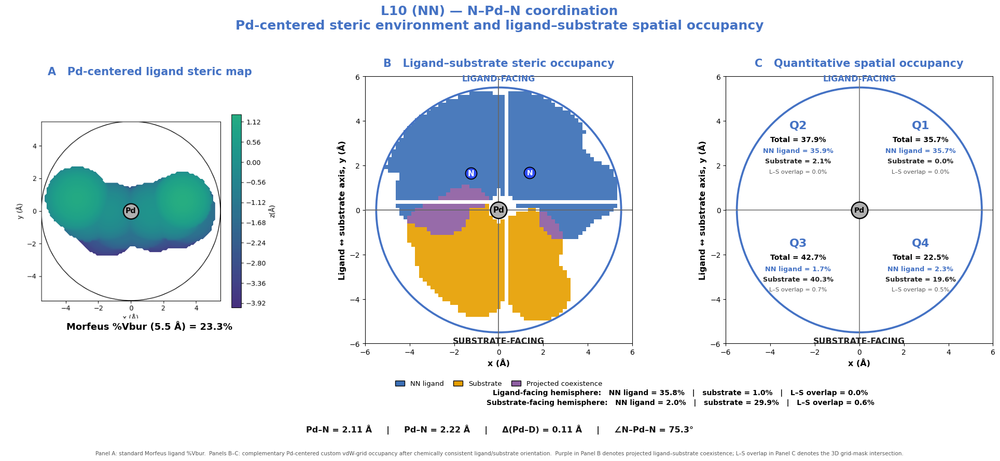


✓ L10 (NN)
  Morfeus %Vbur        = 23.263%
  Ligand centroid y    = +2.309 Å
  Substrate centroid y = -2.116 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L10_NN_ThreePanel_Steric_Analysis.png


L11 (NO)


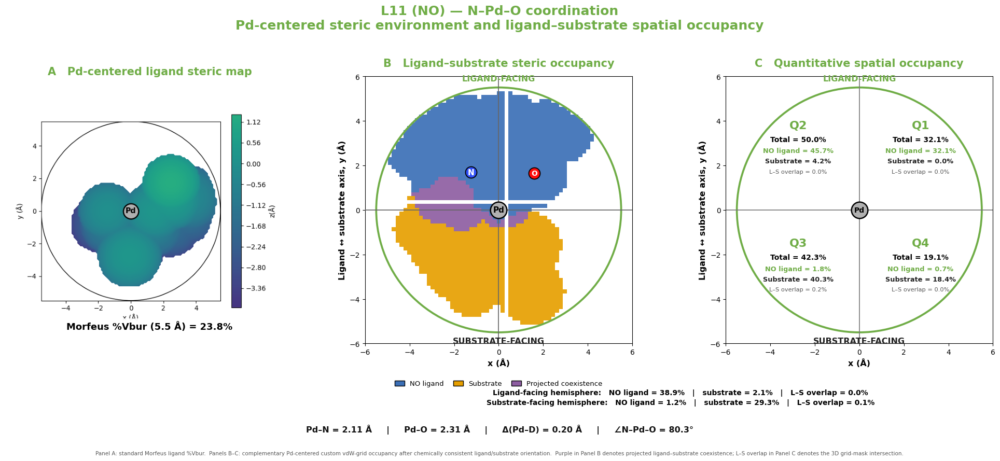


✓ L11 (NO)
  Morfeus %Vbur        = 23.817%
  Ligand centroid y    = +2.515 Å
  Substrate centroid y = -1.985 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L11_NO_ThreePanel_Steric_Analysis.png


L12 (NN)


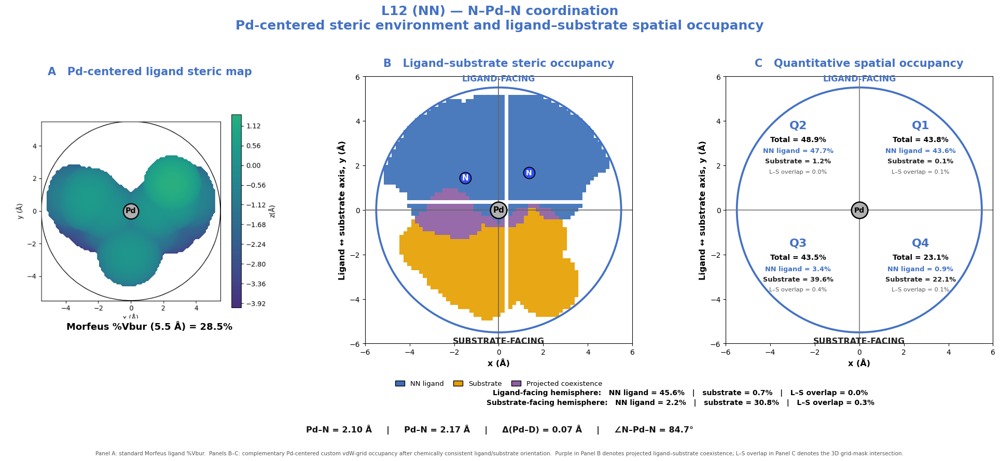


✓ L12 (NN)
  Morfeus %Vbur        = 28.484%
  Ligand centroid y    = +2.419 Å
  Substrate centroid y = -2.122 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L12_NN_ThreePanel_Steric_Analysis.png


L13 (NN)


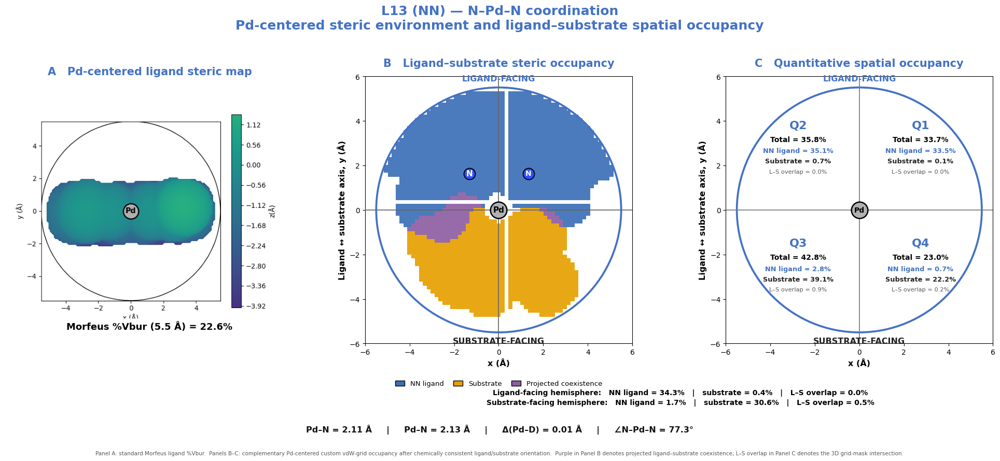


✓ L13 (NN)
  Morfeus %Vbur        = 22.590%
  Ligand centroid y    = +2.552 Å
  Substrate centroid y = -2.204 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L13_NN_ThreePanel_Steric_Analysis.png


L14 (NN)


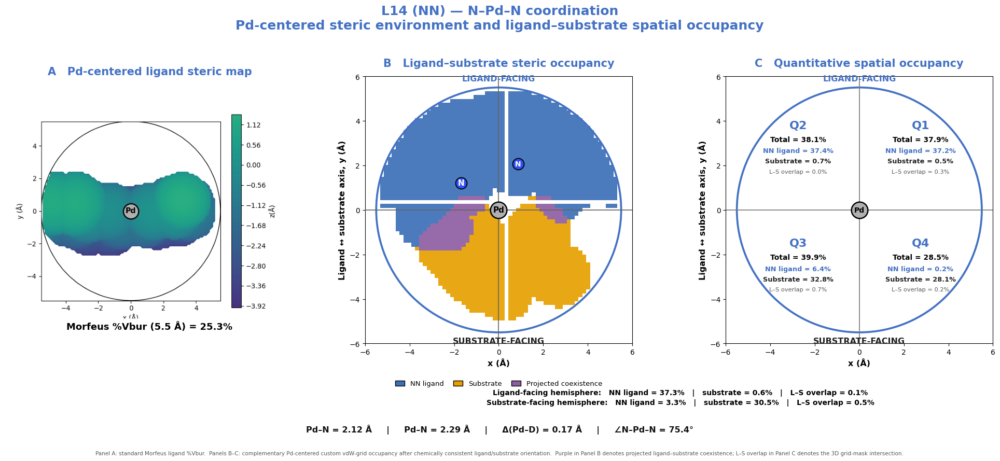


✓ L14 (NN)
  Morfeus %Vbur        = 25.291%
  Ligand centroid y    = +2.481 Å
  Substrate centroid y = -2.146 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L14_NN_ThreePanel_Steric_Analysis.png


L15 (NO)


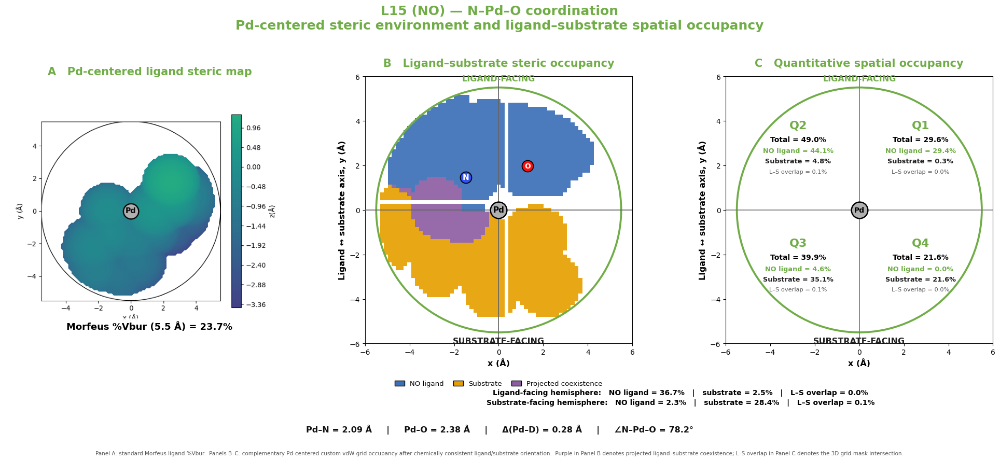


✓ L15 (NO)
  Morfeus %Vbur        = 23.702%
  Ligand centroid y    = +2.510 Å
  Substrate centroid y = -1.851 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L15_NO_ThreePanel_Steric_Analysis.png


L16 (NO)


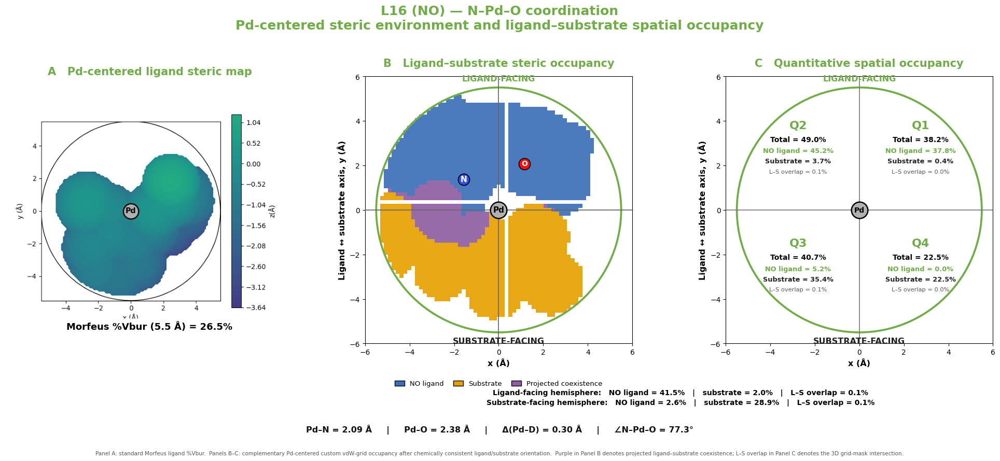


✓ L16 (NO)
  Morfeus %Vbur        = 26.508%
  Ligand centroid y    = +2.400 Å
  Substrate centroid y = -1.901 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L16_NO_ThreePanel_Steric_Analysis.png


L17 (NO)


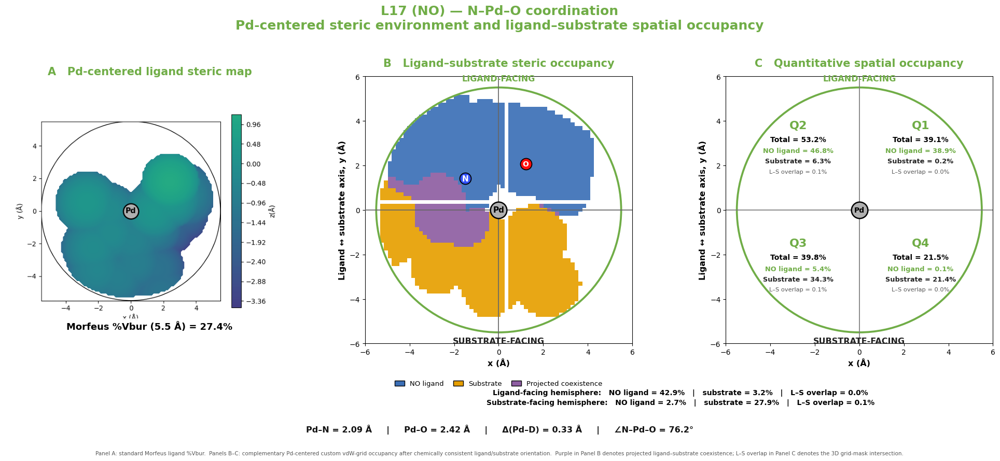


✓ L17 (NO)
  Morfeus %Vbur        = 27.432%
  Ligand centroid y    = +2.580 Å
  Substrate centroid y = -1.778 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L17_NO_ThreePanel_Steric_Analysis.png


L18 (NN)


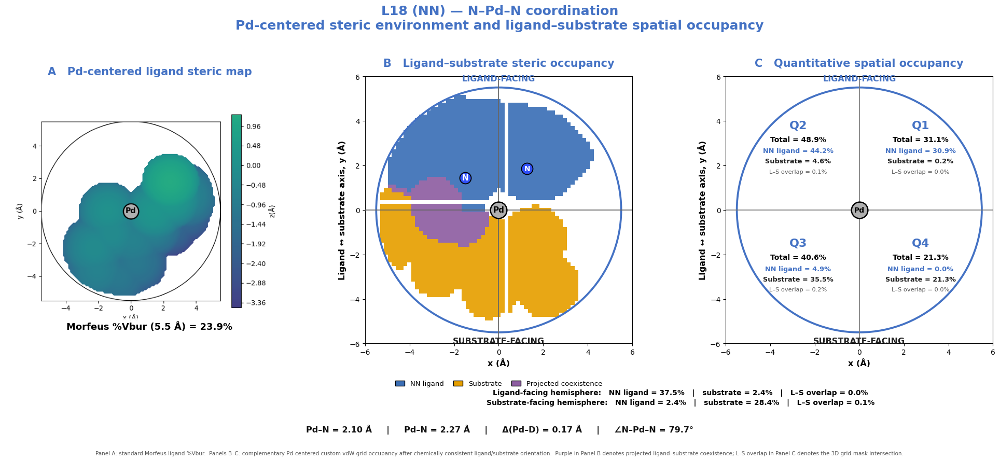


✓ L18 (NN)
  Morfeus %Vbur        = 23.933%
  Ligand centroid y    = +2.491 Å
  Substrate centroid y = -1.879 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L18_NN_ThreePanel_Steric_Analysis.png


L19 (NN)


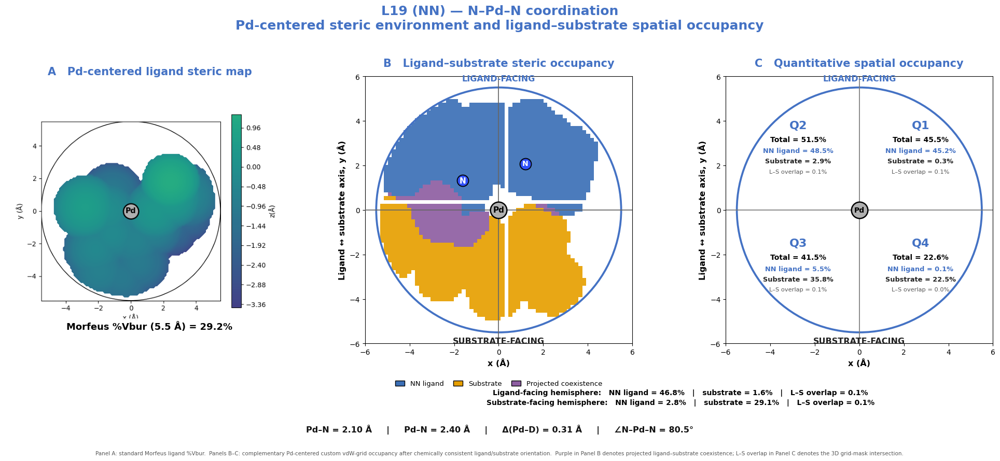


✓ L19 (NN)
  Morfeus %Vbur        = 29.172%
  Ligand centroid y    = +2.375 Å
  Substrate centroid y = -1.959 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L19_NN_ThreePanel_Steric_Analysis.png


L20 (NS)


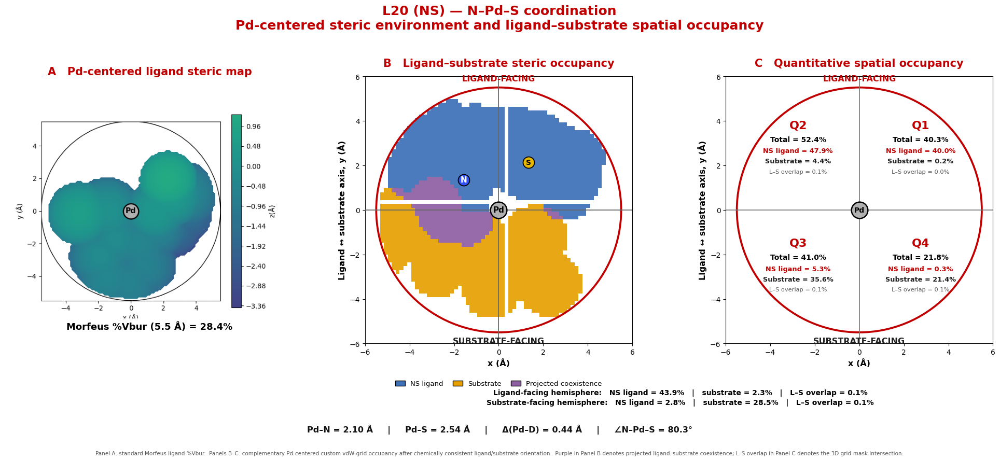


✓ L20 (NS)
  Morfeus %Vbur        = 28.363%
  Ligand centroid y    = +2.332 Å
  Substrate centroid y = -1.871 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L20_NS_ThreePanel_Steric_Analysis.png


L21 (NS)


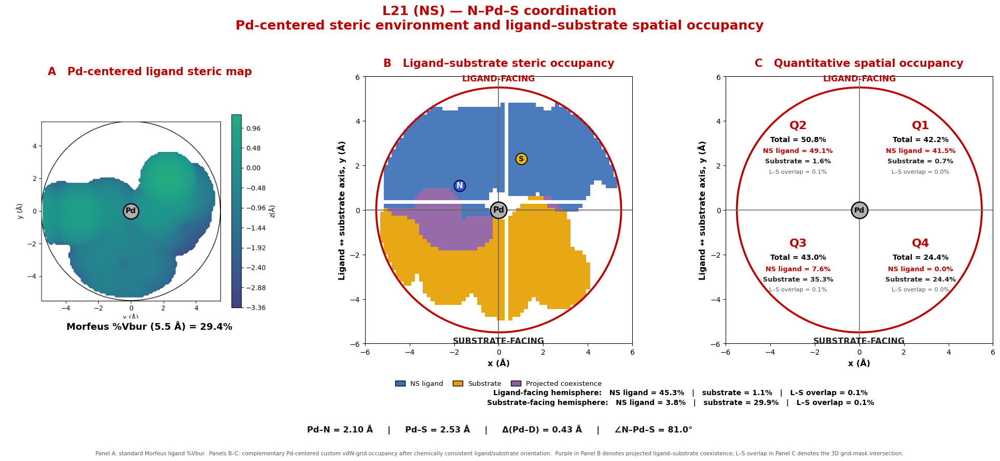


✓ L21 (NS)
  Morfeus %Vbur        = 29.394%
  Ligand centroid y    = +2.300 Å
  Substrate centroid y = -1.983 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L21_NS_ThreePanel_Steric_Analysis.png


L22 (NS)


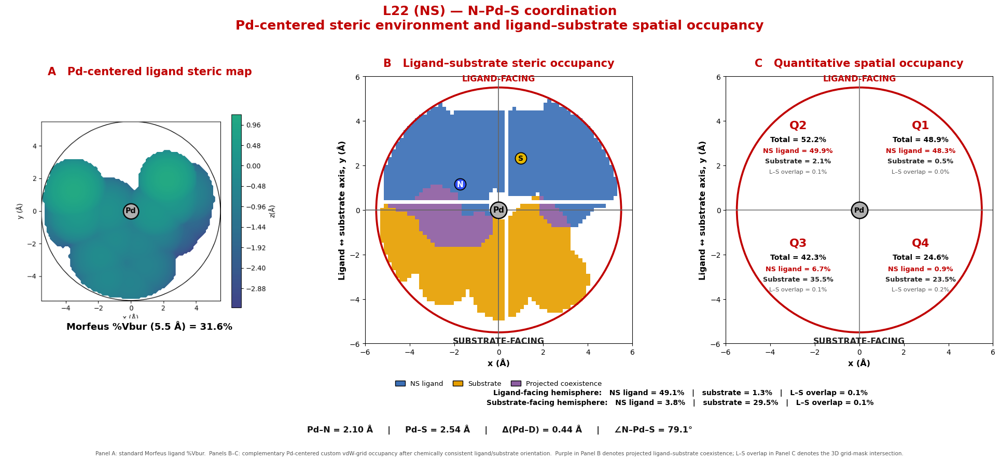


✓ L22 (NS)
  Morfeus %Vbur        = 31.564%
  Ligand centroid y    = +2.217 Å
  Substrate centroid y = -1.968 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L22_NS_ThreePanel_Steric_Analysis.png


L23 (NS)


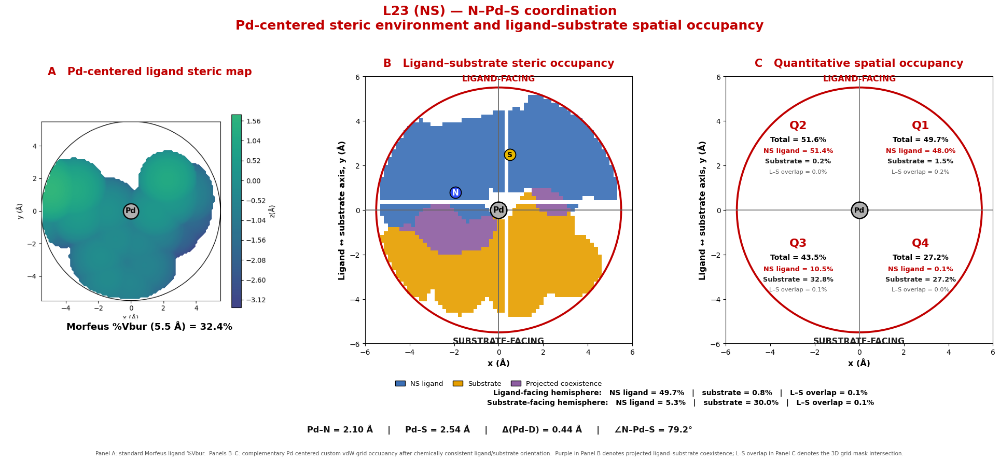


✓ L23 (NS)
  Morfeus %Vbur        = 32.444%
  Ligand centroid y    = +2.196 Å
  Substrate centroid y = -2.076 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L23_NS_ThreePanel_Steric_Analysis.png


L24 (NS)


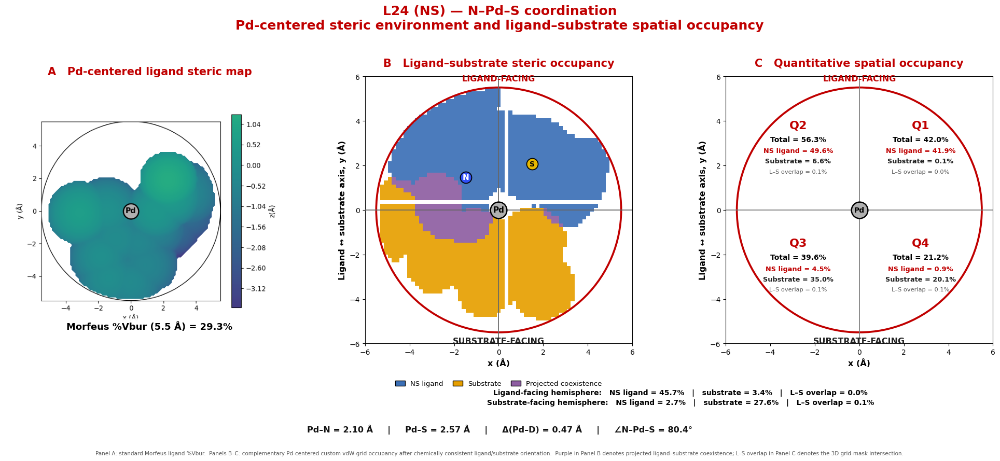


✓ L24 (NS)
  Morfeus %Vbur        = 29.319%
  Ligand centroid y    = +2.805 Å
  Substrate centroid y = -1.787 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L24_NS_ThreePanel_Steric_Analysis.png


L25 (NS)


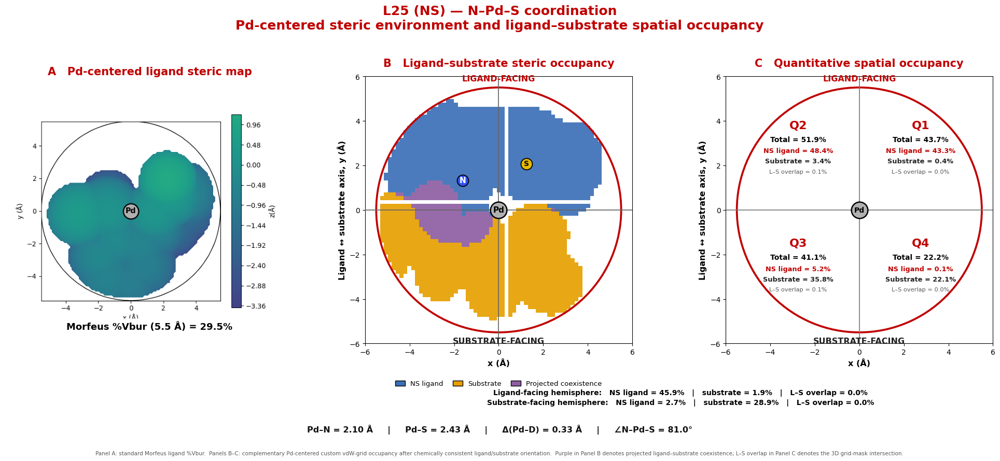


✓ L25 (NS)
  Morfeus %Vbur        = 29.508%
  Ligand centroid y    = +2.388 Å
  Substrate centroid y = -1.912 Å
  Orientation          = PASS
  Occupancy identity   = PASS
  Quadrants            = PASS
  Hemispheres          = PASS
  Figure saved:
  /content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures/L25_NS_ThreePanel_Steric_Analysis.png


FINAL VALIDATION
Structures completed : 16
Summary validation   : PASS
Quadrant validation  : PASS
Hemisphere validation: PASS

>>> COMPLETE ANALYSIS: PASS


,Ligand,Class,Coordination,Morfeus_%Vbur_5.5A,Custom_LigandOnly_Global_%,Custom_SubstrateOnly_Global_%,Custom_Overlap_Global_%,Custom_TotalOccupied_Global_%,Pd_N_Distance_A,SecondaryDonor,Pd_SecondaryDonor_Distance_A,Delta_Pd_Donor_Distance_A,Bite_Angle_deg,LigandCentroid_y_A,SubstrateCentroid_y_A,Quadrant_Asymmetry_%,Validation
0,L10,NN,N–Pd–N coordination,23.263,18.938,15.447,0.310,34.696,2.107,N,2.218,0.112,75.300,2.309,-2.116,20.273,PASS
1,L11,NO,N–Pd–O coordination,23.817,20.122,15.674,0.066,35.862,2.115,O,2.311,0.196,80.278,2.515,-1.985,30.879,PASS
2,L12,NN,N–Pd–N coordination,28.484,23.973,15.706,0.144,39.823,2.101,N,2.168,0.068,84.688,2.419,-2.122,25.872,PASS
3,L13,NN,N–Pd–N coordination,22.590,18.055,15.471,0.277,33.803,2.113,N,2.127,0.014,77.331,2.552,-2.204,19.839,PASS
4,L14,NN,N–Pd–N coordination,25.291,20.338,15.473,0.303,36.114,2.121,N,2.286,0.166,75.362,2.481,-2.146,11.448,PASS
5,L15,NO,N–Pd–O coordination,23.702,19.558,15.410,0.047,35.015,2.093,O,2.377,0.284,78.203,2.510,-1.851,27.352,PASS
6,L16,NO,N–Pd–O coordination,26.508,22.098,15.430,0.053,37.580,2.089,O,2.385,0.296,77.266,2.400,-1.901,26.488,PASS
7,L17,NO,N–Pd–O coordination,27.432,22.845,15.509,0.048,38.403,2.086,O,2.416,0.331,76.200,2.580,-1.778,31.650,PASS
8,L18,NN,N–Pd–N coordination,23.933,20.045,15.352,0.061,35.459,2.104,N,2.275,0.171,79.735,2.491,-1.879,27.583,PASS
9,L19,NN,N–Pd–N coordination,29.172,24.882,15.329,0.084,40.294,2.096,N,2.401,0.305,80.517,2.375,-1.959,28.937,PASS




OUTPUT

Figures:
/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Figures

Excel:
/content/drive/MyDrive/Nat_Syn_DM_NN_NO_NS_Visualizations/02_Buried_Volume/Final_ThreePanel_Steric_Analysis/Tables/Final_ThreePanel_Steric_Analysis.xlsx


FINAL THREE-PANEL ANALYSIS COMPLETE


In [ ]:
# ======================================================================
# FINAL PUBLICATION VISUALIZATION
# ======================================================================
#
# THREE-PANEL Pd-CENTERED STERIC ANALYSIS
#
# PANEL A
#   Standard Morfeus ligand steric map
#   %Vbur (5.5 Å)
#
# PANEL B
#   Component-resolved ligand–substrate steric occupancy map
#
#       Ligand only              = BLUE
#       Substrate only           = ORANGE
#       Ligand–substrate overlap = PURPLE
#       Pd                       = GRAY
#
#   Coordinating donor markers:
#       N = BLUE
#       O = RED
#       S = GOLD
#
# PANEL C
#   Chemically oriented quadrant analysis
#
#                  LIGAND-FACING
#
#              Q2        |        Q1
#                        |
#              ----------Pd----------
#                        |
#              Q3        |        Q4
#
#                SUBSTRATE-FACING
#
#
# IMPORTANT
# ======================================================================
# Panel A = standard Morfeus ligand %Vbur.
#
# Panels B/C = complementary custom vdW-grid occupancy analysis.
#
# The code DOES NOT claim:
#
#   Morfeus %Vbur =
#   custom ligand occupancy + substrate occupancy.
#
# They are deliberately kept as distinct analyses.
#
# ======================================================================


# ======================================================================
# 0. IMPORTS
# ======================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matplotlib.colors import ListedColormap
from matplotlib.lines import Line2D
from matplotlib.patches import Patch


# ======================================================================
# 1. SETTINGS
# ======================================================================

SPHERE_RADIUS = 5.5

# 0.18 Å gives good accuracy while remaining computationally practical.
GRID_SPACING = 0.18

VALIDATION_TOLERANCE = 1.0e-8

DPI = 600

# Consistent enlarged Pd marker in Panels A, B, and C
PD_MARKER_SIZE = 520
PD_LABEL_SIZE = 11
PD_EDGE_WIDTH = 1.8


# ======================================================================
# 2. OUTPUT FOLDERS
# ======================================================================

FINAL_FOLDER = os.path.join(
    VBUR_FOLDER,
    "Final_ThreePanel_Steric_Analysis"
)

FIGURE_FOLDER = os.path.join(
    FINAL_FOLDER,
    "Figures"
)

TABLE_FOLDER = os.path.join(
    FINAL_FOLDER,
    "Tables"
)

os.makedirs(
    FIGURE_FOLDER,
    exist_ok=True
)

os.makedirs(
    TABLE_FOLDER,
    exist_ok=True
)


# ======================================================================
# 3. COLORS
# ======================================================================

# Ligand-class colors are used for titles/borders only.

CLASS_COLORS = {

    "NN": "#4472C4",

    "NO": "#70AD47",

    "NS": "#C00000",
}


# Component colors remain IDENTICAL for all ligand classes.

LIGAND_COLOR = "#3B6FB6"

SUBSTRATE_COLOR = "#E69F00"

OVERLAP_COLOR = "#8E5EA2"

PD_COLOR = "#B0B0B0"


# Conventional donor atom colors.

DONOR_COLORS = {

    "N": "#3050F8",

    "O": "#FF0D0D",

    "S": "#E6B800",
}


COORDINATION_LABELS = {

    "NN": "N–Pd–N coordination",

    "NO": "N–Pd–O coordination",

    "NS": "N–Pd–S coordination",
}


# ======================================================================
# 4. VAN DER WAALS RADII
# ======================================================================

VDW_RADII = {

    "H":  1.20,

    "C":  1.70,

    "N":  1.55,

    "O":  1.52,

    "F":  1.47,

    "P":  1.80,

    "S":  1.80,

    "Cl": 1.75,

    "Br": 1.85,

    "I":  1.98,
}


# ======================================================================
# 5. BASIC HELPERS
# ======================================================================

def normalize(v):

    v = np.asarray(
        v,
        dtype=float
    )

    n = np.linalg.norm(v)

    if n < 1.0e-12:

        raise ValueError(
            "Zero-length vector encountered."
        )

    return v / n


def angle_deg(a, b, c):

    v1 = (
        np.asarray(a, dtype=float)
        -
        np.asarray(b, dtype=float)
    )

    v2 = (
        np.asarray(c, dtype=float)
        -
        np.asarray(b, dtype=float)
    )

    n1 = np.linalg.norm(v1)
    n2 = np.linalg.norm(v2)

    if n1 < 1.0e-12 or n2 < 1.0e-12:

        return np.nan


    cosang = np.dot(
        v1,
        v2
    ) / (
        n1 * n2
    )


    cosang = np.clip(
        cosang,
        -1.0,
        1.0
    )


    return float(
        np.degrees(
            np.arccos(
                cosang
            )
        )
    )


# ======================================================================
# 6. HEAVY-ATOM CENTROID
# ======================================================================

def heavy_atom_centroid(
    elements,
    coordinates,
    atom_numbers
):

    heavy_xyz = []


    for atom_number in atom_numbers:

        if atom_number == PD_ATOM:

            continue


        element = str(
            elements[
                atom_number - 1
            ]
        )


        if element == "H":

            continue


        heavy_xyz.append(

            coordinates[
                atom_number - 1
            ]
        )


    if len(heavy_xyz) == 0:

        raise ValueError(
            "No heavy atoms found for centroid."
        )


    return np.mean(
        np.asarray(
            heavy_xyz
        ),
        axis=0
    )


# ======================================================================
# 7. SECONDARY DONOR IDENTIFICATION
# ======================================================================

def identify_secondary_donor_final(
    elements,
    donor1,
    donor2,
    ligand_class
):

    donor1 = int(
        donor1
    )

    donor2 = int(
        donor2
    )


    e1 = str(
        elements[
            donor1 - 1
        ]
    )

    e2 = str(
        elements[
            donor2 - 1
        ]
    )


    # ------------------------------------------------------------------
    # NO
    # ------------------------------------------------------------------

    if ligand_class == "NO":

        if e1 == "O":

            return donor1, "O"

        if e2 == "O":

            return donor2, "O"


    # ------------------------------------------------------------------
    # NS
    # ------------------------------------------------------------------

    elif ligand_class == "NS":

        if e1 == "S":

            return donor1, "S"

        if e2 == "S":

            return donor2, "S"


    # ------------------------------------------------------------------
    # NN
    # ------------------------------------------------------------------

    elif ligand_class == "NN":

        if e1 == "N" and e2 == "N":

            return donor2, "N"


    raise ValueError(

        f"Cannot identify secondary donor for "
        f"{ligand_class}: {e1}/{e2}"
    )


# ======================================================================
# 8. CHEMICALLY ORIENTED COORDINATE SYSTEM
# ======================================================================
#
# +y = substrate centroid -> ligand centroid
#
# Therefore:
#
#       +y = ligand-facing
#       -y = substrate-facing
#
# Donor pair fixes left/right orientation.
#
# ======================================================================

def chemical_coordinate_transform_final(
    elements,
    coordinates,
    ligand_atoms,
    substrate_atoms,
    donor_primary,
    donor_secondary
):

    xyz = np.asarray(
        coordinates,
        dtype=float
    ).copy()


    pd_xyz = xyz[
        PD_ATOM - 1
    ].copy()


    xyz_centered = (
        xyz
        -
        pd_xyz
    )


    # ------------------------------------------------------------------
    # Component centroids
    # ------------------------------------------------------------------

    ligand_centroid = heavy_atom_centroid(

        elements,
        xyz,
        ligand_atoms
    )


    substrate_centroid = heavy_atom_centroid(

        elements,
        xyz,
        substrate_atoms
    )


    # ------------------------------------------------------------------
    # y axis
    # ------------------------------------------------------------------

    y_axis = normalize(

        ligand_centroid
        -
        substrate_centroid
    )


    # ------------------------------------------------------------------
    # Donor vectors
    # ------------------------------------------------------------------

    d_primary = xyz_centered[
        donor_primary - 1
    ]


    d_secondary = xyz_centered[
        donor_secondary - 1
    ]


    donor_difference = (
        d_secondary
        -
        d_primary
    )


    # ------------------------------------------------------------------
    # Remove y component
    # ------------------------------------------------------------------

    x_temp = (

        donor_difference

        -

        np.dot(
            donor_difference,
            y_axis
        )
        *
        y_axis
    )


    # ------------------------------------------------------------------
    # Robust fallback
    # ------------------------------------------------------------------

    if np.linalg.norm(
        x_temp
    ) < 1.0e-8:

        donor_midpoint = (

            d_primary
            +
            d_secondary

        ) / 2.0


        x_temp = (

            donor_midpoint

            -

            np.dot(
                donor_midpoint,
                y_axis
            )
            *
            y_axis
        )


    x_axis = normalize(
        x_temp
    )


    z_axis = normalize(

        np.cross(
            x_axis,
            y_axis
        )
    )


    x_axis = normalize(

        np.cross(
            y_axis,
            z_axis
        )
    )


    rotation = np.vstack([

        x_axis,

        y_axis,

        z_axis
    ])


    transformed = (

        rotation

        @

        xyz_centered.T

    ).T


    # ------------------------------------------------------------------
    # Centroid validation
    # ------------------------------------------------------------------

    ligand_centroid_transformed = (

        rotation

        @

        (
            ligand_centroid
            -
            pd_xyz
        )
    )


    substrate_centroid_transformed = (

        rotation

        @

        (
            substrate_centroid
            -
            pd_xyz
        )
    )


    # ------------------------------------------------------------------
    # Safety sign check
    # ------------------------------------------------------------------

    if (
        ligand_centroid_transformed[1]
        <
        substrate_centroid_transformed[1]
    ):

        y_axis *= -1.0
        z_axis *= -1.0


        rotation = np.vstack([

            x_axis,

            y_axis,

            z_axis
        ])


        transformed = (

            rotation

            @

            xyz_centered.T

        ).T


        ligand_centroid_transformed = (

            rotation

            @

            (
                ligand_centroid
                -
                pd_xyz
            )
        )


        substrate_centroid_transformed = (

            rotation

            @

            (
                substrate_centroid
                -
                pd_xyz
            )
        )


    # ------------------------------------------------------------------
    # Strict validation
    # ------------------------------------------------------------------

    if not (
        ligand_centroid_transformed[1]
        >
        substrate_centroid_transformed[1]
    ):

        raise RuntimeError(
            "Ligand/substrate orientation failed."
        )


    return {

        "coordinates":
            transformed,

        "rotation":
            rotation,

        "ligand_centroid":
            ligand_centroid_transformed,

        "substrate_centroid":
            substrate_centroid_transformed,
    }


# ======================================================================
# 9. BUILD SPHERICAL GRID
# ======================================================================

def build_spherical_grid_final(
    radius,
    spacing
):

    values = np.arange(

        -radius,

        radius + spacing,

        spacing
    )


    X, Y, Z = np.meshgrid(

        values,
        values,
        values,

        indexing="ij"
    )


    points = np.column_stack([

        X.ravel(),

        Y.ravel(),

        Z.ravel()
    ])


    inside = (

        np.sum(
            points**2,
            axis=1
        )

        <=

        radius**2
    )


    return points[
        inside
    ]


# ======================================================================
# 10. BUILD COMPONENT MASK
# ======================================================================

def component_mask_final(
    points,
    elements,
    coordinates,
    atom_numbers
):

    mask = np.zeros(
        len(points),
        dtype=bool
    )


    for atom_number in atom_numbers:

        if atom_number == PD_ATOM:

            continue


        element = str(
            elements[
                atom_number - 1
            ]
        )


        radius = VDW_RADII.get(
            element
        )


        if radius is None:

            raise ValueError(

                f"No vdW radius defined for "
                f"element {element}."
            )


        atom_xyz = coordinates[
            atom_number - 1
        ]


        distance_squared = np.sum(

            (
                points
                -
                atom_xyz
            )**2,

            axis=1
        )


        mask |= (

            distance_squared

            <=

            radius**2
        )


    return mask


# ======================================================================
# 11. REGION ANALYSIS
# ======================================================================

def analyze_region_final(
    region_mask,
    ligand_mask,
    substrate_mask
):

    n_region = int(
        np.sum(
            region_mask
        )
    )


    if n_region == 0:

        raise ValueError(
            "Region contains zero grid points."
        )


    ligand_only_mask = (

        ligand_mask

        &

        ~substrate_mask
    )


    substrate_only_mask = (

        substrate_mask

        &

        ~ligand_mask
    )


    overlap_mask = (

        ligand_mask

        &

        substrate_mask
    )


    total_mask = (

        ligand_mask

        |

        substrate_mask
    )


    def count(mask):

        return int(

            np.sum(

                mask

                &

                region_mask
            )
        )


    n_total = count(
        total_mask
    )


    n_ligand_only = count(
        ligand_only_mask
    )


    n_substrate_only = count(
        substrate_only_mask
    )


    n_overlap = count(
        overlap_mask
    )


    # ------------------------------------------------------------------
    # Integer identity
    # ------------------------------------------------------------------

    integer_pass = (

        n_total

        ==

        (
            n_ligand_only
            +
            n_substrate_only
            +
            n_overlap
        )
    )


    def pct(n):

        return (

            100.0

            *

            n

            /

            n_region
        )


    total_pct = pct(
        n_total
    )


    ligand_only_pct = pct(
        n_ligand_only
    )


    substrate_only_pct = pct(
        n_substrate_only
    )


    overlap_pct = pct(
        n_overlap
    )


    component_sum = (

        ligand_only_pct

        +

        substrate_only_pct

        +

        overlap_pct
    )


    numerical_pass = np.isclose(

        total_pct,

        component_sum,

        atol=
            VALIDATION_TOLERANCE,

        rtol=0.0
    )


    return {

        "Total":
            total_pct,

        "LigandOnly":
            ligand_only_pct,

        "SubstrateOnly":
            substrate_only_pct,

        "Overlap":
            overlap_pct,

        "ComponentSum":
            component_sum,

        "NTotal":
            n_total,

        "NLigandOnly":
            n_ligand_only,

        "NSubstrateOnly":
            n_substrate_only,

        "NOverlap":
            n_overlap,

        "PASS":
            (
                integer_pass
                and
                numerical_pass
            ),
    }


# ======================================================================
# 12. COMPONENT-RESOLVED 2D OCCUPANCY PROJECTION
# ======================================================================
#
# This creates Panel B.
#
# We intentionally DO NOT simply scatter all 3D grid points.
#
# For each x-y projection cell we determine whether occupied volume
# occurs anywhere along z.
#
# Classification:
#
#     0 = free
#     1 = ligand only
#     2 = substrate only
#     3 = ligand-substrate overlap
#
# ======================================================================

def make_component_projection(
    points,
    ligand_mask,
    substrate_mask,
    radius,
    spacing
):

    # ------------------------------------------------------------------
    # Exclusive masks
    # ------------------------------------------------------------------

    ligand_only = (

        ligand_mask

        &

        ~substrate_mask
    )


    substrate_only = (

        substrate_mask

        &

        ~ligand_mask
    )


    overlap = (

        ligand_mask

        &

        substrate_mask
    )


    # ------------------------------------------------------------------
    # 2D bins
    # ------------------------------------------------------------------

    n_bins = int(
        np.ceil(
            2.0
            *
            radius
            /
            spacing
        )
    ) + 1


    x_edges = np.linspace(

        -radius,

        radius,

        n_bins + 1
    )


    y_edges = np.linspace(

        -radius,

        radius,

        n_bins + 1
    )


    # ------------------------------------------------------------------
    # Count projected occupied grid points
    # ------------------------------------------------------------------

    H_ligand, _, _ = np.histogram2d(

        points[
            ligand_only,
            0
        ],

        points[
            ligand_only,
            1
        ],

        bins=[
            x_edges,
            y_edges
        ]
    )


    H_substrate, _, _ = np.histogram2d(

        points[
            substrate_only,
            0
        ],

        points[
            substrate_only,
            1
        ],

        bins=[
            x_edges,
            y_edges
        ]
    )


    H_overlap, _, _ = np.histogram2d(

        points[
            overlap,
            0
        ],

        points[
            overlap,
            1
        ],

        bins=[
            x_edges,
            y_edges
        ]
    )


    # ------------------------------------------------------------------
    # Projection classification
    #
    # IMPORTANT:
    # If ligand and substrate occupy different z levels at the same x-y
    # location, the projection is still spatially mixed.
    #
    # Therefore purple indicates projected coexistence, not necessarily
    # direct 3D vdW overlap.
    # ------------------------------------------------------------------

    ligand_projected = (
        H_ligand
        +
        H_overlap
    ) > 0


    substrate_projected = (
        H_substrate
        +
        H_overlap
    ) > 0


    projection = np.zeros(
        H_ligand.shape,
        dtype=int
    )


    projection[
        ligand_projected
        &
        ~substrate_projected
    ] = 1


    projection[
        substrate_projected
        &
        ~ligand_projected
    ] = 2


    projection[
        ligand_projected
        &
        substrate_projected
    ] = 3


    return (
        projection.T,
        x_edges,
        y_edges
    )


# ======================================================================
# 13. MORFEUS FIGURE -> IMAGE
# ======================================================================

def figure_to_array(
    fig
):

    fig.canvas.draw()

    rgba = np.asarray(
        fig.canvas.buffer_rgba()
    )

    return rgba.copy()


# ======================================================================
# 14. GRID IS BUILT ONLY ONCE
#
# Efficiency improvement.
# ======================================================================

print(
    "\nBuilding 5.5 Å spherical grid once..."
)


GRID_POINTS = build_spherical_grid_final(

    SPHERE_RADIUS,

    GRID_SPACING
)


print(
    f"Grid points inside sphere = "
    f"{len(GRID_POINTS):,}"
)


# ======================================================================
# 15. STORAGE
# ======================================================================

summary_rows = []

quadrant_rows = []

hemisphere_rows = []


# ======================================================================
# 16. MAIN LOOP
# ======================================================================

print("\n")
print("=" * 115)
print("FINAL THREE-PANEL STERIC ANALYSIS")
print("=" * 115)


for _, row in oriented_df.iterrows():


    ligand = str(
        row["Ligand"]
    )


    ligand_class = str(
        row["Class"]
    )


    donor1 = int(
        row["Donor1"]
    )


    donor2 = int(
        row["Donor2"]
    )


    print("\n")
    print("=" * 115)
    print(
        f"{ligand} ({ligand_class})"
    )
    print("=" * 115)


    try:

        # ==============================================================
        # 16A. READ XYZ
        # ==============================================================

        elements, coordinates = read_xyz_file(
            row["File"]
        )


        coordinates = np.asarray(
            coordinates,
            dtype=float
        )


        # ==============================================================
        # 16B. COMPONENT DEFINITIONS
        # ==============================================================

        ligand_atoms = list(

            range(

                LIGAND_START,

                len(elements) + 1
            )
        )


        substrate_atoms = [

            atom_number

            for atom_number in range(
                1,
                LIGAND_START
            )

            if atom_number != PD_ATOM
        ]


        # --------------------------------------------------------------
        # Atom-index sanity check
        # --------------------------------------------------------------

        if (
            set(ligand_atoms)
            &
            set(substrate_atoms)
        ):

            raise RuntimeError(

                "Ligand/substrate atom definitions overlap."
            )


        # ==============================================================
        # 16C. DONOR IDENTIFICATION
        # ==============================================================

        (
            secondary_atom,
            secondary_element

        ) = identify_secondary_donor_final(

            elements,

            donor1,

            donor2,

            ligand_class
        )


        if secondary_atom == donor1:

            primary_atom = donor2

        else:

            primary_atom = donor1


        # --------------------------------------------------------------
        # Primary donor should be N
        # --------------------------------------------------------------

        primary_element = str(

            elements[
                primary_atom - 1
            ]
        )


        if primary_element != "N":

            raise RuntimeError(

                f"Primary donor is {primary_element}, "
                f"not N."
            )


        # ==============================================================
        # 16D. COORDINATION GEOMETRY
        # ==============================================================

        pd_xyz = coordinates[
            PD_ATOM - 1
        ]


        primary_xyz = coordinates[
            primary_atom - 1
        ]


        secondary_xyz = coordinates[
            secondary_atom - 1
        ]


        pd_n = float(

            np.linalg.norm(

                primary_xyz

                -

                pd_xyz
            )
        )


        pd_secondary = float(

            np.linalg.norm(

                secondary_xyz

                -

                pd_xyz
            )
        )


        delta_pd = abs(

            pd_secondary

            -

            pd_n
        )


        bite = angle_deg(

            primary_xyz,

            pd_xyz,

            secondary_xyz
        )


        # ==============================================================
        # 16E. STANDARD MORFEUS %VBUR
        # ==============================================================

        bv = calculate_buried_volume(

            elements=
                elements,

            coordinates=
                coordinates,

            donor1=
                donor1,

            donor2=
                donor2
        )


        percent_vbur = float(

            bv.fraction_buried_volume

            *

            100.0
        )


        # ==============================================================
        # 16F. GENERATE MORFEUS MAP
        # ==============================================================

        plt.close(
            "all"
        )


        original_show = plt.show


        plt.show = (
            lambda *args, **kwargs: None
        )


        try:

            bv.plot_steric_map(
                cmap="viridis"
            )

        finally:

            plt.show = original_show


        figure_numbers = plt.get_fignums()


        if len(
            figure_numbers
        ) == 0:

            raise RuntimeError(

                "Morfeus steric map was not generated."
            )


        morfeus_fig = plt.figure(

            figure_numbers[-1]
        )


        morfeus_axes = morfeus_fig.get_axes()


        if len(
            morfeus_axes
        ) == 0:

            raise RuntimeError(

                "Morfeus map has no axes."
            )


        morfeus_main_ax = max(

            morfeus_axes,

            key=lambda ax:
            (
                ax.get_position().width

                *

                ax.get_position().height
            )
        )


        # --------------------------------------------------------------
        # Pd marker
        # --------------------------------------------------------------

        morfeus_main_ax.scatter(

            0,
            0,

            s=PD_MARKER_SIZE,

            facecolor=
                PD_COLOR,

            edgecolor=
                "black",

            linewidth=
                PD_EDGE_WIDTH,

            zorder=
                50
        )


        morfeus_main_ax.text(

            0,
            0,

            "Pd",

            ha=
                "center",

            va=
                "center",

            fontsize=
                PD_LABEL_SIZE,

            fontweight=
                "bold",

            zorder=
                51
        )


        morfeus_main_ax.set_title(
            ""
        )


        morfeus_fig.set_size_inches(
            6.0,
            5.2
        )


        morfeus_image = figure_to_array(
            morfeus_fig
        )


        plt.close(
            morfeus_fig
        )


        # ==============================================================
        # 16G. CHEMICAL ORIENTATION
        # ==============================================================

        orientation = (
            chemical_coordinate_transform_final(

                elements=
                    elements,

                coordinates=
                    coordinates,

                ligand_atoms=
                    ligand_atoms,

                substrate_atoms=
                    substrate_atoms,

                donor_primary=
                    primary_atom,

                donor_secondary=
                    secondary_atom
            )
        )


        transformed = orientation[
            "coordinates"
        ]


        ligand_centroid = orientation[
            "ligand_centroid"
        ]


        substrate_centroid = orientation[
            "substrate_centroid"
        ]


        # ==============================================================
        # 16H. ORIENTATION VALIDATION
        # ==============================================================

        if not (

            ligand_centroid[1]

            >

            substrate_centroid[1]
        ):

            raise RuntimeError(

                "Chemical orientation check failed."
            )


        # ==============================================================
        # 16I. COMPONENT MASKS
        # ==============================================================

        ligand_mask = component_mask_final(

            GRID_POINTS,

            elements,

            transformed,

            ligand_atoms
        )


        substrate_mask = component_mask_final(

            GRID_POINTS,

            elements,

            transformed,

            substrate_atoms
        )


        overlap_mask = (

            ligand_mask

            &

            substrate_mask
        )


        ligand_only_mask = (

            ligand_mask

            &

            ~substrate_mask
        )


        substrate_only_mask = (

            substrate_mask

            &

            ~ligand_mask
        )


        union_mask = (

            ligand_mask

            |

            substrate_mask
        )


        # ==============================================================
        # 16J. GLOBAL INTEGER VALIDATION
        # ==============================================================

        n_union = int(
            np.sum(
                union_mask
            )
        )


        n_ligand_only = int(
            np.sum(
                ligand_only_mask
            )
        )


        n_substrate_only = int(
            np.sum(
                substrate_only_mask
            )
        )


        n_overlap = int(
            np.sum(
                overlap_mask
            )
        )


        if n_union != (

            n_ligand_only

            +

            n_substrate_only

            +

            n_overlap
        ):

            raise RuntimeError(

                "GLOBAL OCCUPANCY IDENTITY FAILED."
            )


        # ==============================================================
        # 16K. GLOBAL CUSTOM OCCUPANCIES
        # ==============================================================

        n_grid = len(
            GRID_POINTS
        )


        grid_ligand_only = (

            100.0

            *

            n_ligand_only

            /

            n_grid
        )


        grid_substrate_only = (

            100.0

            *

            n_substrate_only

            /

            n_grid
        )


        grid_overlap = (

            100.0

            *

            n_overlap

            /

            n_grid
        )


        grid_total = (

            100.0

            *

            n_union

            /

            n_grid
        )


        # ==============================================================
        # 16L. QUADRANTS
        # ==============================================================

        x = GRID_POINTS[:, 0]

        y = GRID_POINTS[:, 1]


        region_masks = {

            "Q1":
                (
                    (x >= 0)
                    &
                    (y >= 0)
                ),

            "Q2":
                (
                    (x < 0)
                    &
                    (y >= 0)
                ),

            "Q3":
                (
                    (x < 0)
                    &
                    (y < 0)
                ),

            "Q4":
                (
                    (x >= 0)
                    &
                    (y < 0)
                ),
        }


        quadrant_results = {}


        for q_name, q_mask in region_masks.items():


            result = analyze_region_final(

                q_mask,

                ligand_mask,

                substrate_mask
            )


            if not result[
                "PASS"
            ]:

                raise RuntimeError(

                    f"{q_name} validation failed."
                )


            quadrant_results[
                q_name
            ] = result


            quadrant_rows.append({

                "Ligand":
                    ligand,

                "Class":
                    ligand_class,

                "Quadrant":
                    q_name,

                "Side":
                    (
                        "Ligand-facing"

                        if q_name in [
                            "Q1",
                            "Q2"
                        ]

                        else

                        "Substrate-facing"
                    ),

                "TotalOccupied_%":
                    result[
                        "Total"
                    ],

                "LigandOnly_%":
                    result[
                        "LigandOnly"
                    ],

                "SubstrateOnly_%":
                    result[
                        "SubstrateOnly"
                    ],

                "LigandSubstrateOverlap_%":
                    result[
                        "Overlap"
                    ],

                "ComponentSum_%":
                    result[
                        "ComponentSum"
                    ],

                "Validation":
                    "PASS",
            })


        # ==============================================================
        # 16M. HEMISPHERES
        # ==============================================================

        hemisphere_masks = {

            "Ligand-facing":
                (
                    y >= 0
                ),

            "Substrate-facing":
                (
                    y < 0
                ),
        }


        hemisphere_results = {}


        for side, side_mask in hemisphere_masks.items():


            result = analyze_region_final(

                side_mask,

                ligand_mask,

                substrate_mask
            )


            if not result[
                "PASS"
            ]:

                raise RuntimeError(

                    f"{side} hemisphere validation failed."
                )


            hemisphere_results[
                side
            ] = result


            hemisphere_rows.append({

                "Ligand":
                    ligand,

                "Class":
                    ligand_class,

                "Hemisphere":
                    side,

                "TotalOccupied_%":
                    result[
                        "Total"
                    ],

                "LigandOnly_%":
                    result[
                        "LigandOnly"
                    ],

                "SubstrateOnly_%":
                    result[
                        "SubstrateOnly"
                    ],

                "LigandSubstrateOverlap_%":
                    result[
                        "Overlap"
                    ],

                "ComponentSum_%":
                    result[
                        "ComponentSum"
                    ],

                "Validation":
                    "PASS",
            })


        # ==============================================================
        # 16N. COMPONENT PROJECTION FOR PANEL B
        # ==============================================================

        (
            component_projection,

            x_edges,

            y_edges

        ) = make_component_projection(

            GRID_POINTS,

            ligand_mask,

            substrate_mask,

            SPHERE_RADIUS,

            GRID_SPACING
        )


        # ==============================================================
        # 16O. SUMMARY
        # ==============================================================

        totals = [

            quadrant_results[q][
                "Total"
            ]

            for q in [
                "Q1",
                "Q2",
                "Q3",
                "Q4"
            ]
        ]


        quadrant_asymmetry = (

            max(
                totals
            )

            -

            min(
                totals
            )
        )


        summary_rows.append({

            "Ligand":
                ligand,

            "Class":
                ligand_class,

            "Coordination":
                COORDINATION_LABELS[
                    ligand_class
                ],

            "Morfeus_%Vbur_5.5A":
                percent_vbur,

            "Custom_LigandOnly_Global_%":
                grid_ligand_only,

            "Custom_SubstrateOnly_Global_%":
                grid_substrate_only,

            "Custom_Overlap_Global_%":
                grid_overlap,

            "Custom_TotalOccupied_Global_%":
                grid_total,

            "Pd_N_Distance_A":
                pd_n,

            "SecondaryDonor":
                secondary_element,

            "Pd_SecondaryDonor_Distance_A":
                pd_secondary,

            "Delta_Pd_Donor_Distance_A":
                delta_pd,

            "Bite_Angle_deg":
                bite,

            "LigandCentroid_y_A":
                ligand_centroid[
                    1
                ],

            "SubstrateCentroid_y_A":
                substrate_centroid[
                    1
                ],

            "Quadrant_Asymmetry_%":
                quadrant_asymmetry,

            "Validation":
                "PASS",
        })


        # ======================================================================
        # 17. THREE-PANEL FIGURE — IMPROVED PUBLICATION LAYOUT
        # ======================================================================
        #
        # MODIFICATIONS
        # -------------
        # 1. Larger overall figure
        # 2. Larger Panel B/C labels
        # 3. Larger Pd and donor markers
        # 4. Clearer N/O/S donor labels
        # 5. Hemisphere summary moved into dedicated bottom area
        # 6. Coordination metrics moved to separate line
        # 7. Panel-B legend moved below Panel B
        # 8. Method note moved to final independent line
        # 9. No bottom-text overlap
        # 10. More whitespace between figure and annotations
        #
        # ======================================================================


        class_color = CLASS_COLORS.get(
            ligand_class,
            "black"
        )


        # ======================================================================
        # 17A. CREATE LARGER FIGURE
        # ======================================================================

        fig = plt.figure(
            figsize=(20.5, 9.2)
        )


        gs = fig.add_gridspec(
            1,
            3,

            width_ratios=[
                1.00,
                1.08,
                1.08
            ],

            left=0.035,
            right=0.985,

            # IMPORTANT:
            # More bottom space for summary / geometry / method note.
            bottom=0.255,

            top=0.815,

            wspace=0.16
        )


        ax_A = fig.add_subplot(
            gs[0, 0]
        )

        ax_B = fig.add_subplot(
            gs[0, 1]
        )

        ax_C = fig.add_subplot(
            gs[0, 2]
        )


        # ======================================================================
        # PANEL A
        # STANDARD MORFEUS STERIC MAP
        # ======================================================================

        ax_A.imshow(
            morfeus_image
        )


        ax_A.axis(
            "off"
        )


        ax_A.set_title(
            "A   Pd-centered ligand steric map",

            fontsize=15,
            fontweight="bold",
            color=class_color,
            pad=14
        )


        # ----------------------------------------------------------------------
        # Morfeus %Vbur
        # ----------------------------------------------------------------------

        ax_A.text(
            0.50,
            0.015,

            (
                f"Morfeus %Vbur (5.5 Å) = "
                f"{percent_vbur:.1f}%"
            ),

            transform=ax_A.transAxes,

            ha="center",
            va="bottom",

            fontsize=13,
            fontweight="bold",

            bbox=dict(
                facecolor="white",
                edgecolor="none",
                alpha=0.92,
                pad=4
            )
        )


        # ======================================================================
        # PANEL B
        # COMPONENT-RESOLVED LIGAND–SUBSTRATE OCCUPANCY
        # ======================================================================

        component_cmap = ListedColormap([
            "white",
            LIGAND_COLOR,
            SUBSTRATE_COLOR,
            OVERLAP_COLOR
        ])


        ax_B.imshow(
            component_projection,

            origin="lower",

            extent=[
                -SPHERE_RADIUS,
                SPHERE_RADIUS,
                -SPHERE_RADIUS,
                SPHERE_RADIUS
            ],

            interpolation="nearest",

            cmap=component_cmap,

            vmin=0,
            vmax=3,

            alpha=0.92
        )


        # ----------------------------------------------------------------------
        # Sphere boundary
        # ----------------------------------------------------------------------

        circle_B = plt.Circle(
            (0, 0),

            SPHERE_RADIUS,

            fill=False,

            edgecolor=class_color,

            linewidth=2.7
        )


        ax_B.add_patch(
            circle_B
        )


        # ----------------------------------------------------------------------
        # Coordinate axes
        # ----------------------------------------------------------------------

        ax_B.axhline(
            0,

            color="#666666",

            linewidth=1.25,

            zorder=15
        )


        ax_B.axvline(
            0,

            color="#666666",

            linewidth=1.25,

            zorder=15
        )


        # ======================================================================
        # Pd — ENLARGED
        # ======================================================================

        ax_B.scatter(
            0,
            0,

            s=PD_MARKER_SIZE,

            facecolor=PD_COLOR,

            edgecolor="black",

            linewidth=PD_EDGE_WIDTH,

            zorder=30
        )


        ax_B.text(
            0,
            0,

            "Pd",

            ha="center",
            va="center",

            fontsize=PD_LABEL_SIZE,

            fontweight="bold",

            color="black",

            zorder=31
        )


        # ======================================================================
        # DONOR MARKERS — ENLARGED
        # ======================================================================

        transformed_primary = transformed[
            primary_atom - 1
        ]


        transformed_secondary = transformed[
            secondary_atom - 1
        ]


        # ----------------------------------------------------------------------
        # Primary N donor
        # ----------------------------------------------------------------------

        ax_B.scatter(
            transformed_primary[0],
            transformed_primary[1],

            s=250,

            facecolor=DONOR_COLORS["N"],

            edgecolor="black",

            linewidth=1.3,

            zorder=35
        )


        ax_B.text(
            transformed_primary[0],
            transformed_primary[1],

            "N",

            ha="center",
            va="center",

            fontsize=PD_LABEL_SIZE,

            fontweight="bold",

            color="white",

            zorder=36
        )


        # ----------------------------------------------------------------------
        # Secondary donor
        # ----------------------------------------------------------------------

        secondary_color = DONOR_COLORS[
            secondary_element
        ]


        ax_B.scatter(
            transformed_secondary[0],
            transformed_secondary[1],

            s=250,

            facecolor=secondary_color,

            edgecolor="black",

            linewidth=1.3,

            zorder=35
        )


        secondary_text_color = (
            "black"
            if secondary_element == "S"
            else
            "white"
        )


        ax_B.text(
            transformed_secondary[0],
            transformed_secondary[1],

            secondary_element,

            ha="center",
            va="center",

            fontsize=10,

            fontweight="bold",

            color=secondary_text_color,

            zorder=36
        )


        # ======================================================================
        # CHEMICAL SIDE LABELS — LARGER
        # ======================================================================

        ax_B.text(
            0,
            5.72,

            "LIGAND-FACING",

            ha="center",
            va="bottom",

            fontsize=11.5,

            fontweight="bold",

            color=class_color,

            zorder=40
        )


        ax_B.text(
            0,
            -5.72,

            "SUBSTRATE-FACING",

            ha="center",
            va="top",

            fontsize=11.5,

            fontweight="bold",

            color="#222222",

            zorder=40
        )


        # ----------------------------------------------------------------------
        # Panel B axes
        # ----------------------------------------------------------------------

        ax_B.set_xlim(
            -6.0,
            6.0
        )


        ax_B.set_ylim(
            -6.0,
            6.0
        )


        ax_B.set_aspect(
            "equal"
        )


        ax_B.set_xlabel(
            "x (Å)",

            fontsize=11.5,
            fontweight="bold"
        )


        ax_B.set_ylabel(
            "Ligand ↔ substrate axis, y (Å)",

            fontsize=11.5,
            fontweight="bold"
        )


        ax_B.tick_params(
            axis="both",
            labelsize=10
        )


        ax_B.set_title(
            "B   Ligand–substrate steric occupancy",

            fontsize=15,
            fontweight="bold",
            color=class_color,
            pad=14
        )


        # ======================================================================
        # PANEL B LEGEND
        # ======================================================================

        component_legend = [

            Patch(
                facecolor=LIGAND_COLOR,
                edgecolor="black",
                label=f"{ligand_class} ligand"
            ),

            Patch(
                facecolor=SUBSTRATE_COLOR,
                edgecolor="black",
                label="Substrate"
            ),

            Patch(
                facecolor=OVERLAP_COLOR,
                edgecolor="black",
                label="Projected coexistence"
            ),
        ]


        ax_B.legend(
            handles=component_legend,

            loc="upper center",

            bbox_to_anchor=(
                0.5,
                -0.115
            ),

            ncol=3,

            frameon=False,

            fontsize=9.5,

            handlelength=1.4,

            columnspacing=1.4
        )


        # ======================================================================
        # PANEL C
        # QUANTITATIVE SPATIAL OCCUPANCY
        # ======================================================================

        circle_C = plt.Circle(
            (0, 0),

            SPHERE_RADIUS,

            fill=False,

            edgecolor=class_color,

            linewidth=2.7
        )


        ax_C.add_patch(
            circle_C
        )


        ax_C.axhline(
            0,

            color="#777777",

            linewidth=1.2
        )


        ax_C.axvline(
            0,

            color="#777777",

            linewidth=1.2
        )


        # ======================================================================
        # PANEL C Pd — ENLARGED
        # ======================================================================

        ax_C.scatter(
            0,
            0,

            s=PD_MARKER_SIZE,

            facecolor=PD_COLOR,

            edgecolor="black",

            linewidth=PD_EDGE_WIDTH,

            zorder=20
        )


        ax_C.text(
            0,
            0,

            "Pd",

            ha="center",
            va="center",

            fontsize=10,

            fontweight="bold",

            zorder=21
        )


        # ======================================================================
        # PANEL C SIDE LABELS
        # ======================================================================

        ax_C.text(
            0,
            5.72,

            "LIGAND-FACING",

            ha="center",
            va="bottom",

            fontsize=11.5,

            fontweight="bold",

            color=class_color
        )


        ax_C.text(
            0,
            -5.72,

            "SUBSTRATE-FACING",

            ha="center",
            va="top",

            fontsize=11.5,

            fontweight="bold",

            color="#222222"
        )


        # ======================================================================
        # PANEL C QUADRANT LABEL POSITIONS
        # ======================================================================

        positions = {

            "Q1": (2.75, 2.65),

            "Q2": (-2.75, 2.65),

            "Q3": (-2.75, -2.65),

            "Q4": (2.75, -2.65),
        }


        for q_name in [
            "Q1",
            "Q2",
            "Q3",
            "Q4"
        ]:

            r = quadrant_results[
                q_name
            ]


            px, py = positions[
                q_name
            ]


            # ==============================================================
            # FINAL MATHEMATICAL CHECK BEFORE DRAWING
            # ==============================================================

            figure_sum = (
                r["LigandOnly"]
                +
                r["SubstrateOnly"]
                +
                r["Overlap"]
            )


            if not np.isclose(
                figure_sum,

                r["Total"],

                atol=VALIDATION_TOLERANCE,

                rtol=0.0
            ):

                raise RuntimeError(
                    f"{ligand} {q_name}: "
                    "figure-level occupancy validation failed."
                )


            # ------------------------------------------------------------------
            # Quadrant name
            # ------------------------------------------------------------------

            ax_C.text(
                px,
                py + 1.00,

                q_name,

                ha="center",

                fontsize=16,

                fontweight="bold",

                color=class_color
            )


            # ------------------------------------------------------------------
            # Total
            # ------------------------------------------------------------------

            ax_C.text(
                px,
                py + 0.42,

                (
                    f"Total = "
                    f"{r['Total']:.1f}%"
                ),

                ha="center",

                fontsize=10,

                fontweight="bold"
            )


            # ------------------------------------------------------------------
            # Ligand
            # ------------------------------------------------------------------

            ax_C.text(
                px,
                py - 0.08,

                (
                    f"{ligand_class} ligand = "
                    f"{r['LigandOnly']:.1f}%"
                ),

                ha="center",

                fontsize=9.3,

                fontweight="bold",

                color=class_color
            )


            # ------------------------------------------------------------------
            # Substrate
            # ------------------------------------------------------------------

            ax_C.text(
                px,
                py - 0.55,

                (
                    f"Substrate = "
                    f"{r['SubstrateOnly']:.1f}%"
                ),

                ha="center",

                fontsize=9.3,

                fontweight="bold",

                color="#222222"
            )


            # ------------------------------------------------------------------
            # Overlap
            # ------------------------------------------------------------------

            ax_C.text(
                px,
                py - 1.00,

                (
                    f"L–S overlap = "
                    f"{r['Overlap']:.1f}%"
                ),

                ha="center",

                fontsize=8.2,

                color="#555555"
            )


        # ----------------------------------------------------------------------
        # Panel C axes
        # ----------------------------------------------------------------------

        ax_C.set_xlim(
            -6.0,
            6.0
        )


        ax_C.set_ylim(
            -6.0,
            6.0
        )


        ax_C.set_aspect(
            "equal"
        )


        ax_C.set_xlabel(
            "x (Å)",

            fontsize=11.5,
            fontweight="bold"
        )


        ax_C.set_ylabel(
            "Ligand ↔ substrate axis, y (Å)",

            fontsize=11.5,
            fontweight="bold"
        )


        ax_C.tick_params(
            axis="both",
            labelsize=10
        )


        ax_C.set_title(
            "C   Quantitative spatial occupancy",

            fontsize=15,
            fontweight="bold",
            color=class_color,
            pad=14
        )


        # ======================================================================
        # 18. MAIN TITLE
        # ======================================================================

        fig.suptitle(
            (
                f"{ligand} ({ligand_class}) — "
                f"{COORDINATION_LABELS[ligand_class]}\n"
                "Pd-centered steric environment and "
                "ligand–substrate spatial occupancy"
            ),

            fontsize=18,

            fontweight="bold",

            color=class_color,

            y=0.965
        )


        # ======================================================================
        # 19. HEMISPHERE RESULTS
        #
        # IMPORTANT:
        # Separate line below the panels.
        # No longer collides with axes / legend / geometry.
        # ======================================================================

        lf = hemisphere_results[
            "Ligand-facing"
        ]


        sf = hemisphere_results[
            "Substrate-facing"
        ]


        hemisphere_text = (
            "Ligand-facing hemisphere:   "
            f"{ligand_class} ligand = {lf['LigandOnly']:.1f}%   |   "
            f"substrate = {lf['SubstrateOnly']:.1f}%   |   "
            f"L–S overlap = {lf['Overlap']:.1f}%"
            "\n"
            "Substrate-facing hemisphere:   "
            f"{ligand_class} ligand = {sf['LigandOnly']:.1f}%   |   "
            f"substrate = {sf['SubstrateOnly']:.1f}%   |   "
            f"L–S overlap = {sf['Overlap']:.1f}%"
        )


        fig.text(
            0.67,
            0.142,

            hemisphere_text,

            ha="center",
            va="center",

            fontsize=10.0,

            fontweight="bold",

            linespacing=1.45
        )


        # ======================================================================
        # 20. COORDINATION-GEOMETRY LINE
        #
        # Dedicated centered line.
        # ======================================================================

        geometry_text = (
            f"Pd–N = {pd_n:.2f} Å"
            f"     |     "
            f"Pd–{secondary_element} = {pd_secondary:.2f} Å"
            f"     |     "
            f"Δ(Pd–D) = {delta_pd:.2f} Å"
            f"     |     "
            f"∠N–Pd–{secondary_element} = {bite:.1f}°"
        )


        fig.text(
            0.50,
            0.075,

            geometry_text,

            ha="center",
            va="center",

            fontsize=11.5,

            fontweight="bold",

            color="#111111"
        )


        # ======================================================================
        # 21. METHOD NOTE
        #
        # Smallest text, independent final line.
        # ======================================================================

        method_text = (
            "Panel A: standard Morfeus ligand %Vbur.  "
            "Panels B–C: complementary Pd-centered custom vdW-grid occupancy "
            "after chemically consistent ligand/substrate orientation.  "
            "Purple in Panel B denotes projected ligand–substrate coexistence; "
            "L–S overlap in Panel C denotes the 3D grid-mask intersection."
        )


        fig.text(
            0.50,
            0.025,

            method_text,

            ha="center",
            va="center",

            fontsize=7.5,

            color="#555555"
        )


        # ======================================================================
        # 22. SAVE
        # ======================================================================

        output_png = os.path.join(
            FIGURE_FOLDER,

            (
                f"{ligand}_"
                f"{ligand_class}_"
                "ThreePanel_Steric_Analysis.png"
            )
        )


        fig.savefig(
            output_png,

            dpi=DPI,

            bbox_inches="tight",

            facecolor="white"
        )


        plt.show()


        plt.close(
            fig
        )



        # ==============================================================
        # 23. TERMINAL REPORT
        # ==============================================================

        print(
            f"\n✓ {ligand} ({ligand_class})"
        )


        print(
            f"  Morfeus %Vbur        = "
            f"{percent_vbur:.3f}%"
        )


        print(
            f"  Ligand centroid y    = "
            f"{ligand_centroid[1]:+.3f} Å"
        )


        print(
            f"  Substrate centroid y = "
            f"{substrate_centroid[1]:+.3f} Å"
        )


        print(
            "  Orientation          = PASS"
        )


        print(
            "  Occupancy identity   = PASS"
        )


        print(
            "  Quadrants            = PASS"
        )


        print(
            "  Hemispheres          = PASS"
        )


        print(
            f"  Figure saved:\n"
            f"  {output_png}"
        )


    except Exception as error:

        # Restore show in case Morfeus failed.
        if "original_show" in locals():

            plt.show = original_show


        plt.close(
            "all"
        )


        print(
            f"\nERROR: {ligand}: {error}"
        )


# ======================================================================
# 24. DATAFRAMES
# ======================================================================

summary_df = pd.DataFrame(
    summary_rows
)


quadrant_df = pd.DataFrame(
    quadrant_rows
)


hemisphere_df = pd.DataFrame(
    hemisphere_rows
)


# ======================================================================
# 25. CLASS SUMMARY
# ======================================================================

if len(
    summary_df
) > 0:


    numeric_columns = (

        summary_df

        .select_dtypes(
            include=[
                np.number
            ]
        )

        .columns

        .tolist()
    )


    class_summary_df = (

        summary_df

        .groupby(
            "Class"
        )[numeric_columns]

        .agg([
            "mean",
            "std"
        ])
    )


else:

    class_summary_df = pd.DataFrame()


# ======================================================================
# 26. EXPORT EXCEL
# ======================================================================

excel_output = os.path.join(

    TABLE_FOLDER,

    "Final_ThreePanel_Steric_Analysis.xlsx"
)


with pd.ExcelWriter(

    excel_output,

    engine=
        "openpyxl"

) as writer:


    summary_df.to_excel(

        writer,

        sheet_name=
            "Main_Summary",

        index=
            False
    )


    quadrant_df.to_excel(

        writer,

        sheet_name=
            "Quadrant_Occupancy",

        index=
            False
    )


    hemisphere_df.to_excel(

        writer,

        sheet_name=
            "Hemisphere_Occupancy",

        index=
            False
    )


    if len(
        class_summary_df
    ) > 0:

        class_summary_df.to_excel(

            writer,

            sheet_name=
                "Class_Summary"
        )


# ======================================================================
# 27. FINAL VALIDATION
# ======================================================================

all_summary_pass = (

    len(summary_df) > 0

    and

    summary_df[
        "Validation"
    ]
    .eq(
        "PASS"
    )
    .all()
)


all_quadrants_pass = (

    len(quadrant_df) > 0

    and

    quadrant_df[
        "Validation"
    ]
    .eq(
        "PASS"
    )
    .all()
)


all_hemispheres_pass = (

    len(hemisphere_df) > 0

    and

    hemisphere_df[
        "Validation"
    ]
    .eq(
        "PASS"
    )
    .all()
)


print("\n")
print("=" * 115)
print("FINAL VALIDATION")
print("=" * 115)


print(
    f"Structures completed : "
    f"{len(summary_df)}"
)


print(
    f"Summary validation   : "
    f"{'PASS' if all_summary_pass else 'FAIL'}"
)


print(
    f"Quadrant validation  : "
    f"{'PASS' if all_quadrants_pass else 'FAIL'}"
)


print(
    f"Hemisphere validation: "
    f"{'PASS' if all_hemispheres_pass else 'FAIL'}"
)


if (
    all_summary_pass
    and
    all_quadrants_pass
    and
    all_hemispheres_pass
):

    print(
        "\n>>> COMPLETE ANALYSIS: PASS"
    )


else:

    print(
        "\n>>> WARNING: inspect failed structures before use."
    )


# ======================================================================
# 28. DISPLAY SUMMARY
# ======================================================================

if len(
    summary_df
) > 0:

    display(
        summary_df.round(
            3
        )
    )


# ======================================================================
# 29. OUTPUT
# ======================================================================

print("\n")
print("=" * 115)
print("OUTPUT")
print("=" * 115)


print(
    f"\nFigures:\n"
    f"{FIGURE_FOLDER}"
)


print(
    f"\nExcel:\n"
    f"{excel_output}"
)


print("\n")
print("=" * 115)
print("FINAL THREE-PANEL ANALYSIS COMPLETE")
print("=" * 115)

## STEP 8 — Actual coordination-geometry figure

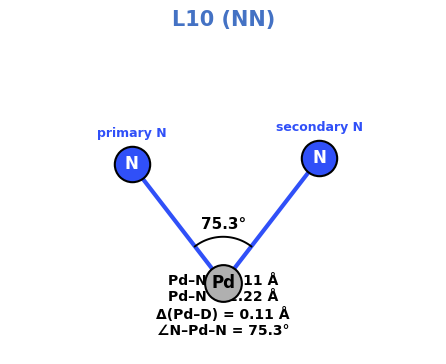

✓ L10 | Pd-N=2.107 Å | Pd-N=2.218 Å | Δ=0.112 Å | Bite=75.30°


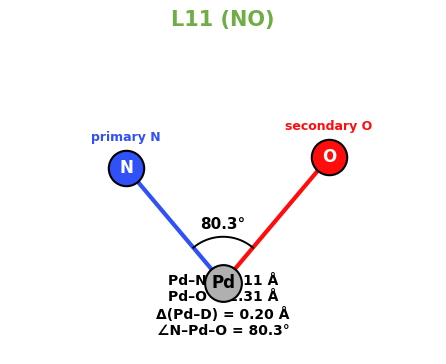

✓ L11 | Pd-N=2.115 Å | Pd-O=2.311 Å | Δ=0.196 Å | Bite=80.28°


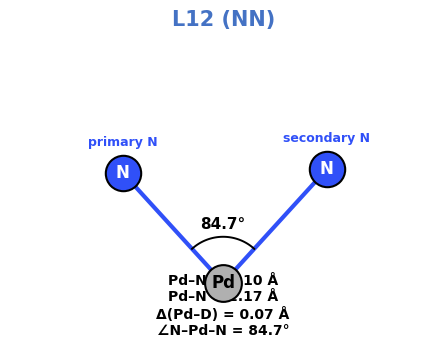

✓ L12 | Pd-N=2.101 Å | Pd-N=2.168 Å | Δ=0.068 Å | Bite=84.69°


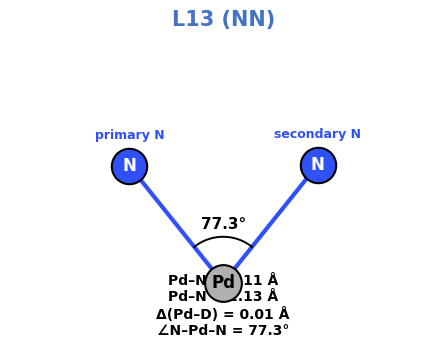

✓ L13 | Pd-N=2.113 Å | Pd-N=2.127 Å | Δ=0.014 Å | Bite=77.33°


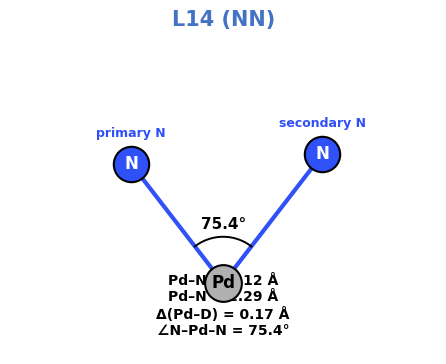

✓ L14 | Pd-N=2.121 Å | Pd-N=2.286 Å | Δ=0.166 Å | Bite=75.36°


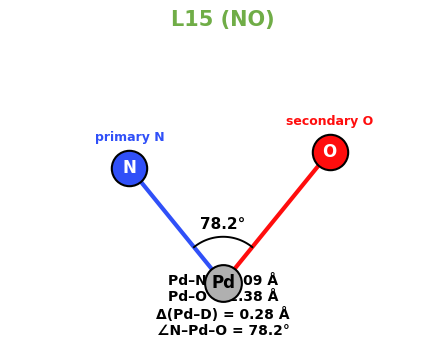

✓ L15 | Pd-N=2.093 Å | Pd-O=2.377 Å | Δ=0.284 Å | Bite=78.20°


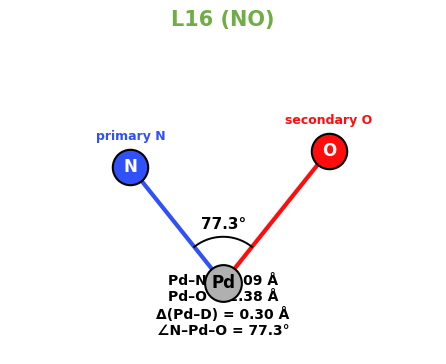

✓ L16 | Pd-N=2.089 Å | Pd-O=2.385 Å | Δ=0.296 Å | Bite=77.27°


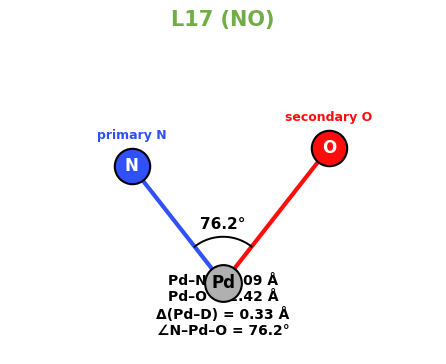

✓ L17 | Pd-N=2.086 Å | Pd-O=2.416 Å | Δ=0.331 Å | Bite=76.20°


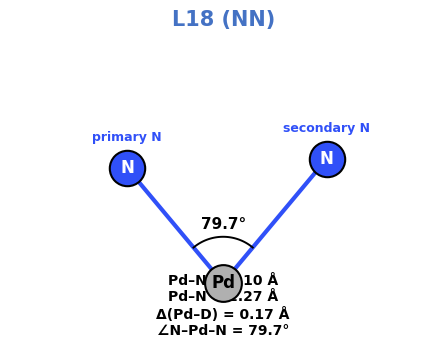

✓ L18 | Pd-N=2.104 Å | Pd-N=2.275 Å | Δ=0.171 Å | Bite=79.73°


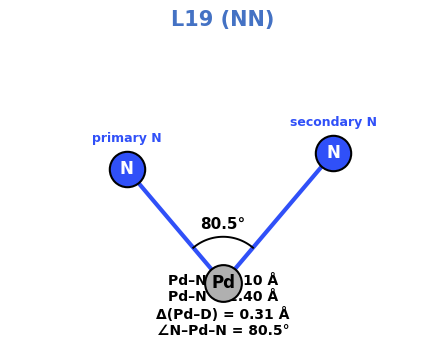

✓ L19 | Pd-N=2.096 Å | Pd-N=2.401 Å | Δ=0.305 Å | Bite=80.52°


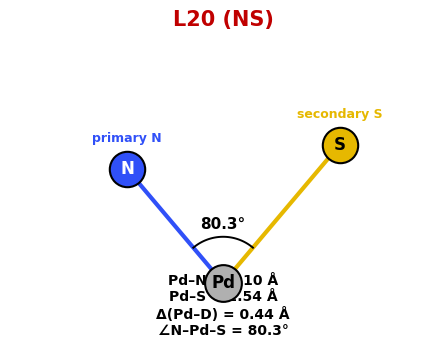

✓ L20 | Pd-N=2.096 Å | Pd-S=2.540 Å | Δ=0.444 Å | Bite=80.34°


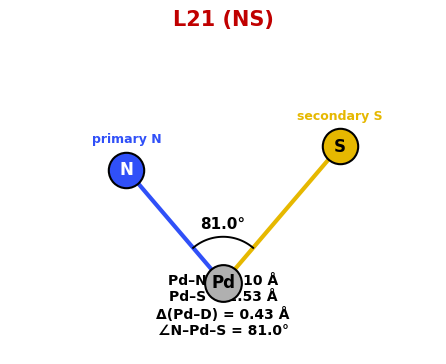

✓ L21 | Pd-N=2.098 Å | Pd-S=2.526 Å | Δ=0.428 Å | Bite=80.98°


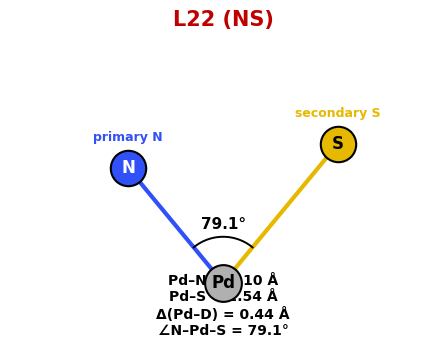

✓ L22 | Pd-N=2.102 Å | Pd-S=2.539 Å | Δ=0.437 Å | Bite=79.10°


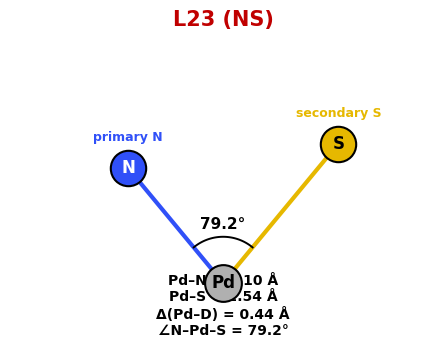

✓ L23 | Pd-N=2.100 Å | Pd-S=2.544 Å | Δ=0.444 Å | Bite=79.20°


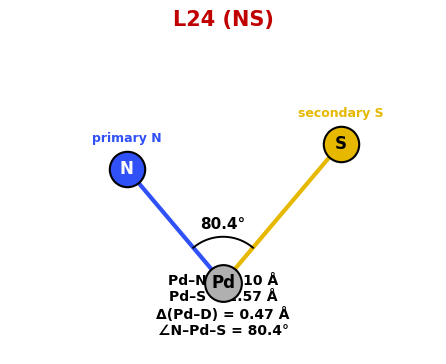

✓ L24 | Pd-N=2.103 Å | Pd-S=2.569 Å | Δ=0.466 Å | Bite=80.41°


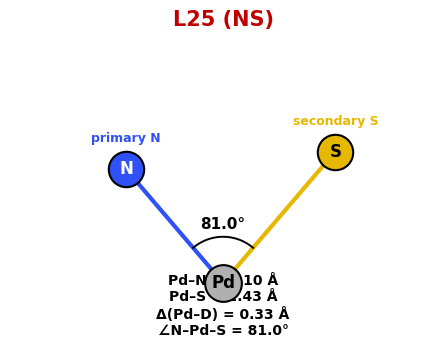

✓ L25 | Pd-N=2.100 Å | Pd-S=2.432 Å | Δ=0.332 Å | Bite=80.97°


In [ ]:
# ============================================================
# STEP 8 — COORDINATION-GEOMETRY FIGURE
# ============================================================
#
# Shows:
#
#       primary N
#           \
#            Pd
#           /
#       secondary N/O/S
#
# Quantities:
#   Pd-N(primary)
#   Pd-D2
#   Delta(Pd-D)
#   N-Pd-D bite angle
#
# The coordinates are derived from the ACTUAL XYZ geometry.
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


COORD_FOLDER = os.path.join(
    VBUR_FOLDER,
    "Coordination_Geometry"
)

os.makedirs(
    COORD_FOLDER,
    exist_ok=True
)


def angle_deg(a, b, c):

    v1 = (
        np.asarray(a)
        -
        np.asarray(b)
    )

    v2 = (
        np.asarray(c)
        -
        np.asarray(b)
    )

    cosine = (
        np.dot(v1, v2)
        /
        (
            np.linalg.norm(v1)
            *
            np.linalg.norm(v2)
        )
    )

    cosine = np.clip(
        cosine,
        -1.0,
        1.0
    )

    return np.degrees(
        np.arccos(cosine)
    )


coord_results = []


for _, row in oriented_df.iterrows():

    ligand = str(
        row["Ligand"]
    )

    ligand_class = str(
        row["Class"]
    )

    donor1 = int(
        row["Donor1"]
    )

    donor2 = int(
        row["Donor2"]
    )


    elements, coordinates = read_xyz_file(
        row["File"]
    )

    coordinates = np.asarray(
        coordinates,
        dtype=float
    )


    try:

        # ====================================================
        # SECONDARY DONOR
        # ====================================================

        (
            secondary_atom,
            secondary_element

        ) = identify_secondary_donor(
            elements,
            donor1,
            donor2,
            ligand_class
        )


        if secondary_atom == donor1:
            primary_atom = donor2
        else:
            primary_atom = donor1


        # ====================================================
        # COORDINATES
        # ====================================================

        pd_xyz = coordinates[
            PD_ATOM - 1
        ]

        n_xyz = coordinates[
            primary_atom - 1
        ]

        d_xyz = coordinates[
            secondary_atom - 1
        ]


        # ====================================================
        # DISTANCES + ANGLE
        # ====================================================

        pd_n = np.linalg.norm(
            n_xyz - pd_xyz
        )

        pd_d = np.linalg.norm(
            d_xyz - pd_xyz
        )

        delta = abs(
            pd_d - pd_n
        )

        bite = angle_deg(
            n_xyz,
            pd_xyz,
            d_xyz
        )


        # ====================================================
        # CONSTRUCT EXACT 2D REPRESENTATION
        #
        # Preserve:
        #   Pd-N distance
        #   Pd-D distance
        #   N-Pd-D angle
        # ====================================================

        Pd = np.array([
            0.0,
            0.0
        ])


        half = np.radians(
            bite / 2.0
        )


        N = np.array([
            -pd_n * np.sin(half),
             pd_n * np.cos(half)
        ])


        D = np.array([
             pd_d * np.sin(half),
             pd_d * np.cos(half)
        ])


        # ====================================================
        # FIGURE
        # ====================================================

        fig, ax = plt.subplots(
            figsize=(5.5, 5.5)
        )


        # Bonds
        ax.plot(
            [Pd[0], N[0]],
            [Pd[1], N[1]],
            linewidth=3,
            color=ATOM_COLORS["N"]
        )


        ax.plot(
            [Pd[0], D[0]],
            [Pd[1], D[1]],
            linewidth=3,
            color=ATOM_COLORS[
                secondary_element
            ]
        )


        # Pd
        ax.scatter(
            Pd[0],
            Pd[1],
            s=700,
            facecolor=ATOM_COLORS["Pd"],
            edgecolor="black",
            linewidth=1.5,
            zorder=10
        )

        ax.text(
            Pd[0],
            Pd[1],
            "Pd",
            ha="center",
            va="center",
            fontsize=12,
            fontweight="bold",
            zorder=11
        )


        # Primary N
        ax.scatter(
            N[0],
            N[1],
            s=650,
            facecolor=ATOM_COLORS["N"],
            edgecolor="black",
            linewidth=1.5,
            zorder=10
        )

        ax.text(
            N[0],
            N[1],
            "N",
            ha="center",
            va="center",
            color="white",
            fontsize=12,
            fontweight="bold",
            zorder=11
        )


        # Secondary donor
        ax.scatter(
            D[0],
            D[1],
            s=650,
            facecolor=ATOM_COLORS[
                secondary_element
            ],
            edgecolor="black",
            linewidth=1.5,
            zorder=10
        )


        donor_text_color = (
            "black"
            if secondary_element == "S"
            else "white"
        )


        ax.text(
            D[0],
            D[1],
            secondary_element,
            ha="center",
            va="center",
            color=donor_text_color,
            fontsize=12,
            fontweight="bold",
            zorder=11
        )


        # ====================================================
        # ANGLE ARC
        # ====================================================

        theta1 = (
            np.pi / 2
            -
            half
        )

        theta2 = (
            np.pi / 2
            +
            half
        )

        theta = np.linspace(
            theta1,
            theta2,
            100
        )

        arc_radius = 0.65

        ax.plot(
            arc_radius
            * np.cos(theta),
            arc_radius
            * np.sin(theta),
            linewidth=1.4,
            color="black"
        )


        ax.text(
            0,
            0.82,
            f"{bite:.1f}°",
            ha="center",
            va="center",
            fontsize=11,
            fontweight="bold"
        )


        # ====================================================
        # LABELS
        # ====================================================

        ax.text(
            N[0],
            N[1] + 0.38,
            "primary N",
            ha="center",
            fontsize=9,
            fontweight="bold",
            color=ATOM_COLORS["N"]
        )


        ax.text(
            D[0],
            D[1] + 0.38,
            f"secondary {secondary_element}",
            ha="center",
            fontsize=9,
            fontweight="bold",
            color=ATOM_COLORS[
                secondary_element
            ]
        )


        # ====================================================
        # NUMERICAL INFORMATION
        # ====================================================

        information = (
            f"Pd–N = {pd_n:.2f} Å\n"
            f"Pd–{secondary_element} = {pd_d:.2f} Å\n"
            f"Δ(Pd–D) = {delta:.2f} Å\n"
            f"∠N–Pd–{secondary_element} = {bite:.1f}°"
        )


        ax.text(
            0.50,
            0.05,
            information,
            transform=ax.transAxes,
            ha="center",
            va="bottom",
            fontsize=10,
            fontweight="bold"
        )


        ax.set_title(
            f"{ligand} ({ligand_class})",
            fontsize=15,
            fontweight="bold",
            color=CLASS_COLORS[
                ligand_class
            ]
        )


        ax.set_xlim(
            -3.0,
            3.0
        )

        ax.set_ylim(
            -1.0,
            3.5
        )

        ax.set_aspect(
            "equal"
        )

        ax.axis(
            "off"
        )


        output = os.path.join(
            COORD_FOLDER,
            f"{ligand}_{ligand_class}_"
            f"Coordination_Geometry.png"
        )


        fig.savefig(
            output,
            dpi=600,
            bbox_inches="tight",
            facecolor="white"
        )

        plt.show()
        plt.close(fig)


        coord_results.append({

            "Ligand":
                ligand,

            "Class":
                ligand_class,

            "Pd_N_primary_A":
                pd_n,

            f"Pd_{secondary_element}_secondary_A":
                pd_d,

            "Delta_Pd_Donor_A":
                delta,

            "Bite_Angle_deg":
                bite,
        })


        print(
            f"✓ {ligand} | "
            f"Pd-N={pd_n:.3f} Å | "
            f"Pd-{secondary_element}="
            f"{pd_d:.3f} Å | "
            f"Δ={delta:.3f} Å | "
            f"Bite={bite:.2f}°"
        )


    except Exception as error:

        print(
            f"COORD ERROR: "
            f"{ligand}: {error}"
        )

## STEP 9 — Pyramidalization / local distortion picture

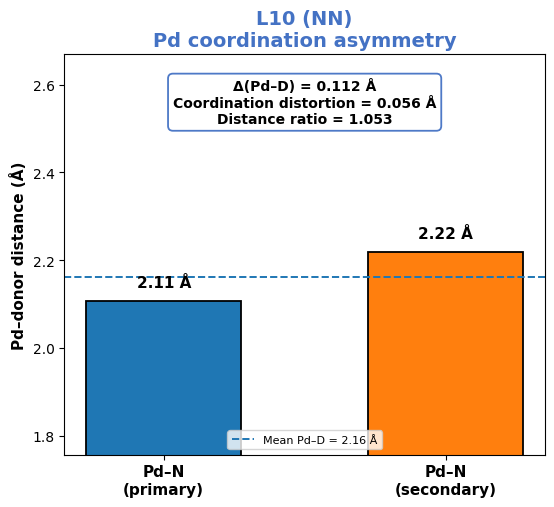

✓ L10  | NN | Pd–N = 2.107 Å | Pd–N = 2.218 Å | Δ = 0.112 Å | Distortion = 0.056 Å


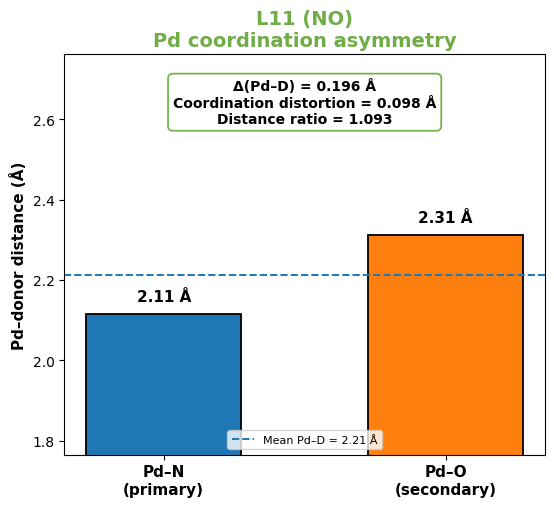

✓ L11  | NO | Pd–N = 2.115 Å | Pd–O = 2.311 Å | Δ = 0.196 Å | Distortion = 0.098 Å


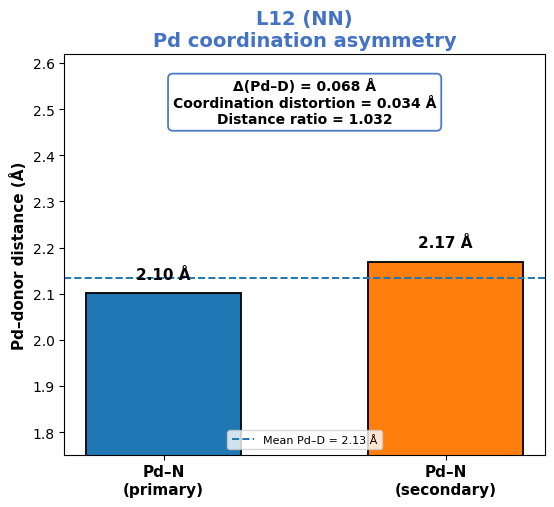

✓ L12  | NN | Pd–N = 2.101 Å | Pd–N = 2.168 Å | Δ = 0.068 Å | Distortion = 0.034 Å


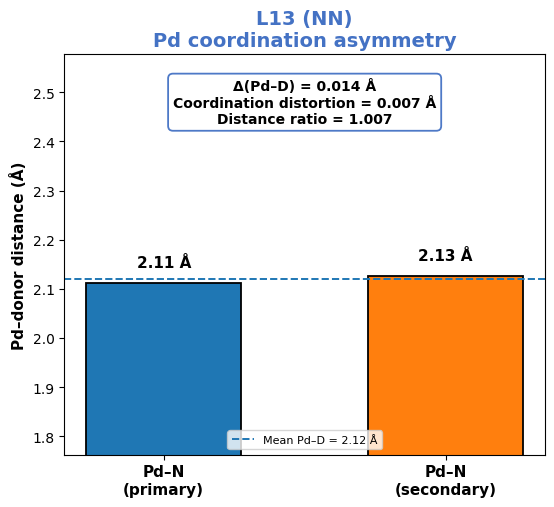

✓ L13  | NN | Pd–N = 2.113 Å | Pd–N = 2.127 Å | Δ = 0.014 Å | Distortion = 0.007 Å


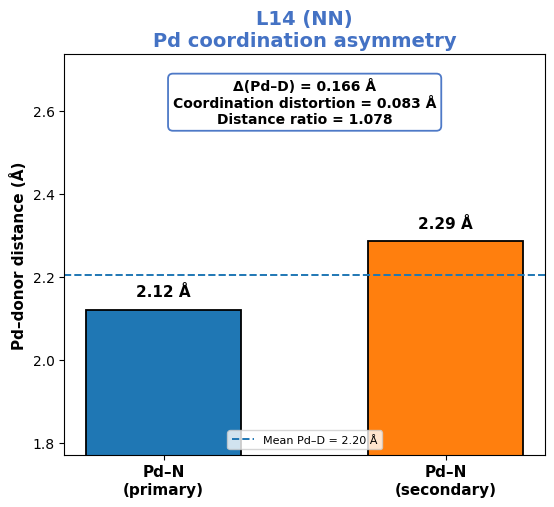

✓ L14  | NN | Pd–N = 2.121 Å | Pd–N = 2.286 Å | Δ = 0.166 Å | Distortion = 0.083 Å


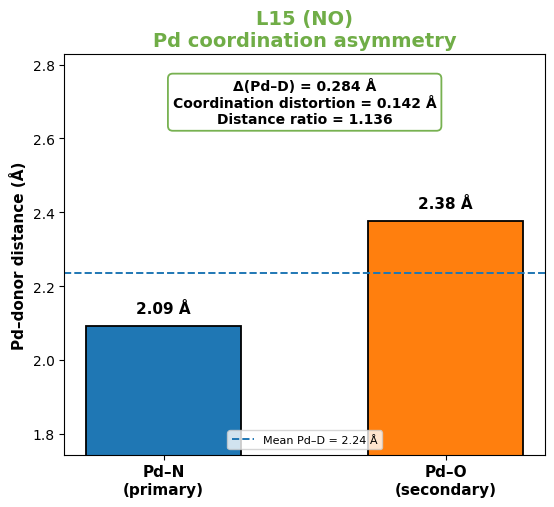

✓ L15  | NO | Pd–N = 2.093 Å | Pd–O = 2.377 Å | Δ = 0.284 Å | Distortion = 0.142 Å


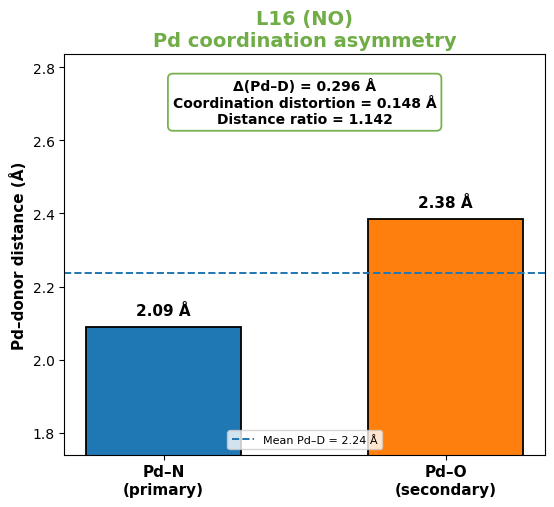

✓ L16  | NO | Pd–N = 2.089 Å | Pd–O = 2.385 Å | Δ = 0.296 Å | Distortion = 0.148 Å


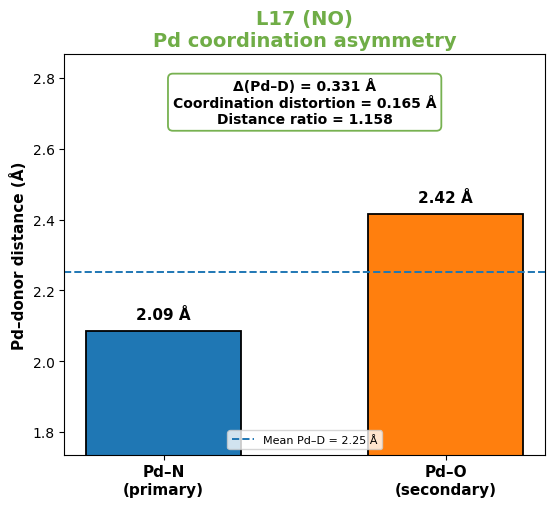

✓ L17  | NO | Pd–N = 2.086 Å | Pd–O = 2.416 Å | Δ = 0.331 Å | Distortion = 0.165 Å


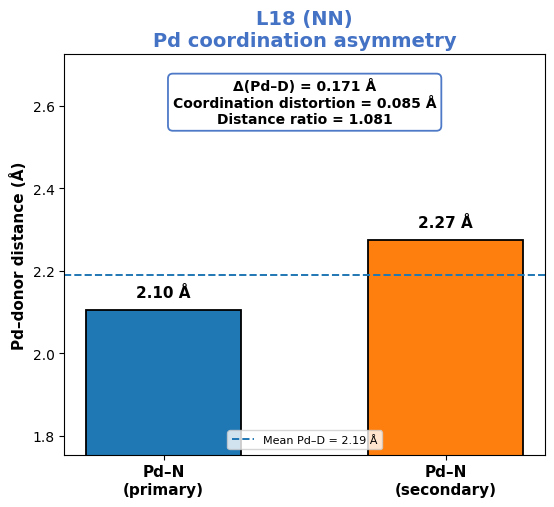

✓ L18  | NN | Pd–N = 2.104 Å | Pd–N = 2.275 Å | Δ = 0.171 Å | Distortion = 0.085 Å


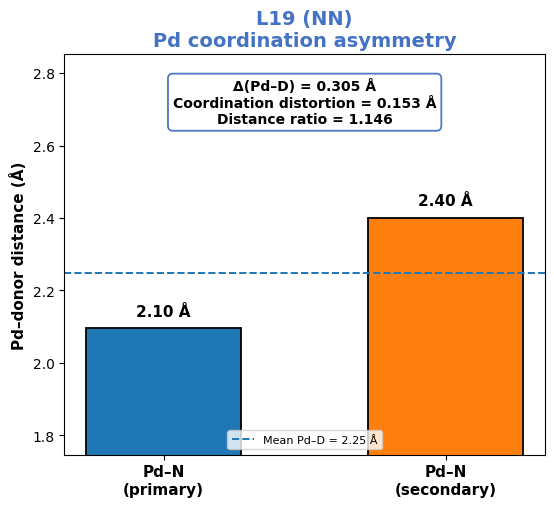

✓ L19  | NN | Pd–N = 2.096 Å | Pd–N = 2.401 Å | Δ = 0.305 Å | Distortion = 0.153 Å


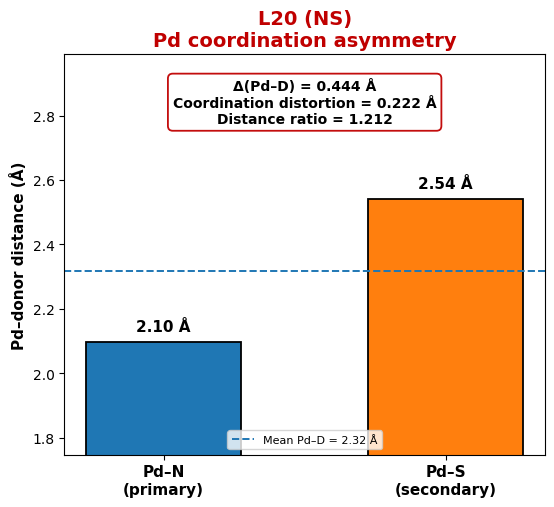

✓ L20  | NS | Pd–N = 2.096 Å | Pd–S = 2.540 Å | Δ = 0.444 Å | Distortion = 0.222 Å


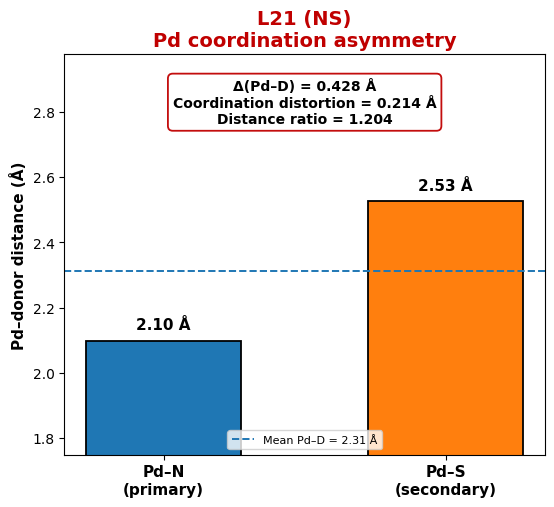

✓ L21  | NS | Pd–N = 2.098 Å | Pd–S = 2.526 Å | Δ = 0.428 Å | Distortion = 0.214 Å


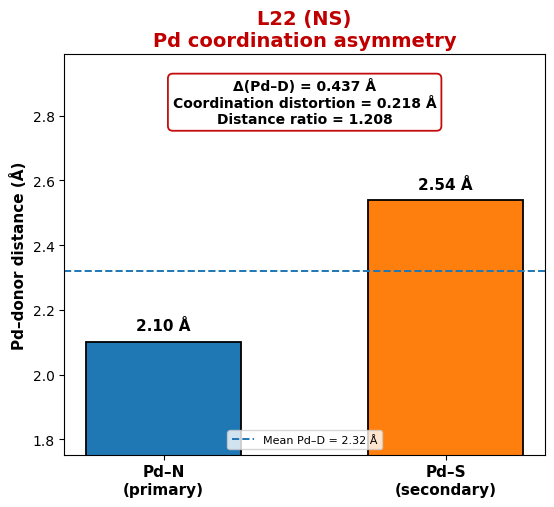

✓ L22  | NS | Pd–N = 2.102 Å | Pd–S = 2.539 Å | Δ = 0.437 Å | Distortion = 0.218 Å


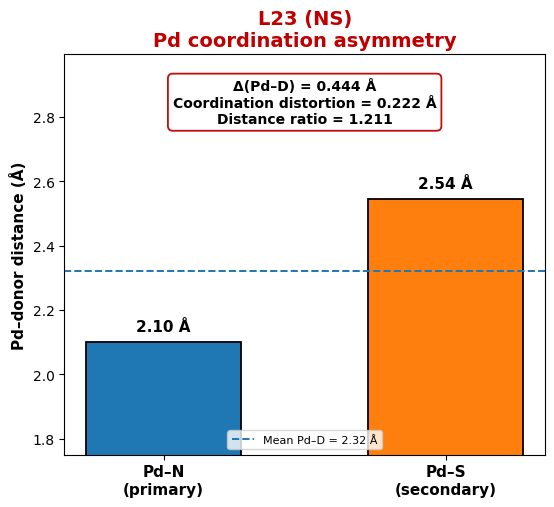

✓ L23  | NS | Pd–N = 2.100 Å | Pd–S = 2.544 Å | Δ = 0.444 Å | Distortion = 0.222 Å


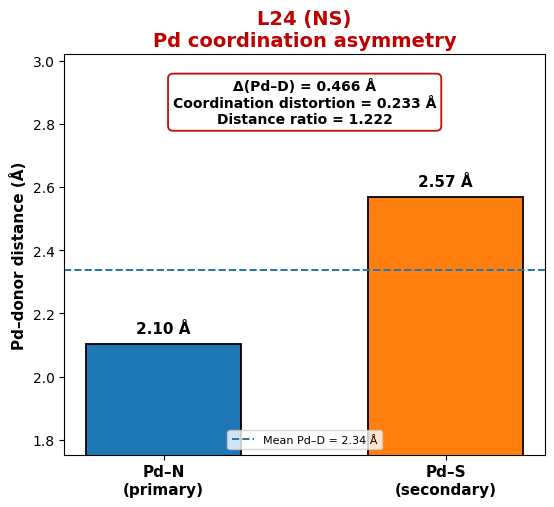

✓ L24  | NS | Pd–N = 2.103 Å | Pd–S = 2.569 Å | Δ = 0.466 Å | Distortion = 0.233 Å


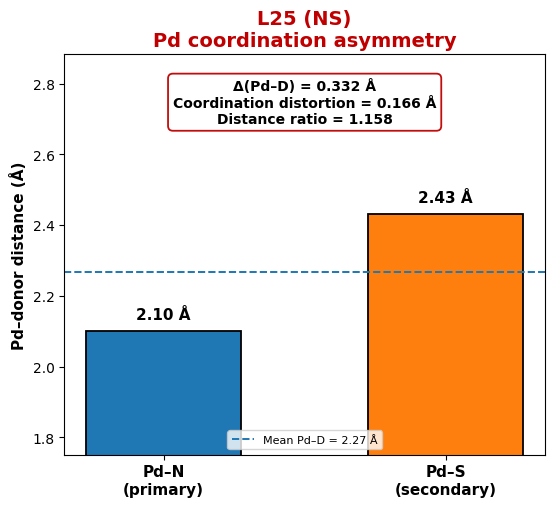

✓ L25  | NS | Pd–N = 2.100 Å | Pd–S = 2.432 Å | Δ = 0.332 Å | Distortion = 0.166 Å


Pd COORDINATION DISTORTION RESULTS


,Ligand,Class,SecondaryDonor,Pd_N_primary_A,Pd_Secondary_A,Average_Pd_Donor_A,Delta_Pd_Donor_A,Pd_Coordination_Distortion_A,Pd_Donor_Distance_Ratio
0,L10,NN,N,2.1067,2.2185,2.1626,0.1117,0.0559,1.0530
1,L11,NO,O,2.1150,2.3112,2.2131,0.1962,0.0981,1.0928
2,L12,NN,N,2.1009,2.1685,2.1347,0.0676,0.0338,1.0322
3,L13,NN,N,2.1126,2.1267,2.1197,0.0142,0.0071,1.0067
4,L14,NN,N,2.1206,2.2864,2.2035,0.1658,0.0829,1.0782
5,L15,NO,O,2.0932,2.3773,2.2352,0.2842,0.1421,1.1358
6,L16,NO,O,2.0892,2.3850,2.2371,0.2958,0.1479,1.1416
7,L17,NO,O,2.0856,2.4162,2.2509,0.3306,0.1653,1.1585
8,L18,NN,N,2.1041,2.2747,2.1894,0.1706,0.0853,1.0811
9,L19,NN,N,2.0963,2.4015,2.2489,0.3052,0.1526,1.1456




NN / NO / NS CLASS SUMMARY


Pd_N_primary_A         Pd_Secondary_A         Delta_Pd_Donor_A          \
                mean     std           mean     std             mean     std   
Class                                                                          
NN            2.1069  0.0087         2.2460  0.0976           0.1392  0.1008   
NO            2.0957  0.0132         2.3724  0.0441           0.2767  0.0571   
NS            2.0999  0.0024         2.5252  0.0476           0.4252  0.0474   

      Pd_Coordination_Distortion_A         Pd_Donor_Distance_Ratio          
                              mean     std                    mean     std  
Class                                                                       
NN                          0.0696  0.0504                  1.0661  0.0480  
NO                          0.1383  0.0286                  1.1322  0.0280  
NS                          0.2126  0.0237                  1.2025  0.0225

In [ ]:
# ============================================================
# STEP 9 — Pd COORDINATION ASYMMETRY / DISTORTION
# ============================================================
#
# This matches the descriptor already used in your analysis:
#
#   Delta_Pd_Donor_Distance_A = |d1 - d2|
#
#   Pd_Coordination_Distortion_A
#       = sqrt(((d1-avg)^2 + (d2-avg)^2)/2)
#       = Delta_Pd_Donor_Distance_A / 2
#
# IMPORTANT:
# This is NOT pyramidalization and NOT out-of-plane distortion.
#
# Purpose:
#   Directly visualize increasing asymmetry of
#   NN -> NO -> NS coordination.
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# OUTPUT FOLDER
# ============================================================

DISTORTION_FOLDER = os.path.join(
    VBUR_FOLDER,
    "Pd_Coordination_Distortion"
)

os.makedirs(
    DISTORTION_FOLDER,
    exist_ok=True
)


# ============================================================
# RESULTS
# ============================================================

distortion_results = []


# ============================================================
# LOOP
# ============================================================

for _, row in oriented_df.iterrows():

    ligand = str(
        row["Ligand"]
    )

    ligand_class = str(
        row["Class"]
    )

    donor1 = int(
        row["Donor1"]
    )

    donor2 = int(
        row["Donor2"]
    )


    try:

        # ====================================================
        # READ XYZ
        # ====================================================

        elements, coordinates = read_xyz_file(
            row["File"]
        )

        coordinates = np.asarray(
            coordinates,
            dtype=float
        )


        # ====================================================
        # IDENTIFY SECONDARY DONOR
        # ====================================================

        (
            secondary_atom,
            secondary_element

        ) = identify_secondary_donor(
            elements,
            donor1,
            donor2,
            ligand_class
        )


        # ====================================================
        # PRIMARY N
        # ====================================================

        if secondary_atom == donor1:

            primary_atom = donor2

        else:

            primary_atom = donor1


        # ====================================================
        # COORDINATES
        # ====================================================

        pd_xyz = coordinates[
            PD_ATOM - 1
        ]

        primary_xyz = coordinates[
            primary_atom - 1
        ]

        secondary_xyz = coordinates[
            secondary_atom - 1
        ]


        # ====================================================
        # TRUE Pd–DONOR DISTANCES
        # ====================================================

        d_primary = float(
            np.linalg.norm(
                primary_xyz
                -
                pd_xyz
            )
        )


        d_secondary = float(
            np.linalg.norm(
                secondary_xyz
                -
                pd_xyz
            )
        )


        # ====================================================
        # SAME DEFINITIONS AS ORIGINAL DESCRIPTOR CODE
        # ====================================================

        average_distance = (
            d_primary
            +
            d_secondary
        ) / 2.0


        delta_distance = abs(
            d_primary
            -
            d_secondary
        )


        coordination_distortion = np.sqrt(
            (
                (d_primary - average_distance)**2
                +
                (d_secondary - average_distance)**2
            )
            / 2.0
        )


        distance_ratio = (
            max(
                d_primary,
                d_secondary
            )
            /
            min(
                d_primary,
                d_secondary
            )
        )


        # ====================================================
        # STORE
        # ====================================================

        distortion_results.append({

            "Ligand":
                ligand,

            "Class":
                ligand_class,

            "SecondaryDonor":
                secondary_element,

            "Pd_N_primary_A":
                d_primary,

            "Pd_Secondary_A":
                d_secondary,

            "Average_Pd_Donor_A":
                average_distance,

            "Delta_Pd_Donor_A":
                delta_distance,

            "Pd_Coordination_Distortion_A":
                coordination_distortion,

            "Pd_Donor_Distance_Ratio":
                distance_ratio,
        })


        # ====================================================
        # FIGURE
        # ====================================================

        fig, ax = plt.subplots(
            figsize=(6.2, 5.2)
        )


        # ----------------------------------------------------
        # X positions
        # ----------------------------------------------------

        x_primary = 0
        x_secondary = 1


        # ----------------------------------------------------
        # Pd-donor distances
        # ----------------------------------------------------

        ax.bar(
            x_primary,
            d_primary,
            width=0.55,
            edgecolor="black",
            linewidth=1.3
        )


        ax.bar(
            x_secondary,
            d_secondary,
            width=0.55,
            edgecolor="black",
            linewidth=1.3
        )


        # ====================================================
        # DISTANCE VALUES
        # ====================================================

        ax.text(
            x_primary,
            d_primary + 0.025,

            f"{d_primary:.2f} Å",

            ha="center",
            va="bottom",

            fontsize=11,
            fontweight="bold"
        )


        ax.text(
            x_secondary,
            d_secondary + 0.025,

            f"{d_secondary:.2f} Å",

            ha="center",
            va="bottom",

            fontsize=11,
            fontweight="bold"
        )


        # ====================================================
        # AVERAGE-DISTANCE LINE
        # ====================================================

        ax.axhline(
            average_distance,

            linestyle="--",

            linewidth=1.4,

            label=(
                f"Mean Pd–D = "
                f"{average_distance:.2f} Å"
            )
        )


        # ====================================================
        # X LABELS
        # ====================================================

        ax.set_xticks(
            [
                x_primary,
                x_secondary
            ]
        )


        ax.set_xticklabels(
            [
                "Pd–N\n(primary)",

                f"Pd–{secondary_element}\n"
                "(secondary)"
            ],

            fontsize=11,
            fontweight="bold"
        )


        # ====================================================
        # Y AXIS
        # ====================================================

        ax.set_ylabel(
            "Pd–donor distance (Å)",

            fontsize=11,
            fontweight="bold"
        )


        # ====================================================
        # TITLE
        # ====================================================

        ax.set_title(
            (
                f"{ligand} ({ligand_class})\n"
                "Pd coordination asymmetry"
            ),

            fontsize=14,
            fontweight="bold",

            color=CLASS_COLORS[
                ligand_class
            ]
        )


        # ====================================================
        # DESCRIPTOR INFORMATION
        # ====================================================

        information = (

            f"Δ(Pd–D) = "
            f"{delta_distance:.3f} Å\n"

            f"Coordination distortion = "
            f"{coordination_distortion:.3f} Å\n"

            f"Distance ratio = "
            f"{distance_ratio:.3f}"
        )


        ax.text(
            0.50,
            0.94,

            information,

            transform=ax.transAxes,

            ha="center",
            va="top",

            fontsize=10,
            fontweight="bold",

            bbox={
                "boxstyle":
                    "round,pad=0.35",

                "facecolor":
                    "white",

                "edgecolor":
                    CLASS_COLORS[
                        ligand_class
                    ],

                "linewidth":
                    1.3,

                "alpha":
                    0.95
            }
        )


        # ====================================================
        # Y RANGE
        # ====================================================

        ymax = max(
            d_primary,
            d_secondary
        ) + 0.45


        ymin = max(
            0,
            min(
                d_primary,
                d_secondary
            ) - 0.35
        )


        ax.set_ylim(
            ymin,
            ymax
        )


        ax.legend(
            loc="lower center",
            fontsize=8
        )


        # ====================================================
        # SAVE
        # ====================================================

        output = os.path.join(

            DISTORTION_FOLDER,

            f"{ligand}_"
            f"{ligand_class}_"
            f"Pd_Coordination_Distortion.png"
        )


        fig.savefig(
            output,

            dpi=600,

            bbox_inches="tight",

            facecolor="white"
        )


        plt.show()

        plt.close(fig)


        # ====================================================
        # PRINT
        # ====================================================

        print(

            f"✓ {ligand:4s} | "

            f"{ligand_class:2s} | "

            f"Pd–N = "
            f"{d_primary:.3f} Å | "

            f"Pd–{secondary_element} = "
            f"{d_secondary:.3f} Å | "

            f"Δ = "
            f"{delta_distance:.3f} Å | "

            f"Distortion = "
            f"{coordination_distortion:.3f} Å"
        )


    except Exception as error:

        print(

            f"DISTORTION ERROR: "
            f"{ligand}: "
            f"{error}"
        )


# ============================================================
# DATAFRAME
# ============================================================

distortion_df = pd.DataFrame(
    distortion_results
)


# ============================================================
# CLASS SUMMARY
# ============================================================

class_distortion_summary = (

    distortion_df

    .groupby(
        "Class"
    )[
        [
            "Pd_N_primary_A",
            "Pd_Secondary_A",
            "Delta_Pd_Donor_A",
            "Pd_Coordination_Distortion_A",
            "Pd_Donor_Distance_Ratio",
        ]
    ]

    .agg(
        [
            "mean",
            "std"
        ]
    )
)


# ============================================================
# EXPORT
# ============================================================

excel_output = os.path.join(
    DISTORTION_FOLDER,
    "Pd_Coordination_Distortion_Results.xlsx"
)


with pd.ExcelWriter(
    excel_output
) as writer:

    distortion_df.to_excel(
        writer,
        sheet_name="All_Ligands",
        index=False
    )

    class_distortion_summary.to_excel(
        writer,
        sheet_name="Class_Summary"
    )


# ============================================================
# DISPLAY
# ============================================================

print("\n")
print("=" * 75)
print("Pd COORDINATION DISTORTION RESULTS")
print("=" * 75)

display(
    distortion_df.round(4)
)


print("\n")
print("=" * 75)
print("NN / NO / NS CLASS SUMMARY")
print("=" * 75)

display(
    class_distortion_summary.round(4)
)